## Gráficos de Análise Exploratória de Dados (EDA) - NFTs Comuns Março/2023 - Histogramas, Gráficos de Linha, Boxplots, Gráficos de Áreas 

## Packages and libraries

In [1]:
!pip install plotnine

# importar pacotes
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import glob

import matplotlib.dates as mdates
import datetime

from plotnine import ggplot, aes
from plotnine.geoms import geom_point
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

## DataSet

### Sentença SQL realizada do Google BigQuery para NFT's Comuns


*  SELECT
  A.BLOCK_TIMESTAMP,
  A.FROM_ADDRESS,
  A.TO_ADDRESS,
  A.VALUE,
  A.TRANSACTION_HASH,
  B.NONCE,
  B.FROM_ADDRESS AS FROM_ADDRESS_BLOCKCHAIN,
  B.TO_ADDRESS AS TO_ADDRESS_BLOCKCHAIN,
  B.GAS,
  B.RECEIPT_GAS_USED
FROM
  `bigquery-public-data.crypto_ethereum.token_transfers` AS A
INNER JOIN
  `bigquery-public-data.crypto_ethereum.transactions` AS B
ON
  A.transaction_hash = B.HASH
WHERE
  A.TOKEN_ADDRESS = `#hash_nft_comum`
  AND A.BLOCK_TIMESTAMP >= (
  SELECT
    MIN(block_timestamp)
  FROM
    `bigquery-public-data.crypto_ethereum.contracts`
  WHERE
    address = `#hash_nft_comum`)
ORDER BY
  A.BLOCK_TIMESTAMP

O dataframe resultante da sentença SQL realizada no Google BigQuery contém informações sobre as transferências de tokens da blockchain Ethereum, relacionando as tabelas token_transfers e transactions. Os campos do dataframe são:

* BLOCK_TIMESTAMP: timestamp do bloco em que a transferência foi registrada.
* FROM_ADDRESS: endereço da carteira que enviou os tokens.
* TO_ADDRESS: endereço da carteira que recebeu os tokens.
* VALUE: valor da transferência em wei, a menor unidade de ether (a criptomoeda da Ethereum).
* TRANSACTION_HASH: hash da transação na blockchain Ethereum.
* NONCE: número de sequência da transação na carteira que a criou.
* FROM_ADDRESS_BLOCKCHAIN: endereço da carteira que enviou a transação na blockchain Ethereum.
* TO_ADDRESS_BLOCKCHAIN: endereço da carteira que recebeu a transação na blockchain Ethereum.
* GAS: quantidade de gas (unidade de custo de processamento na Ethereum) usada pela transação.
* RECEIPT_GAS_USED: quantidade de gas usada para executar a transferência de tokens.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
def lista_df():
  # Crie uma lista vazia para armazenar os dataframes
  df_list = []

  # Localize todos os arquivos CSV no diretório atual
  for filename in glob.glob("/content/drive/MyDrive/Dataset/NFT/CSV/2023/Comuns/*.csv"):
      # Leia o arquivo CSV em um dataframe
      df = pd.read_csv(filename)
      # Adicione o dataframe à lista
      df_list.append(df)

  return df_list

In [4]:
list_df_comum = []
list_df_comum = lista_df()
len(list_df_comum)

24

In [5]:
tipos_dos_elementos = set(type(elemento) for elemento in list_df_comum)
print(tipos_dos_elementos)

{<class 'pandas.core.frame.DataFrame'>}


In [6]:
list_df_comum[1].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6765 entries, 0 to 6764
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   BLOCK_TIMESTAMP          6765 non-null   object
 1   FROM_ADDRESS             6765 non-null   object
 2   TO_ADDRESS               6765 non-null   object
 3   VALUE                    6765 non-null   int64 
 4   TRANSACTION_HASH         6765 non-null   object
 5   NONCE                    6765 non-null   int64 
 6   FROM_ADDRESS_BLOCKCHAIN  6765 non-null   object
 7   TO_ADDRESS_BLOCKCHAIN    6765 non-null   object
 8   GAS                      6765 non-null   int64 
 9   RECEIPT_GAS_USED         6765 non-null   int64 
dtypes: int64(4), object(6)
memory usage: 528.6+ KB


In [7]:
for i in range(len(list_df_comum)):

    df = list_df_comum[i]

    # Convertendo a coluna 'BLOCK_TIMESTAMP' para o tipo datetime
    df['BLOCK_TIMESTAMP'] = pd.to_datetime(df['BLOCK_TIMESTAMP'])

    # Criando uma nova coluna com a data (sem o horário) dos blocos
    df['BLOCK_DATE'] = df['BLOCK_TIMESTAMP'].dt.date

    # Exclui registros que possuem o endereço '0x0000000000000000000000000000000000000000' na coluna FROM_ADDRESS, pois siginifica a criação do token
    df.drop(df[df['FROM_ADDRESS'] == '0x0000000000000000000000000000000000000000'].index, inplace=True)

In [ ]:
# df_concatenado = pd.concat(list_df_comum)

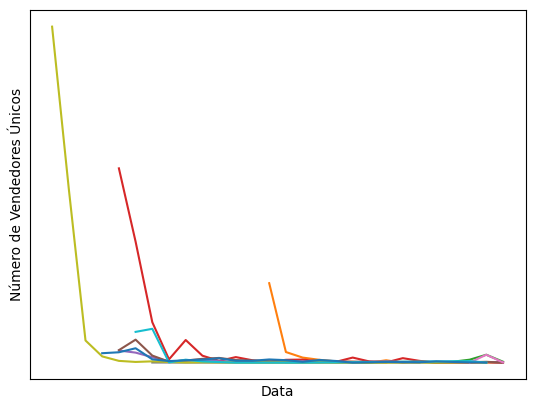

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Índices dos dataframes desejados
indices_selecionados = [4, 6, 8, 11, 12, 14, 15, 17, 19, 20, 22]

# Criar uma figura
fig, ax = plt.subplots()

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_comum[i]

    # Agrupar os dados por data e FROM_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])['FROM_ADDRESS'].nunique()

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line', label=f'NFT Comum {i}')

# Remover rótulos dos eixos x e y
plt.xticks([])
plt.yticks([])
plt.xlabel('Data')
plt.ylabel('Número de Vendedores Únicos')

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.35, 1))

# Exibir o gráfico
plt.show()


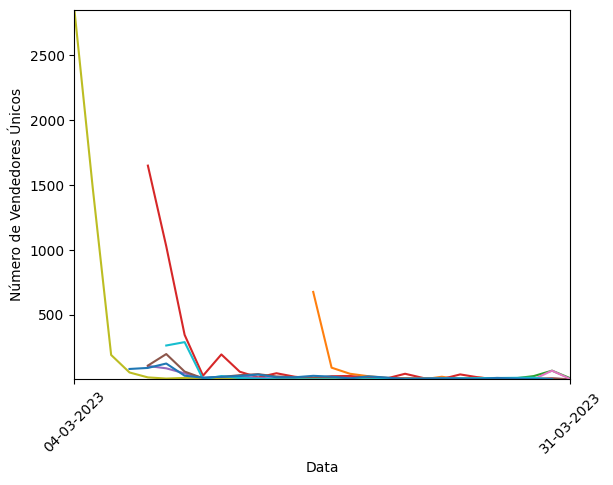

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [4, 6, 8, 11, 12, 14, 15, 17, 19, 20, 22]

# Criar uma figura
fig, ax = plt.subplots()

# Listas para armazenar os valores mínimos e máximos de vendedores
min_values = []
max_values = []

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_comum[i]

    # Agrupar os dados por data e FROM_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])['FROM_ADDRESS'].nunique()

    # Calcular o valor mínimo e máximo de vendedores
    min_values.append(unique_users.groupby('BLOCK_DATE').count().min())
    max_values.append(unique_users.groupby('BLOCK_DATE').count().max())

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line', label=f'NFT Comum {i}')

# Configurar os rótulos do eixo x para exibir dia, mês e ano
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

# Definir os limites do eixo x com base nas datas mínimas e máximas dos índices selecionados
plt.xlim(min(df['BLOCK_DATE'].min() for i, df in enumerate(list_df_comum) if i in indices_selecionados),
         max(df['BLOCK_DATE'].max() for i, df in enumerate(list_df_comum) if i in indices_selecionados))

# Definir os limites do eixo y com base nos valores mínimos e máximos
plt.ylim(min(min_values), max(max_values))

# Remover rótulos dos eixos x e y
plt.xticks(rotation=45)
plt.xlabel('Data')
plt.ylabel('Número de Vendedores Únicos')

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.35, 1))

# Exibir o gráfico
plt.show()


Arquivo 1


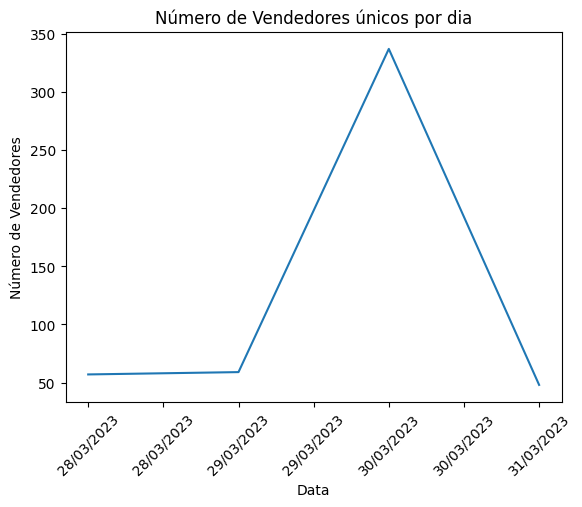

Arquivo 2


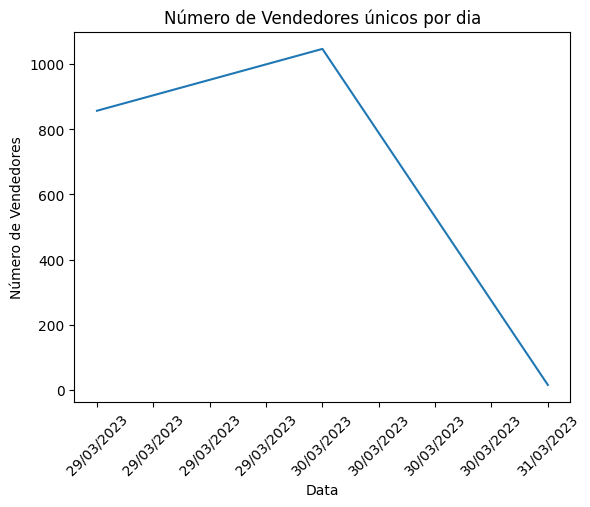

Arquivo 3


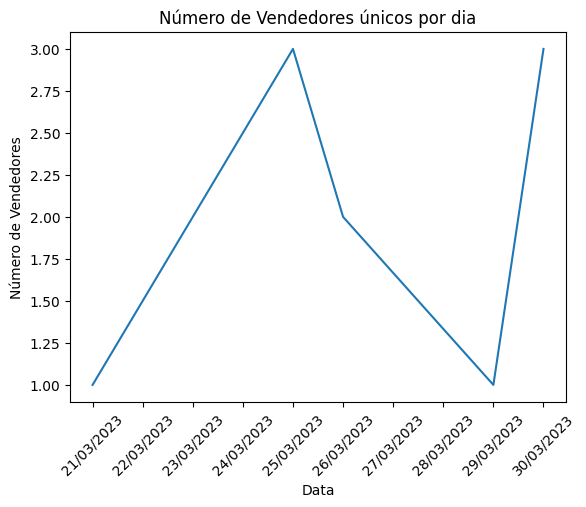

Arquivo 4


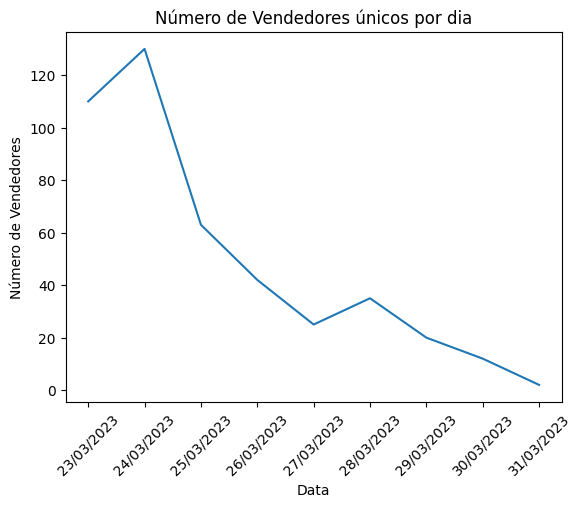

Arquivo 5


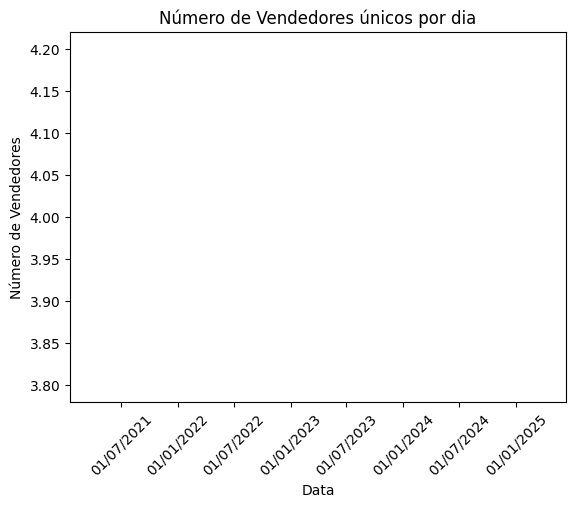

Arquivo 6


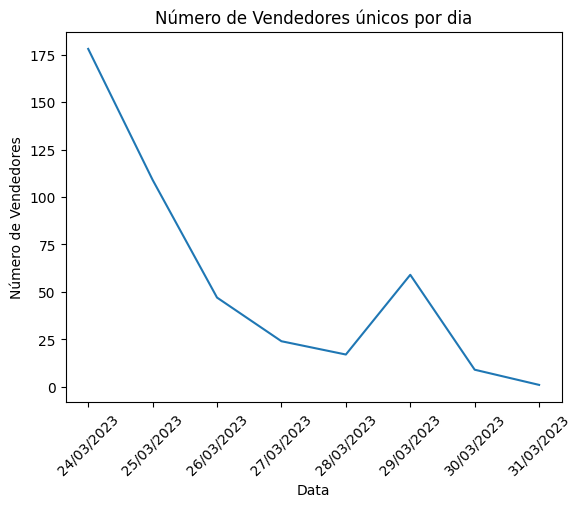

Arquivo 7


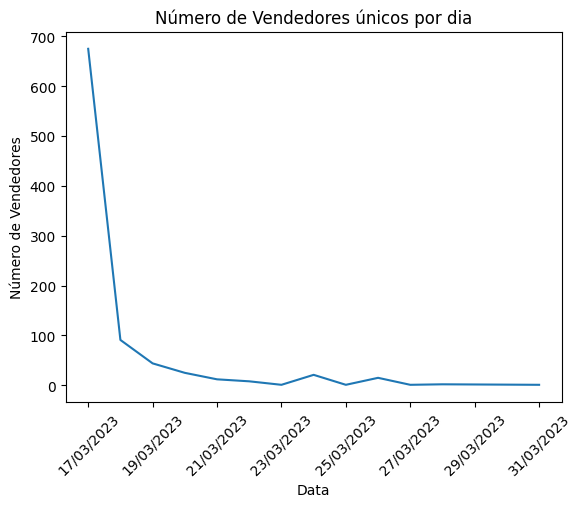

Arquivo 8


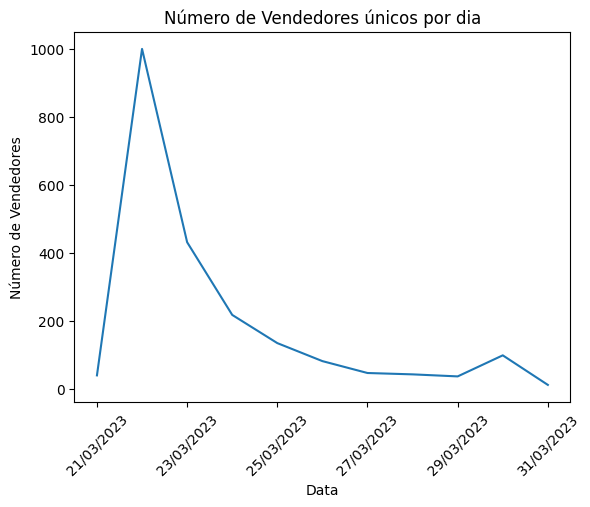

Arquivo 9


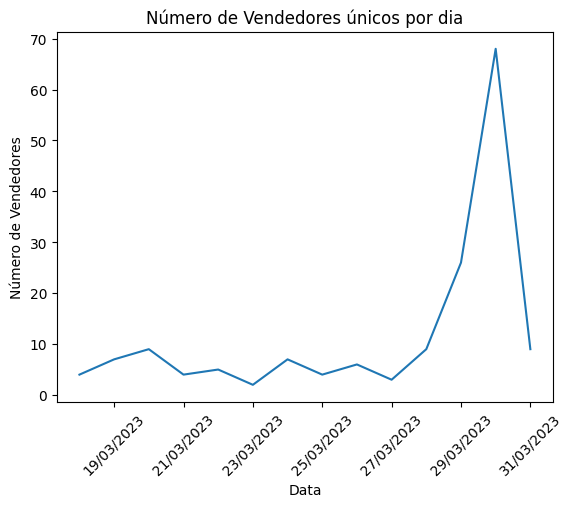

Arquivo 10


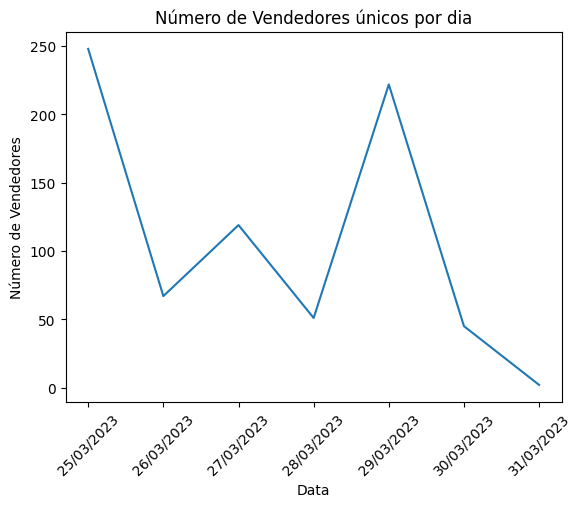

Arquivo 11


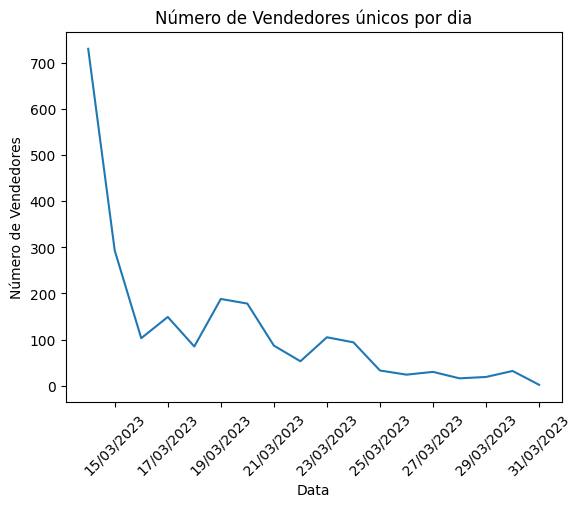

Arquivo 12


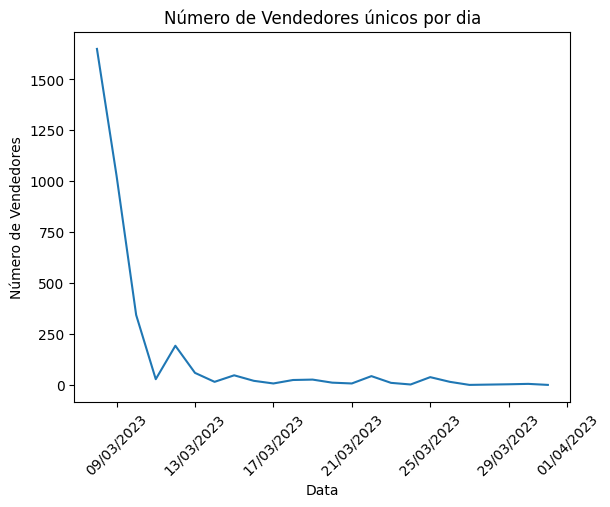

Arquivo 13


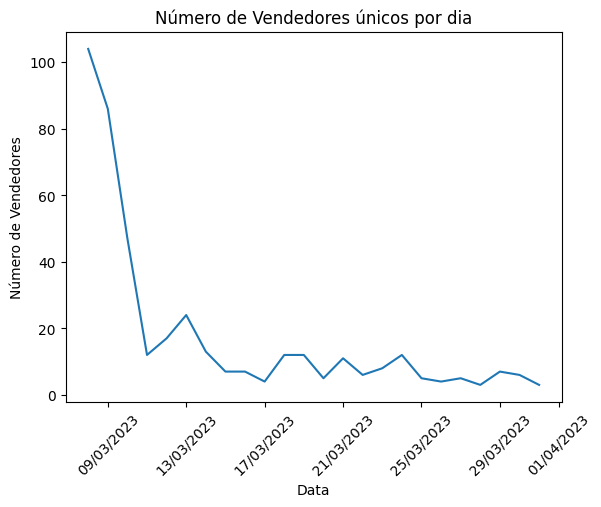

Arquivo 14


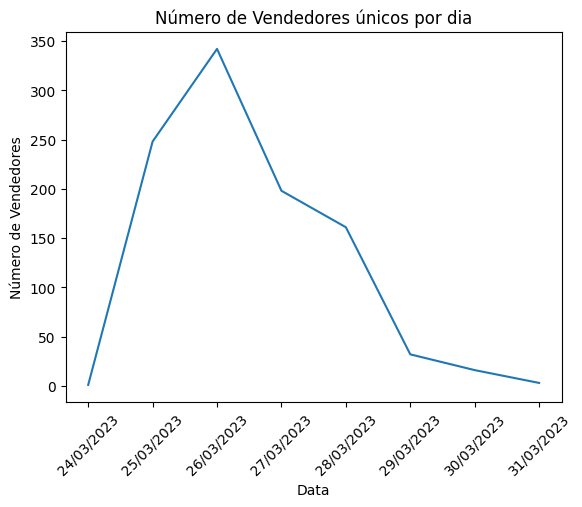

Arquivo 15


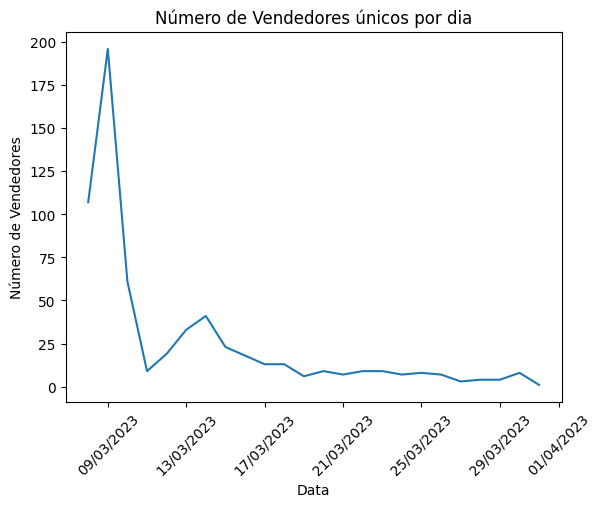

Arquivo 16


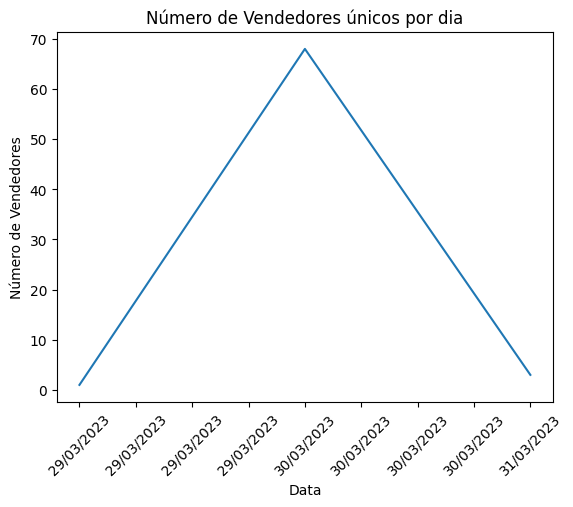

Arquivo 17


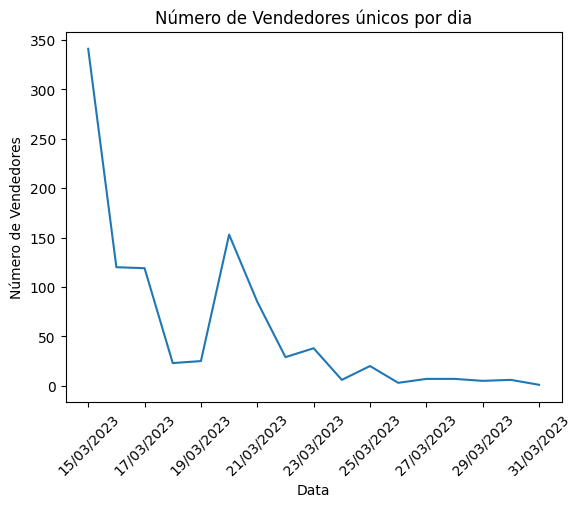

Arquivo 18


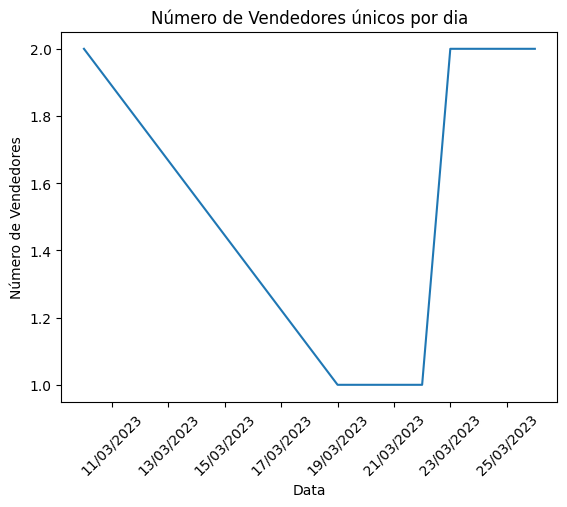

Arquivo 19


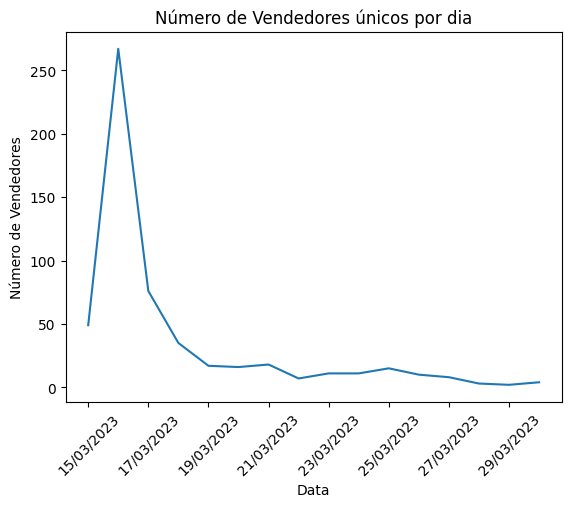

Arquivo 20


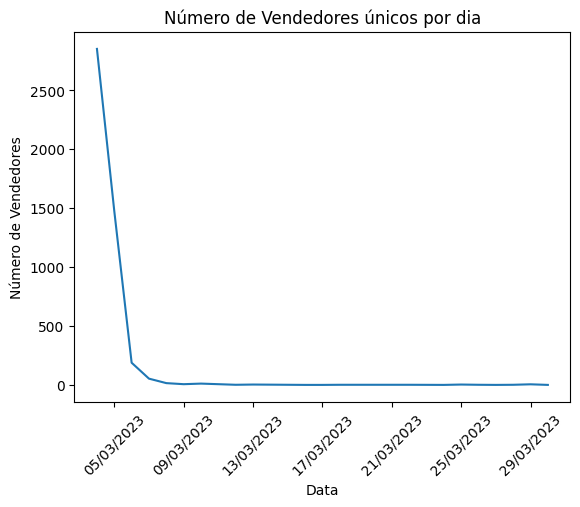

Arquivo 21


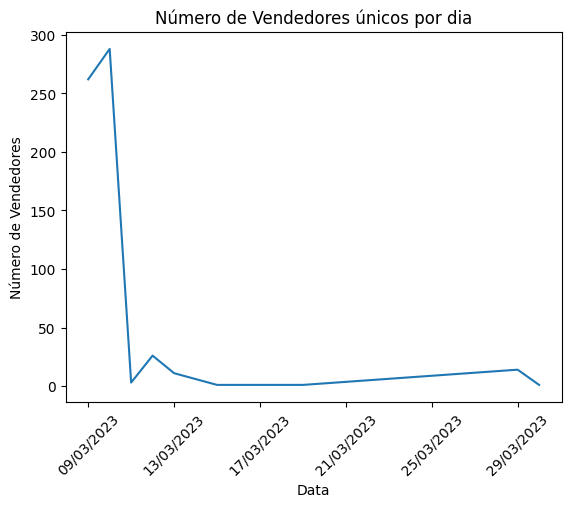

Arquivo 22


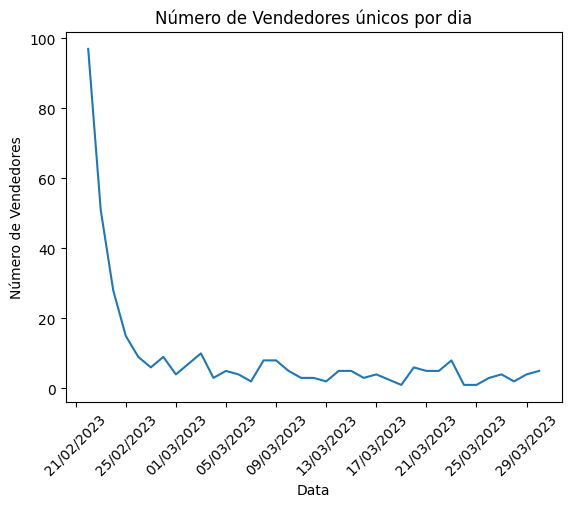

Arquivo 23


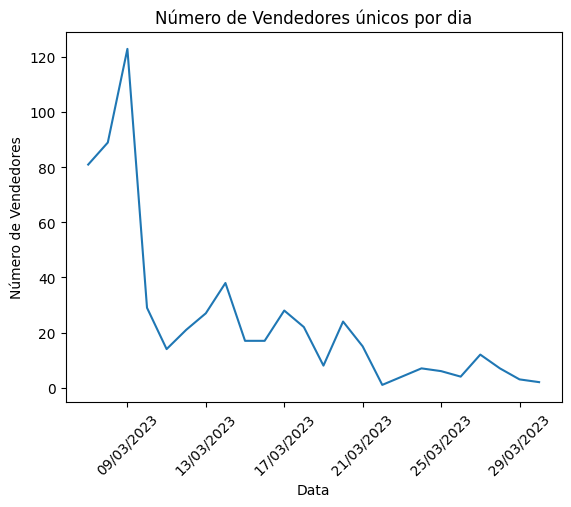

Arquivo 24


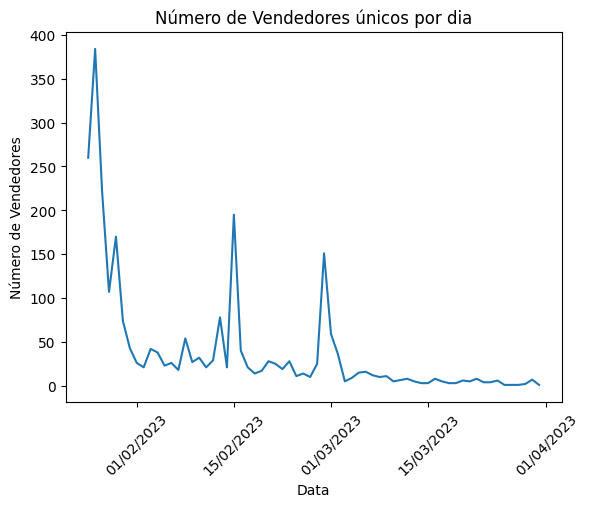

In [ ]:
for i in range(len(list_df_comum)):
    df = list_df_comum[i]

    # Agrupar os dados por data e FROM_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])['FROM_ADDRESS'].nunique()

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line')

    # Ajustar os rótulos do eixo X
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%Y'))
    plt.xticks(rotation=45)

    plt.title('Número de Vendedores únicos por dia')
    plt.xlabel('Data')
    plt.ylabel('Número de Vendedores')
    print("Arquivo " + str(i+1))
    plt.show()

In [ ]:
num_sellers = []
num_buyers = []

for i in range(len(list_df_comum)):
  df = list_df_comum[i]

# agrupa os dados pela coluna 'BLOCK_DATE' e 'FROM_ADDRESS'
  grouped_from = df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])

# agrupa os dados pela coluna 'BLOCK_DATE' e 'TO_ADDRESS'
  grouped_to = df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])

# conta o número de vendedores únicos em cada grupo
  unique_sellers = grouped_from.size().reset_index(name='count')

# conta o número de compradores únicos em cada grupo
  unique_buyers = grouped_to.size().reset_index(name='count')

# calcula a média de vendedores únicos por dia
  mean_unique_sellers_per_day = unique_sellers.groupby('BLOCK_DATE')['FROM_ADDRESS'].nunique().mean()
  num_sellers.append(mean_unique_sellers_per_day)

# calcula a média de compradores únicos por dia
  mean_unique_buyers_per_day = unique_buyers.groupby('BLOCK_DATE')['TO_ADDRESS'].nunique().mean()
  num_buyers.append(mean_unique_buyers_per_day)


# Cálculo das médias
media_sellers = sum(num_sellers) / len(num_sellers)
media_buyers = sum(num_buyers) / len(num_buyers)
print('Média de vendedores únicos:', media_sellers)
print('Média de compradores únicos:', media_buyers)

Média de vendedores únicos: 89.97162971521588
Média de compradores únicos: 63.98887559140916


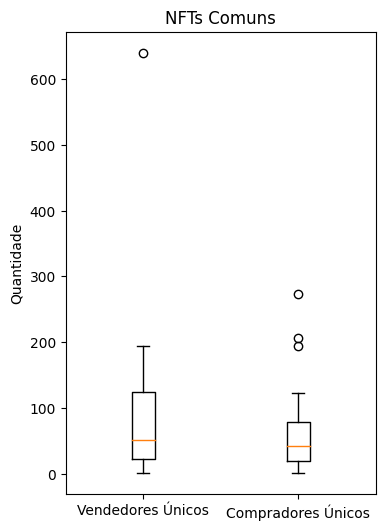

In [ ]:
# Plotar boxplot
plt.figure(figsize=(4,6)) # define uma figura com 8 polegadas de largura e 6 polegadas de altura

plt.boxplot([num_sellers, num_buyers])
plt.xticks([1, 2], ['Vendedores Únicos', 'Compradores Únicos'])
plt.title('NFTs Comuns')
plt.ylabel('Quantidade')
plt.show()

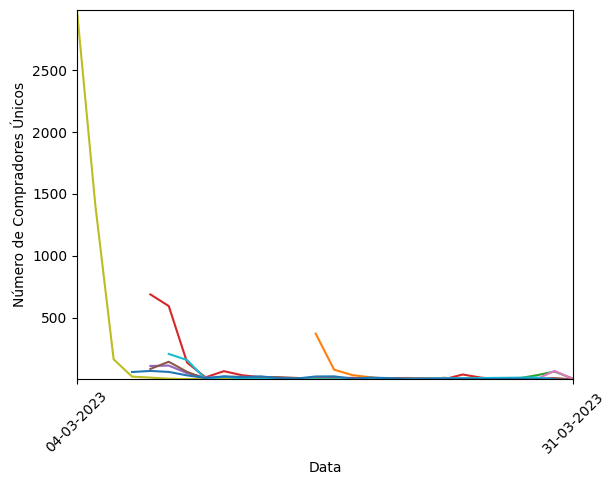

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [4, 6, 8, 11, 12, 14, 15, 17, 19, 20, 22]

# Criar uma figura
fig, ax = plt.subplots()

# Listas para armazenar os valores mínimos e máximos de vendedores
min_values = []
max_values = []

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_comum[i]

    # Agrupar os dados por data e TO_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])['TO_ADDRESS'].nunique()

    # Calcular o valor mínimo e máximo de vendedores
    min_values.append(unique_users.groupby('BLOCK_DATE').count().min())
    max_values.append(unique_users.groupby('BLOCK_DATE').count().max())

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line', label=f'NFT Comum {i}')

# Configurar os rótulos do eixo x para exibir dia, mês e ano
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

# Definir os limites do eixo x com base nas datas mínimas e máximas dos índices selecionados
plt.xlim(min(df['BLOCK_DATE'].min() for i, df in enumerate(list_df_comum) if i in indices_selecionados),
         max(df['BLOCK_DATE'].max() for i, df in enumerate(list_df_comum) if i in indices_selecionados))

# Definir os limites do eixo y com base nos valores mínimos e máximos
plt.ylim(min(min_values), max(max_values))

# Remover rótulos dos eixos x e y
plt.xticks(rotation=45)
plt.xlabel('Data')
plt.ylabel('Número de Compradores Únicos')

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.35, 1))

# Exibir o gráfico
plt.show()


Arquivo 1


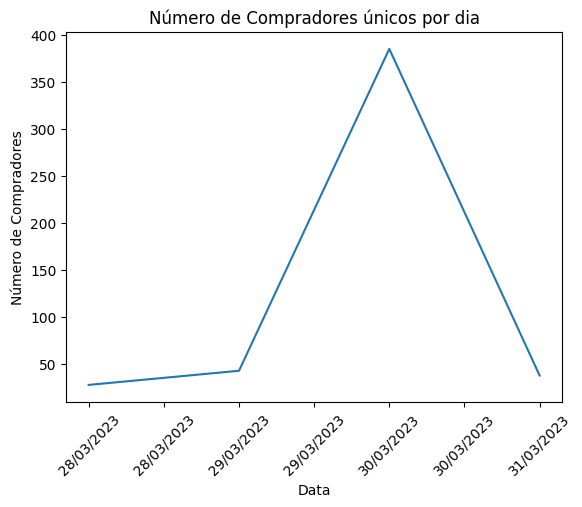

Arquivo 2


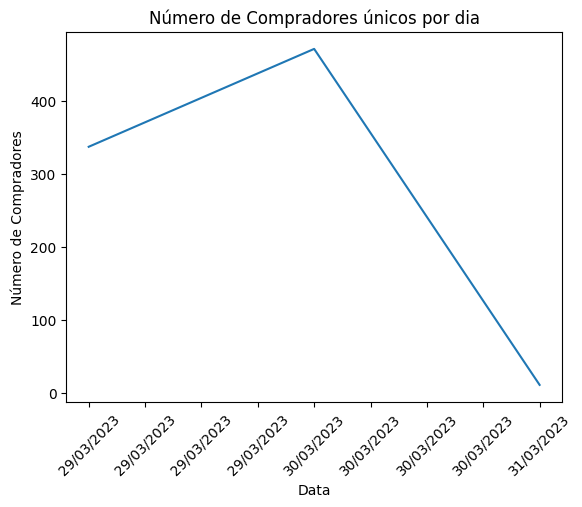

Arquivo 3


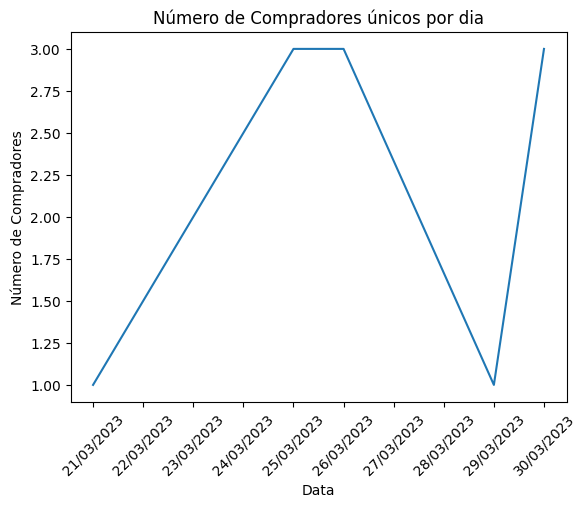

Arquivo 4


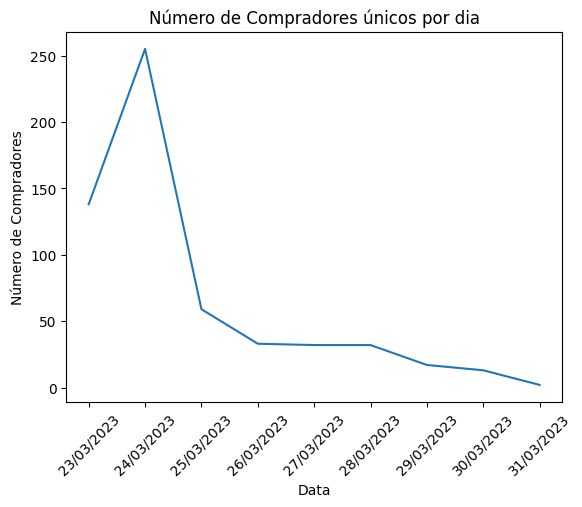

Arquivo 5


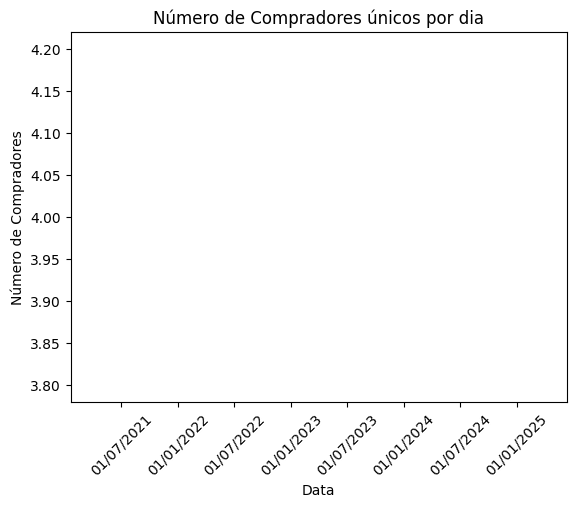

Arquivo 6


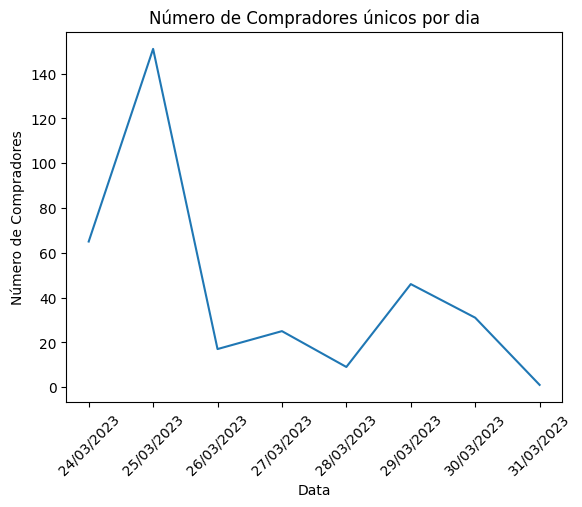

Arquivo 7


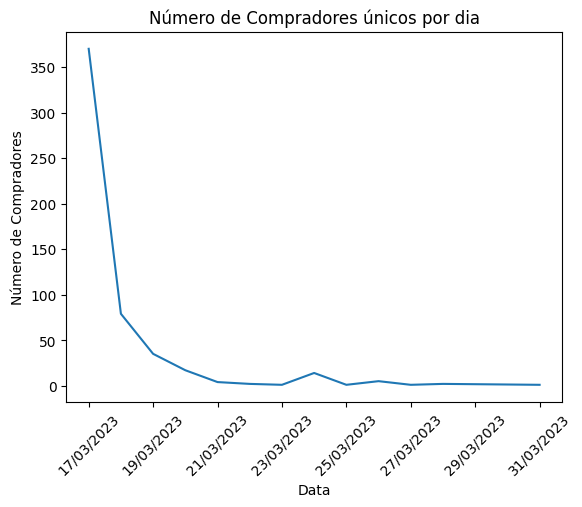

Arquivo 8


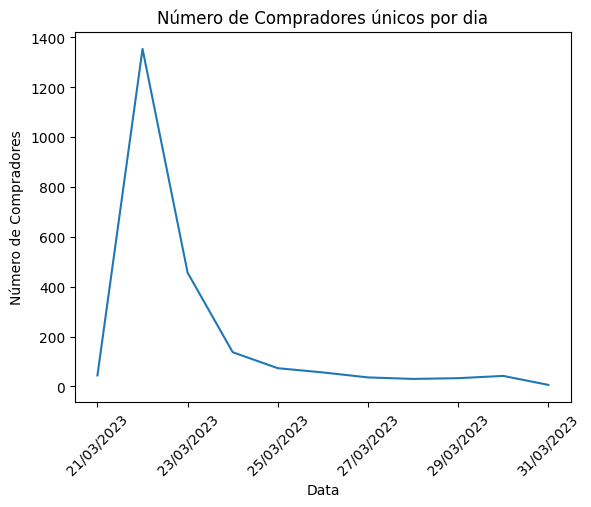

Arquivo 9


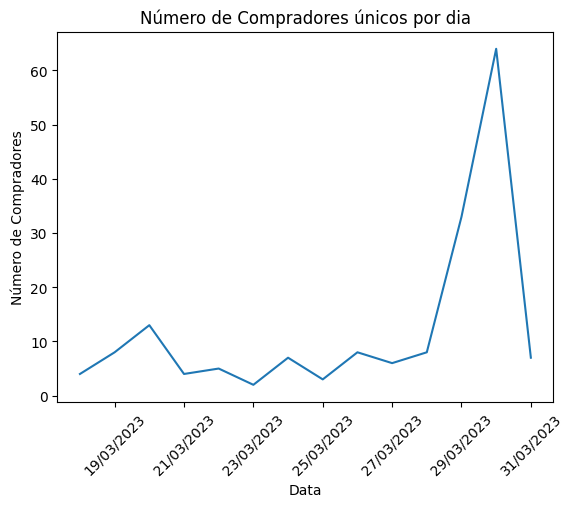

Arquivo 10


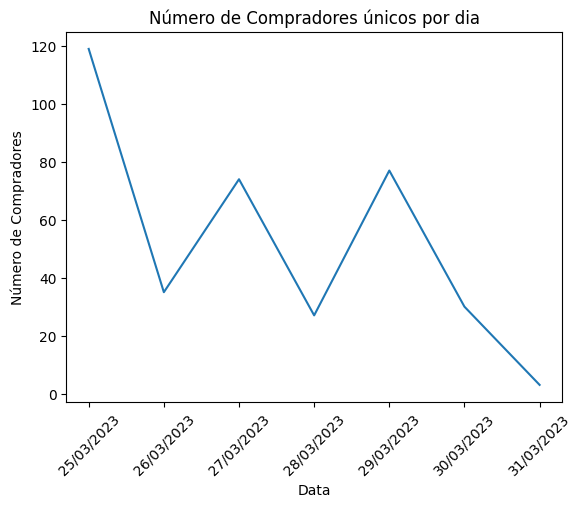

Arquivo 11


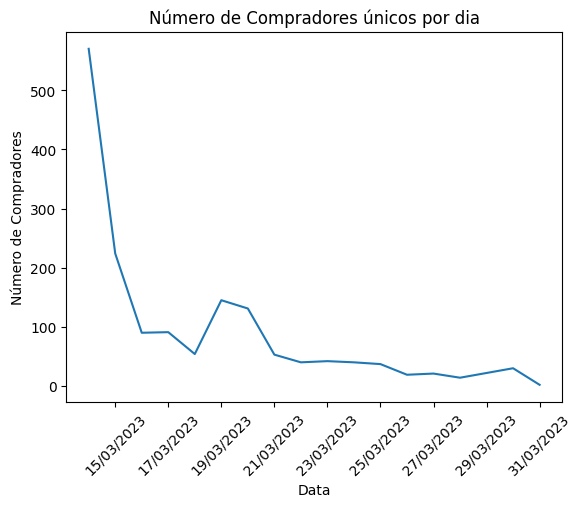

Arquivo 12


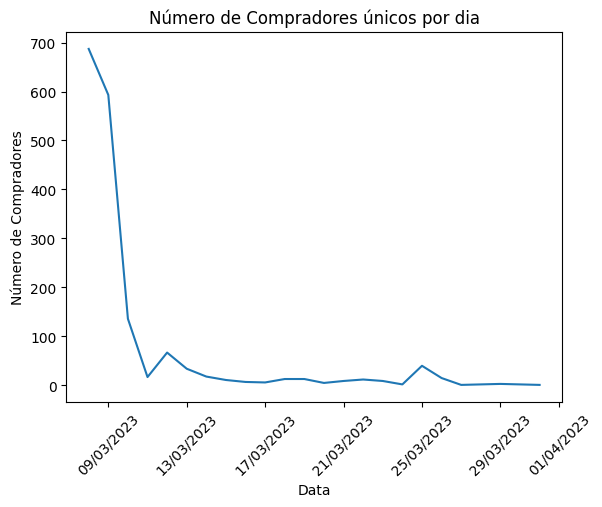

Arquivo 13


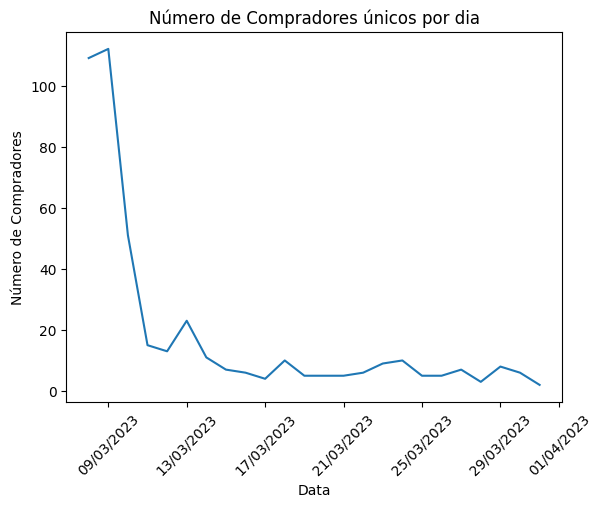

Arquivo 14


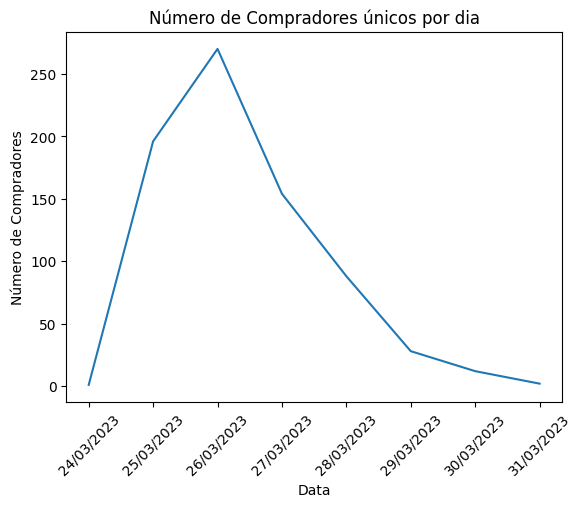

Arquivo 15


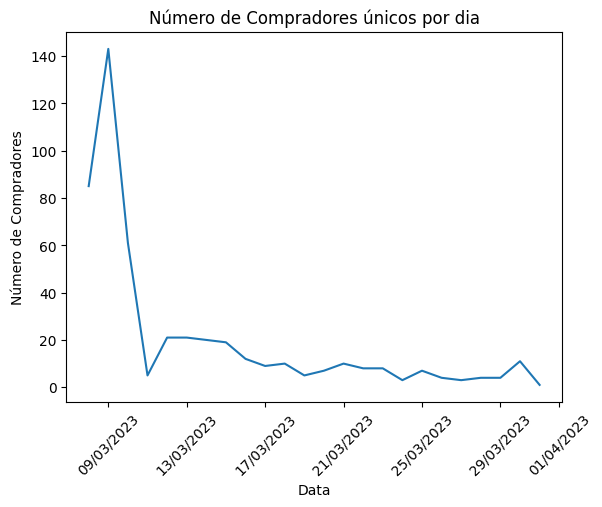

Arquivo 16


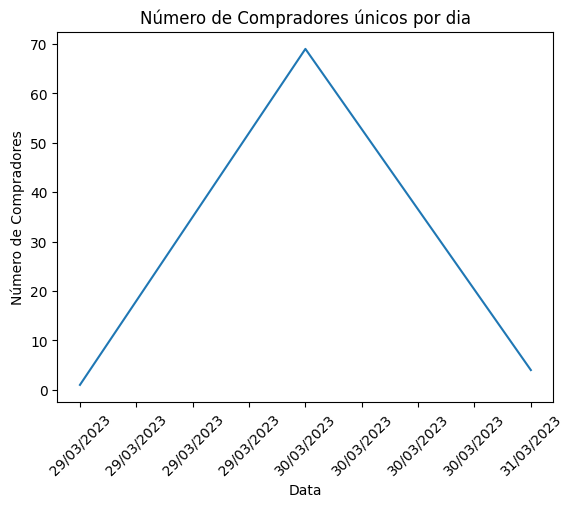

Arquivo 17


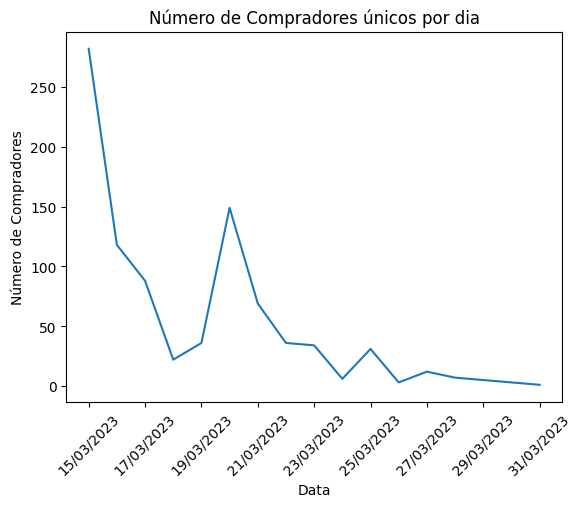

Arquivo 18


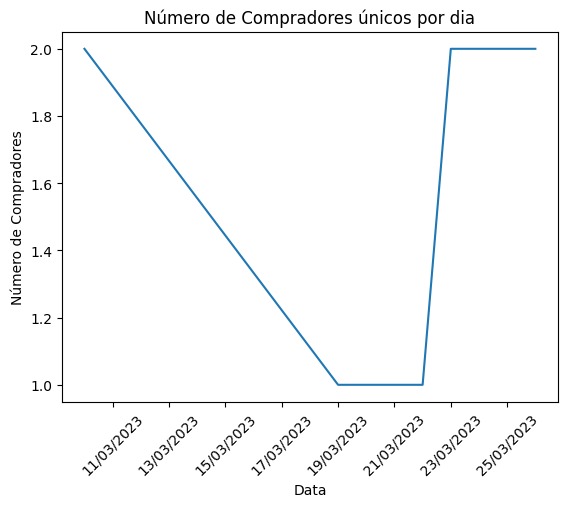

Arquivo 19


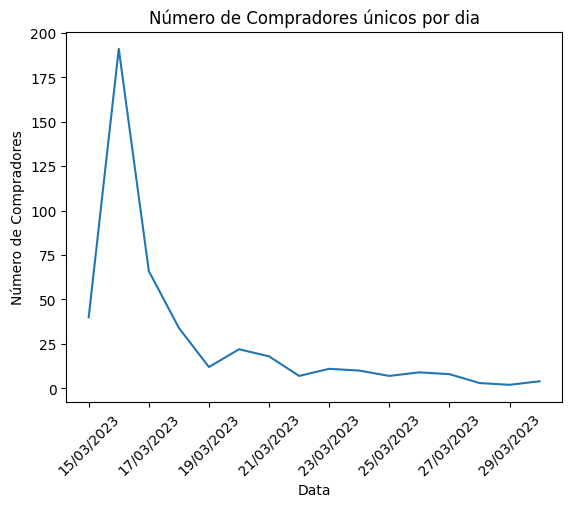

Arquivo 20


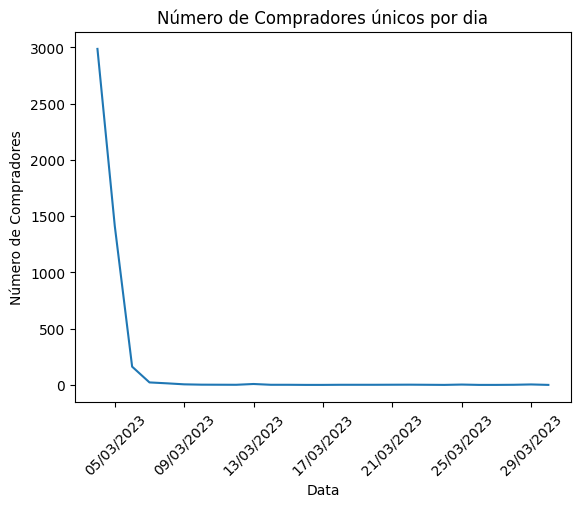

Arquivo 21


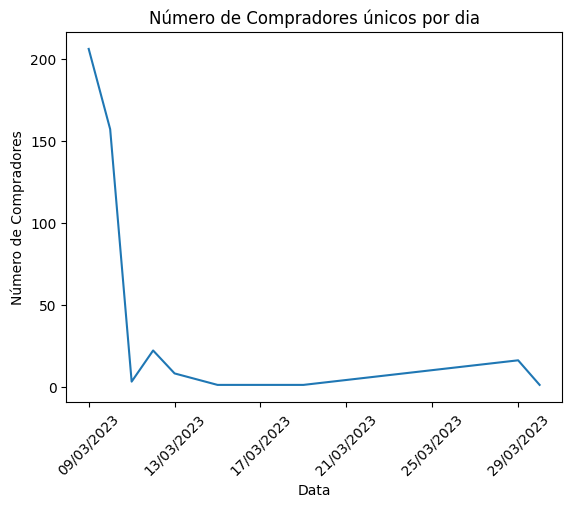

Arquivo 22


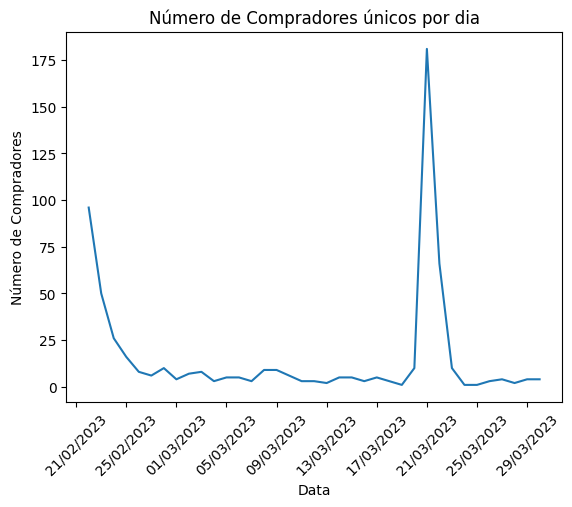

Arquivo 23


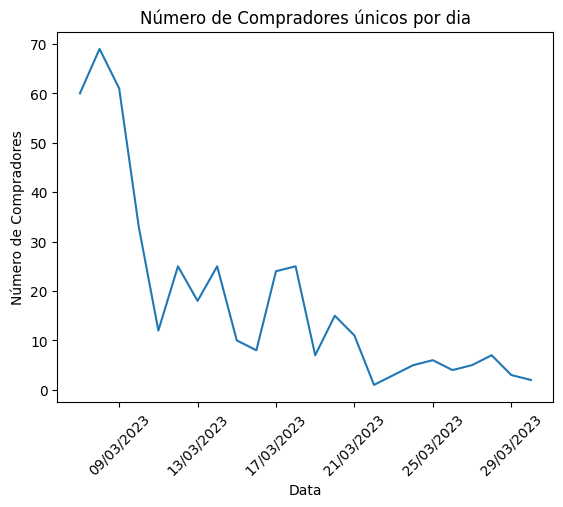

Arquivo 24


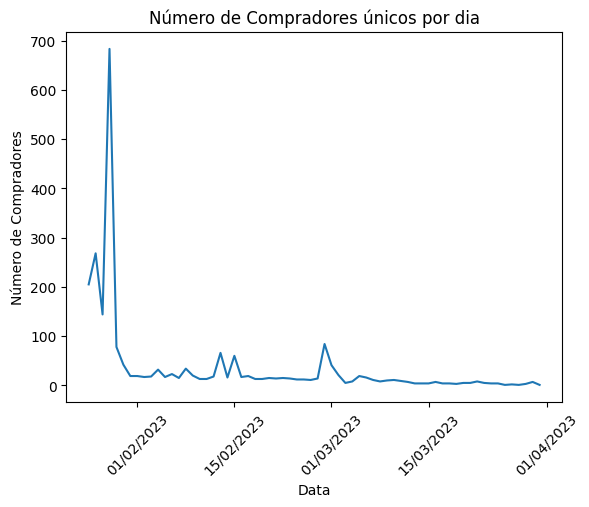

In [ ]:
for i in range(len(list_df_comum)):
    df = list_df_comum[i]

    # Agrupar os dados por data e TO_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])['TO_ADDRESS'].nunique()

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line')

    # Ajustar os rótulos do eixo X
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%Y'))
    plt.xticks(rotation=45)

    plt.title('Número de Compradores únicos por dia')
    plt.xlabel('Data')
    plt.ylabel('Número de Compradores')
    print("Arquivo " + str(i+1))
    plt.show()


In [ ]:
for i in range(len(list_df_comum)):
  print("\ndf" + str(i+1))
  df = list_df_comum[i]
  df.info()



df1
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1283 entries, 388 to 4615
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   BLOCK_TIMESTAMP          1283 non-null   datetime64[ns, UTC]
 1   FROM_ADDRESS             1283 non-null   object             
 2   TO_ADDRESS               1283 non-null   object             
 3   VALUE                    1283 non-null   int64              
 4   TRANSACTION_HASH         1283 non-null   object             
 5   NONCE                    1283 non-null   int64              
 6   FROM_ADDRESS_BLOCKCHAIN  1283 non-null   object             
 7   TO_ADDRESS_BLOCKCHAIN    1283 non-null   object             
 8   GAS                      1283 non-null   int64              
 9   RECEIPT_GAS_USED         1283 non-null   int64              
 10  BLOCK_DATE               1283 non-null   object             
dtypes: datetime64[ns, UTC](

In [ ]:
perc_buyer_seller = []
for i in range(len(list_df_comum)):
  df = list_df_comum[i]

  print('Grupo de Dados ', i+1)

  num_unique_transactions = df['TRANSACTION_HASH'].nunique()
  print('Número de transações únicas:', num_unique_transactions)

  # Calcule a diferença entre as datas mínima e máxima em dias
  quantidade_dias = (df['BLOCK_DATE'].max() - df['BLOCK_DATE'].min()).days
  print('Quantidade de dias:', quantidade_dias)

  # Agrupar os dados por data e FROM_ADDRESS (Vendedores) e contar o número de ocorrências únicas
  unique_sellers= df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])['FROM_ADDRESS'].nunique()
  print('Número de vendedores únicos:', unique_sellers.count())

  # Agrupar os dados por data e TO_ADDRESS (Compradores) e contar o número de ocorrências únicas
  unique_buyers= df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])['TO_ADDRESS'].nunique()
  print('Número de compradores únicos:', unique_buyers.count())

  # Proporção Compradores X Vendedores
  perc = (unique_buyers.count() / unique_sellers.count()) * 100
  perc_buyer_seller.append(perc)

  print('% de compradores X vendedores:', perc, "\n")

Grupo de Dados  1
Número de transações únicas: 772
Quantidade de dias: 3
Número de vendedores únicos: 501
Número de compradores únicos: 494
% de compradores X vendedores: 98.60279441117764 

Grupo de Dados  2
Número de transações únicas: 1262
Quantidade de dias: 2
Número de vendedores únicos: 1919
Número de compradores únicos: 819
% de compradores X vendedores: 42.67847837415321 

Grupo de Dados  3
Número de transações únicas: 13
Quantidade de dias: 9
Número de vendedores únicos: 10
Número de compradores únicos: 11
% de compradores X vendedores: 110.00000000000001 

Grupo de Dados  4
Número de transações únicas: 709
Quantidade de dias: 8
Número de vendedores únicos: 439
Número de compradores únicos: 581
% de compradores X vendedores: 132.34624145785875 

Grupo de Dados  5
Número de transações únicas: 4
Quantidade de dias: 0
Número de vendedores únicos: 4
Número de compradores únicos: 4
% de compradores X vendedores: 100.0 

Grupo de Dados  6
Número de transações únicas: 509
Quantidade 

(array([ 20.,  40.,  60.,  80., 100., 120., 140., 160., 180.]),
 [Text(20.0, 0, '20'),
  Text(40.0, 0, '40'),
  Text(60.0, 0, '60'),
  Text(80.0, 0, '80'),
  Text(100.0, 0, '100'),
  Text(120.0, 0, '120'),
  Text(140.0, 0, '140'),
  Text(160.0, 0, '160'),
  Text(180.0, 0, '180')])

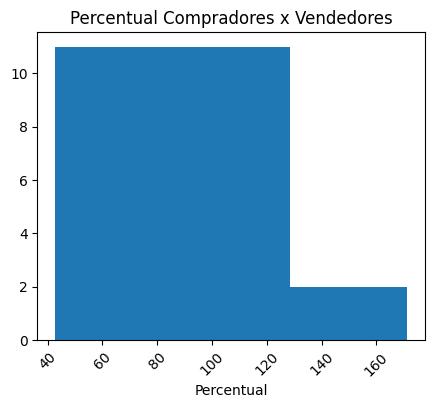

In [ ]:
# Criação dos gráficos
plt.figure(figsize=(5, 4))
# Histograma de transações únicas
plt.hist(perc_buyer_seller, bins=3)
plt.title('Percentual Compradores x Vendedores')
plt.xlabel('Percentual')
# plt.ylabel('Frequência')
plt.xticks(rotation=45)

In [ ]:
for i, objeto in enumerate(list_df_comum):
    nome_variavel = f"df{i+1}"
    locals()[nome_variavel] = objeto


In [ ]:
# see first lines
print('Lines: {}'.format(list_df_comum[0].shape[0]))
print('Columns: {}'.format(list_df_comum[0].shape[1]))
# df.reset_index()
list_df_comum[0].head()

Lines: 1283
Columns: 11


,BLOCK_TIMESTAMP,FROM_ADDRESS,TO_ADDRESS,VALUE,TRANSACTION_HASH,NONCE,FROM_ADDRESS_BLOCKCHAIN,TO_ADDRESS_BLOCKCHAIN,GAS,RECEIPT_GAS_USED,BLOCK_DATE
388,2023-03-28 22:04:35+00:00,0x931850fea5d139f7b4451a09e9acdcf5e406ccbd,0xcf8ea559da9ea57bb2ad227bb9a0ba21432466ae,346,0xf20a9bff6031f4a5d9f43874653ee565507fefc1d1ab...,7,0x931850fea5d139f7b4451a09e9acdcf5e406ccbd,0x0e8d5ad992b37f145ed1985d4bffcbc3d5bd6be3,63429,48792,2023-03-28
391,2023-03-28 22:06:23+00:00,0xb683b6b64ec4823cce268c94fe66cc05c6c14437,0xdad840d9a4bef307dbba916eb474441fbd0de22d,363,0x9cd299527cfffd5ff0e417ea3828525c527cbeea895b...,193,0xb683b6b64ec4823cce268c94fe66cc05c6c14437,0x0e8d5ad992b37f145ed1985d4bffcbc3d5bd6be3,93792,62528,2023-03-28
394,2023-03-28 22:07:35+00:00,0xa24606058b767154e105153161d2ad956b2ae0c4,0xe4623fe3ca4e4d65b6a177bf204bd01583df109b,355,0x53d9baf10810733980b5d7c34ef395587af2960d3016...,221,0xa24606058b767154e105153161d2ad956b2ae0c4,0x0e8d5ad992b37f145ed1985d4bffcbc3d5bd6be3,85659,65892,2023-03-28
401,2023-03-28 22:08:59+00:00,0xe8d59ead95df132f97826a0bf82e05cea9eb5e67,0xd2644bc67ed2146054c565d8f43e372997cc598e,391,0x68f368ce609463863197177d25d5bbd822bc2a1d11b4...,6,0xe8d59ead95df132f97826a0bf82e05cea9eb5e67,0x0e8d5ad992b37f145ed1985d4bffcbc3d5bd6be3,85659,65892,2023-03-28
412,2023-03-28 22:13:35+00:00,0x325557b2b6a9efb97fe90c240d1b5a9cff1178fc,0x0ec204082a9c6233b7dd9a6dc7cbe861a4bc1936,370,0xaabaf3f79f9187f9b36a4304022c014502933adc4152...,51,0x0ec204082a9c6233b7dd9a6dc7cbe861a4bc1936,0x00000000000001ad428e4906ae43d8f9852d0dd6,195029,145052,2023-03-28


In [ ]:
print(list_df_comum[0]['FROM_ADDRESS'].value_counts())

0x39da41747a83aee658334415666f3ef92dd0d541    86
0x696969917d14af0eccd470b0797a447087aba094    12
0x53201ff143aa386449ed2951c91af2b303512365    10
0xe5e9ffe707ee071998340972af6fb178f5c64ba6     9
0xdf2b846d45e312980155d587be49cce9be7f6f35     8
                                              ..
0x4300333a99d3419b1e9cfca9191a8a837fac2bd8     1
0xe19a28fc4492f0a56b2e9fee829f2255980354d9     1
0x3e3bae0f269833ff35c68a0fb8cd895c73de7a08     1
0x7f96bd50971296c2e8ea38b4b9855814017e475a     1
0x65e40862d0e98e152e478e7bc1328c50628d936e     1
Name: FROM_ADDRESS, Length: 471, dtype: int64


Histograma representando a quantidade de transações ao longo das datas do dataframe

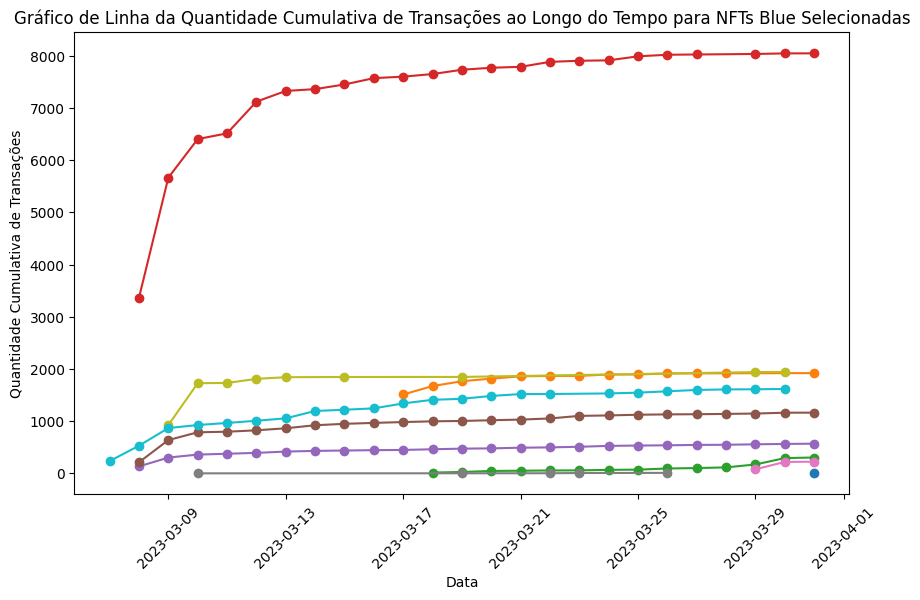

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [4, 6, 8, 11, 12, 14, 15, 17, 20, 22]

# Criar uma figura
fig, ax = plt.subplots(figsize=(10, 6))

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_comum[i]

    # Agrupar os dados por data e contar o número de transações
    transactions_count = df.groupby('BLOCK_DATE').size().cumsum()

    # Plotar um gráfico de linha com a quantidade cumulativa de transações por data
    plt.plot(transactions_count.index, transactions_count, label=f'NFT Comum {i}', marker='o')

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.22, 1.01))

# Girar os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)

# Desativar o grid
plt.grid(False)

# Definir os rótulos do eixo x e y
plt.xlabel('Data')
plt.ylabel('Quantidade Cumulativa de Transações')

# Adicionar título
plt.title('Gráfico de Linha da Quantidade Cumulativa de Transações ao Longo do Tempo para NFTs Blue Selecionadas')

# Exibir o gráfico
plt.show()


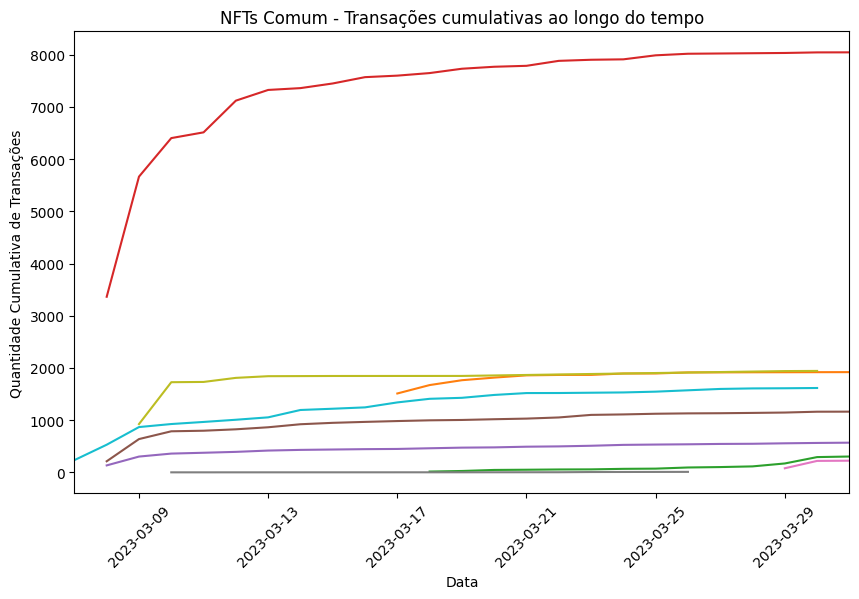

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [4, 6, 8, 11, 12, 14, 15, 17, 20, 22]

# Criar uma figura
fig, ax = plt.subplots(figsize=(10, 6))

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_comum[i]

    # Agrupar os dados por data e contar o número de transações
    transactions_count = df.groupby('BLOCK_DATE').size().cumsum()

    # Plotar um gráfico de linha com a quantidade cumulativa de transações por data
    plt.plot(transactions_count.index, transactions_count, label=f'NFT Comum {i}')


# Definir os limites do eixo x com base nas datas mínimas e máximas dos índices selecionados
plt.xlim(min(df['BLOCK_DATE'].min() for i, df in enumerate(list_df_comum) if i in indices_selecionados),
         max(df['BLOCK_DATE'].max() for i, df in enumerate(list_df_comum) if i in indices_selecionados))

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.22, 1.01))

# Girar os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)

# Desativar o grid
plt.grid(False)

# Definir os rótulos do eixo x e y
plt.xlabel('Data')
plt.ylabel('Quantidade Cumulativa de Transações')

# Adicionar título
plt.title('NFTs Comum - Transações cumulativas ao longo do tempo')

# Exibir o gráfico
plt.show()


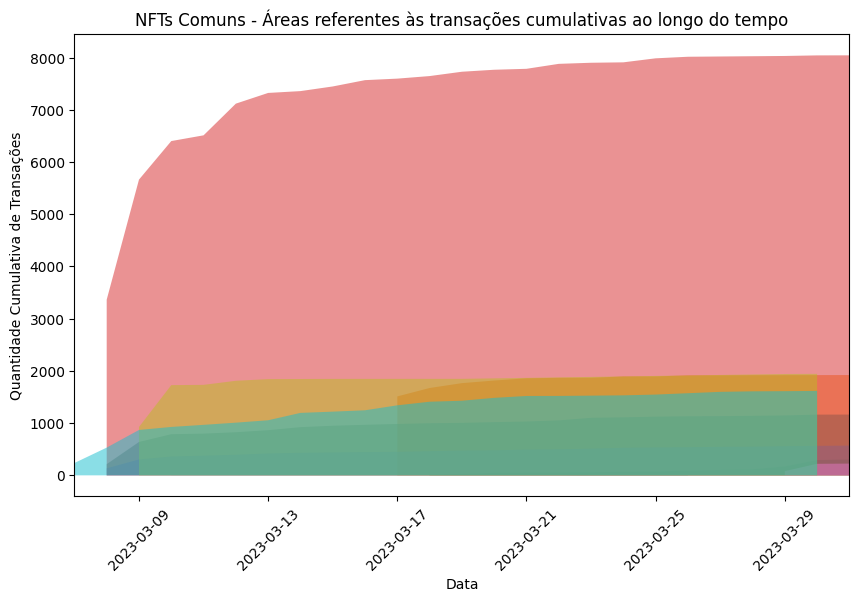

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [4, 6, 8, 11, 12, 14, 15, 17, 20, 22]

# Criar uma figura
fig, ax = plt.subplots(figsize=(10, 6))

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_comum[i]

    # Agrupar os dados por data e contar o número de transações
    transactions_count = df.groupby('BLOCK_DATE').size().cumsum()

    # Plotar um gráfico de área com a quantidade cumulativa de transações por data
    plt.fill_between(transactions_count.index, transactions_count, label=f'NFT Comum {i}', alpha=0.5)


# Definir os limites do eixo x com base nas datas mínimas e máximas dos índices selecionados
plt.xlim(min(df['BLOCK_DATE'].min() for i, df in enumerate(list_df_comum) if i in indices_selecionados),
         max(df['BLOCK_DATE'].max() for i, df in enumerate(list_df_comum) if i in indices_selecionados))



# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.22, 1.01))

# Girar os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)

# Desativar o grid
plt.grid(False)

# Definir os rótulos do eixo x e y
plt.xlabel('Data')
plt.ylabel('Quantidade Cumulativa de Transações')

# Adicionar título
plt.title('NFTs Comuns - Áreas referentes às transações cumulativas ao longo do tempo')

# Exibir o gráfico
plt.show()


Grupo de Dados  1


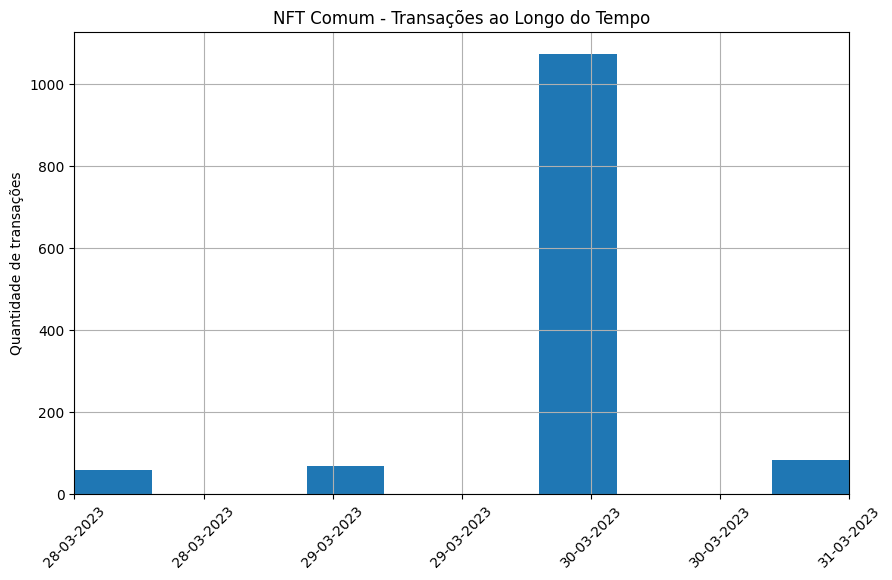

Grupo de Dados  2


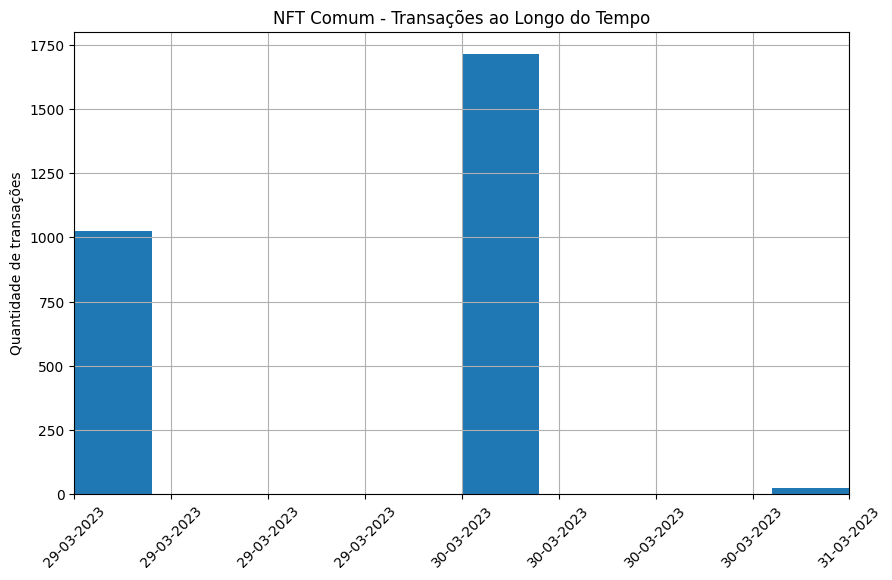

Grupo de Dados  3


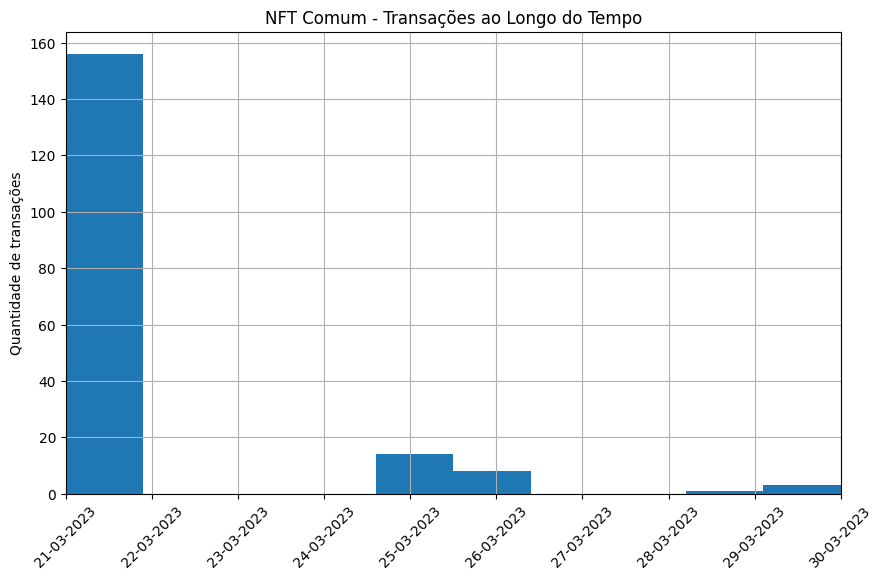

Grupo de Dados  4


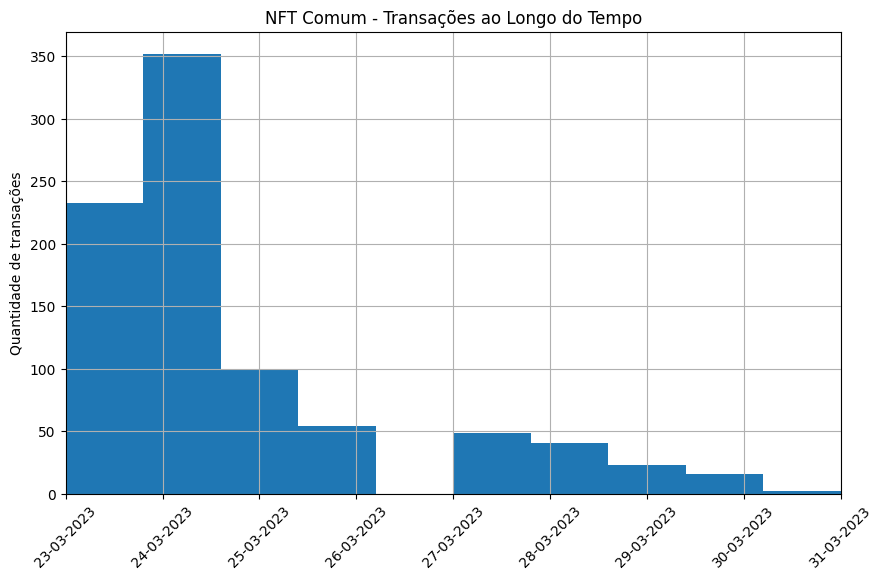

Grupo de Dados  5


<ipython-input-13-9f951ab6b201>:26: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


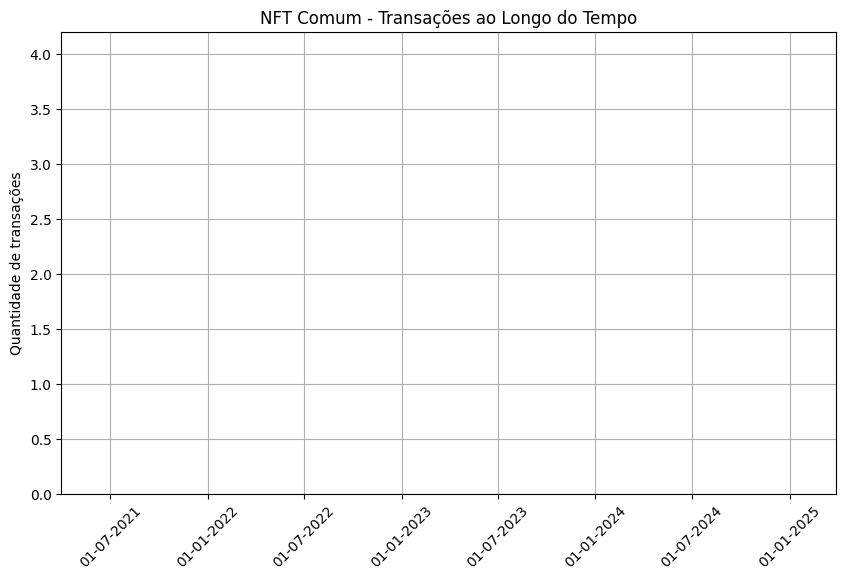

Grupo de Dados  6


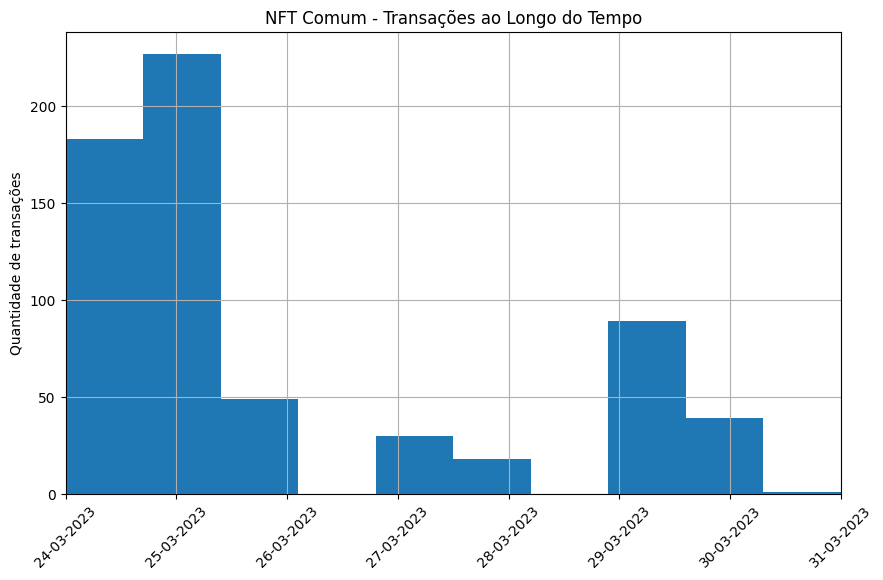

Grupo de Dados  7


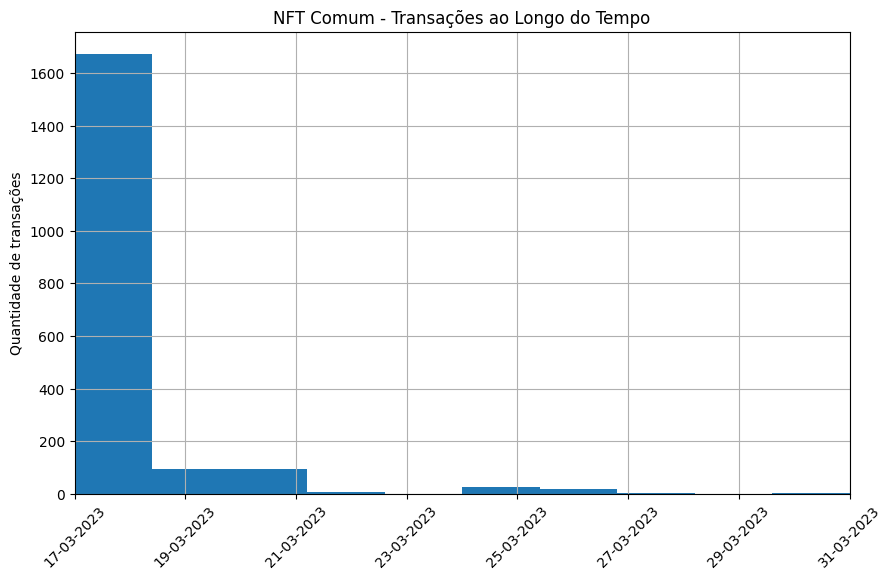

Grupo de Dados  8


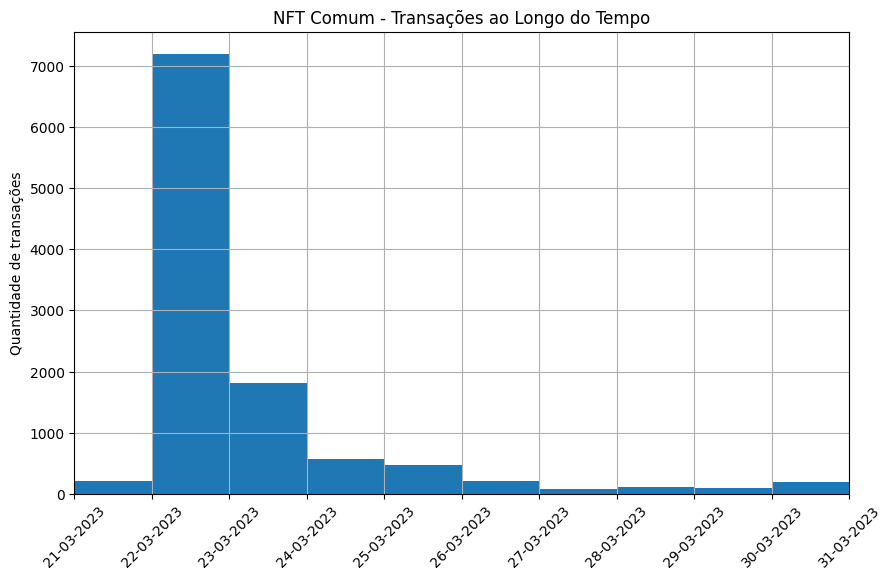

Grupo de Dados  9


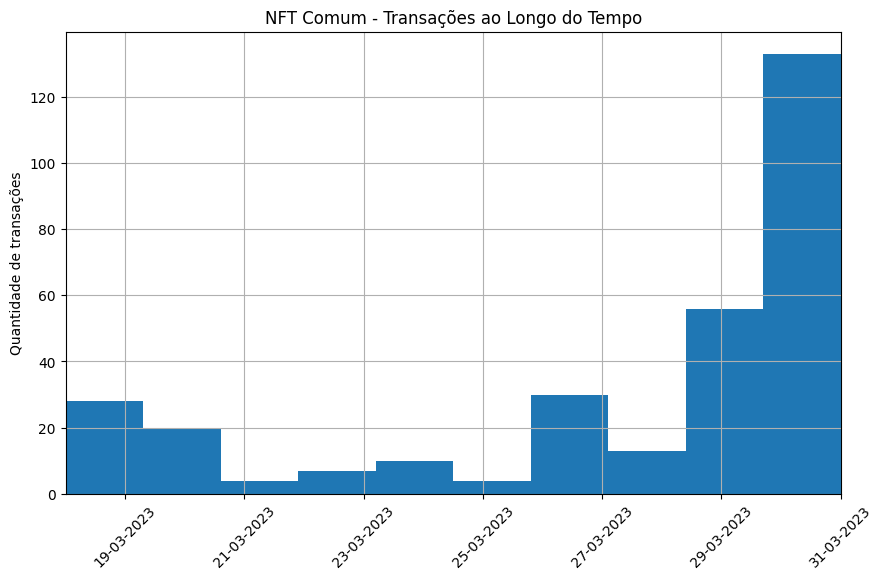

Grupo de Dados  10


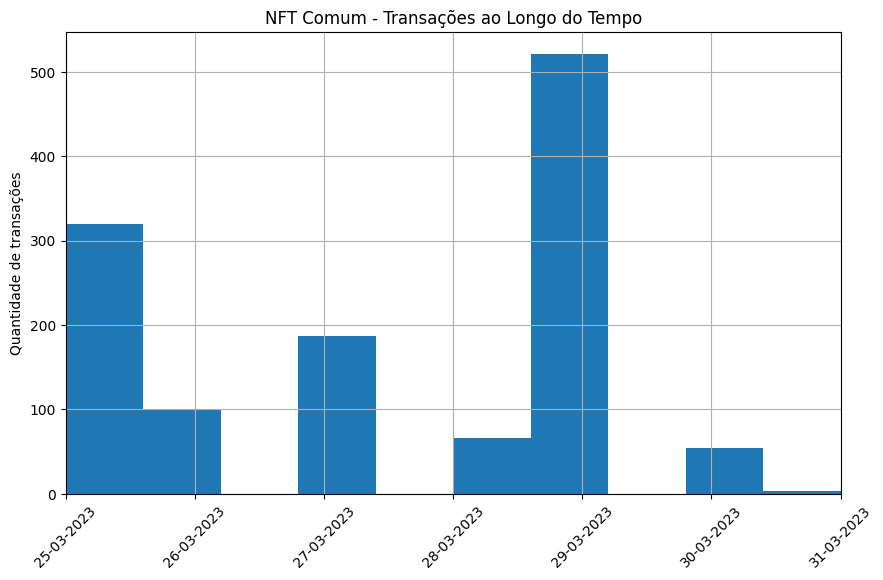

Grupo de Dados  11


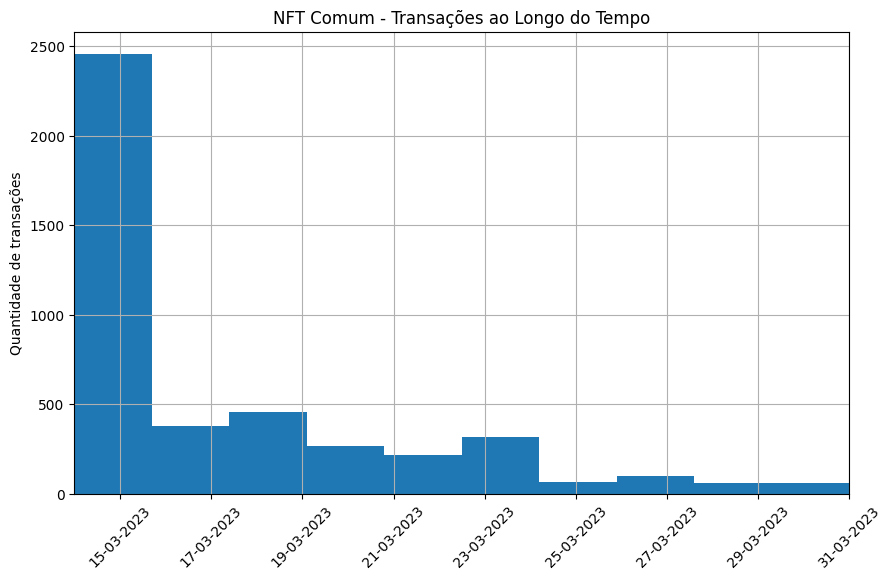

Grupo de Dados  12


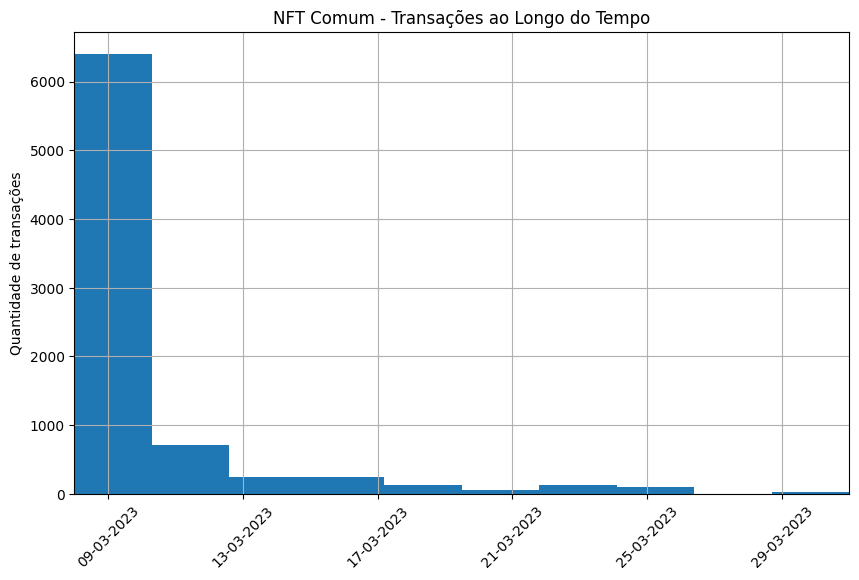

Grupo de Dados  13


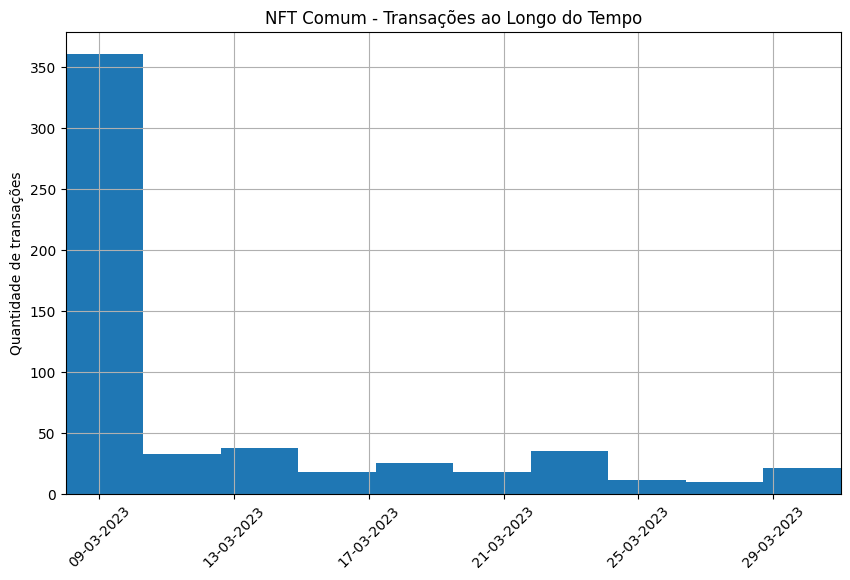

Grupo de Dados  14


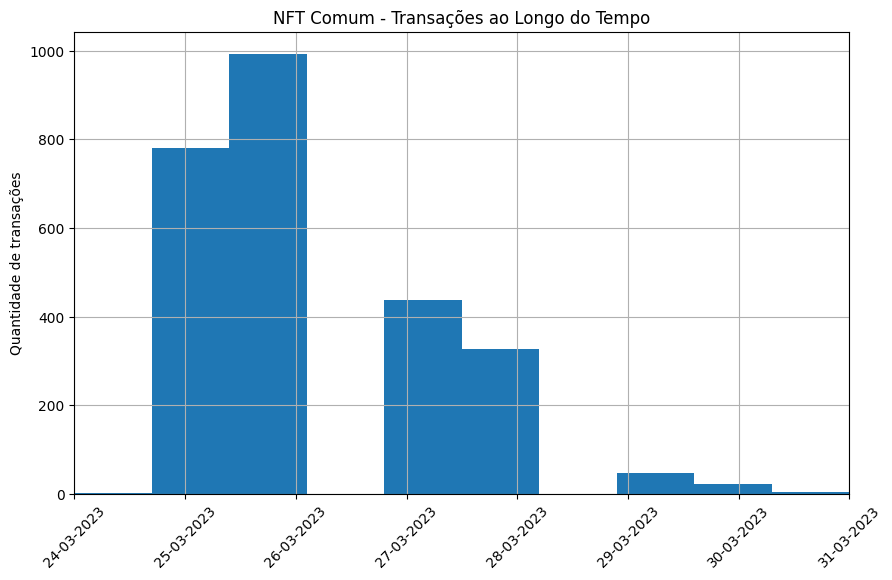

Grupo de Dados  15


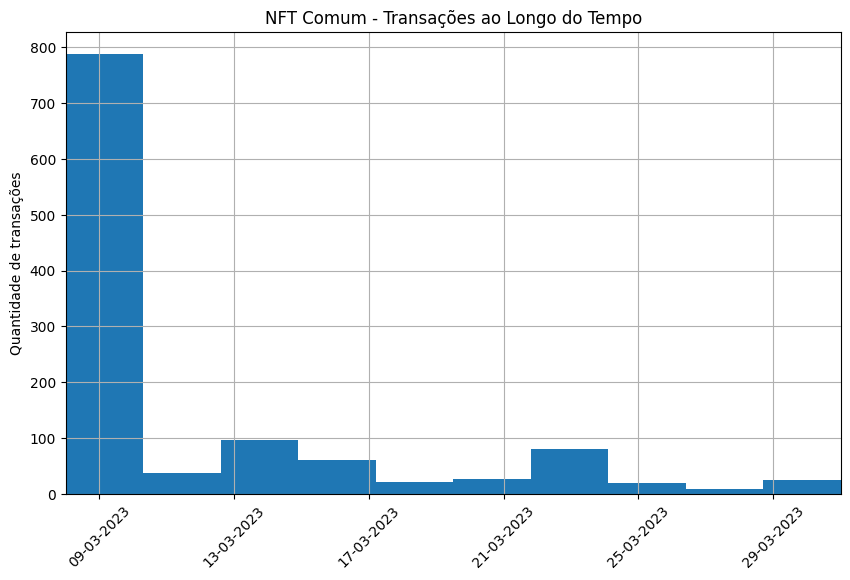

Grupo de Dados  16


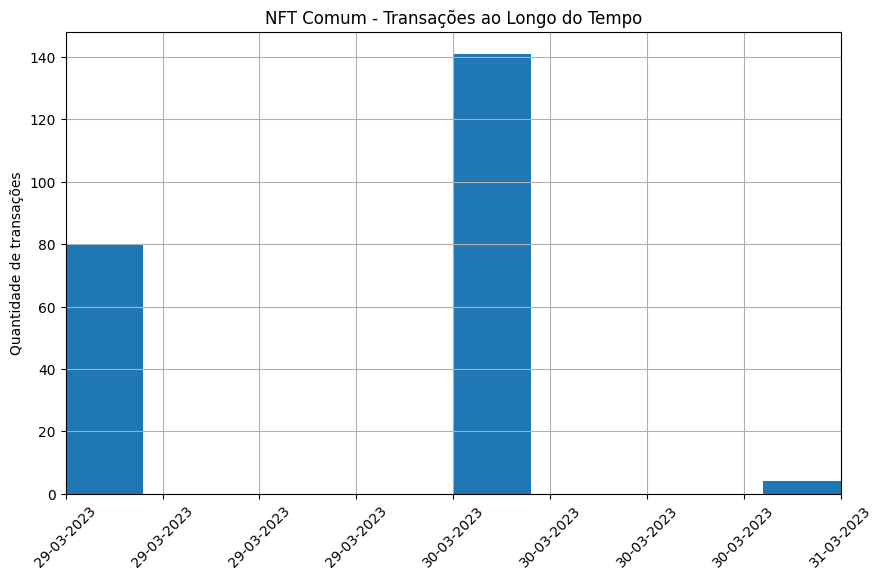

Grupo de Dados  17


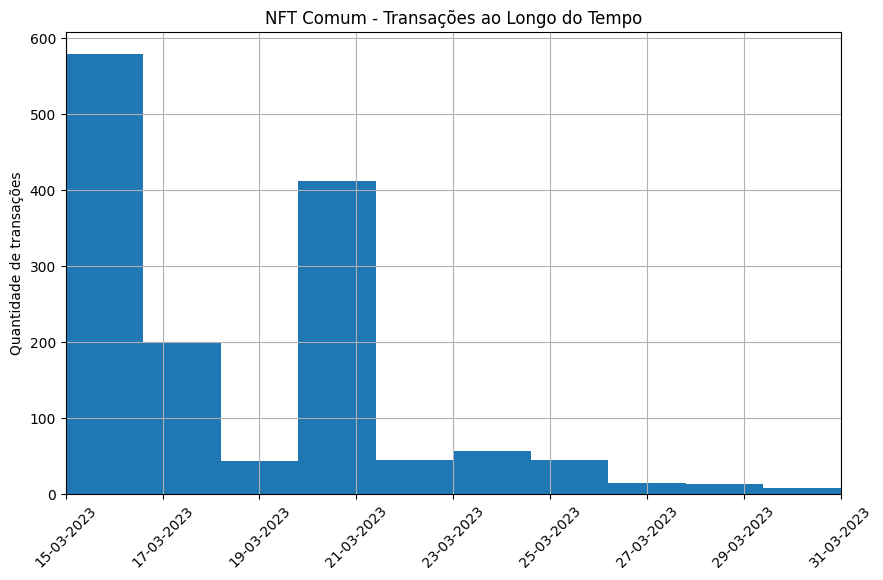

Grupo de Dados  18


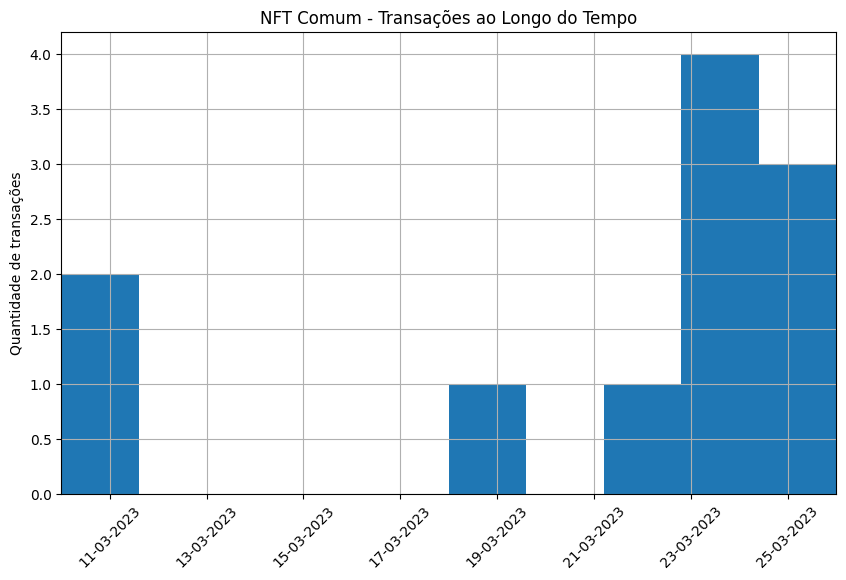

Grupo de Dados  19


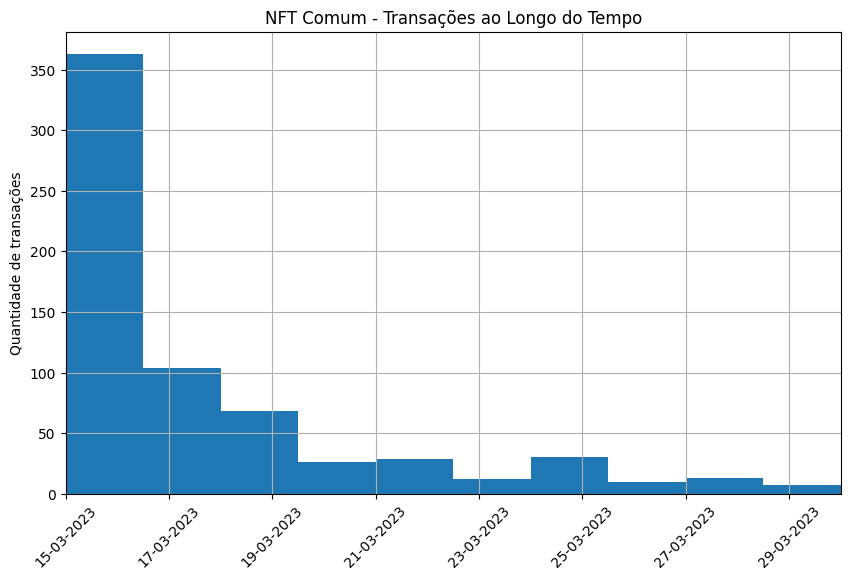

Grupo de Dados  20


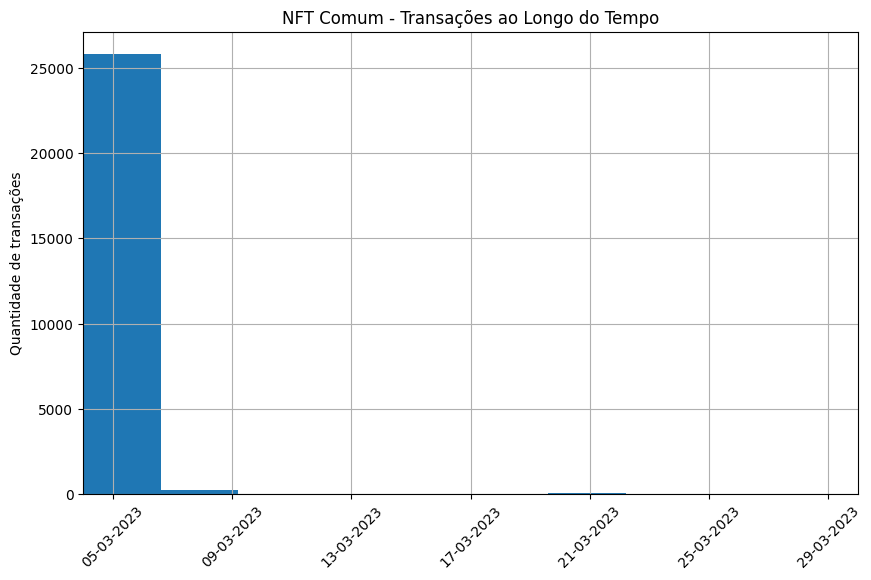

Grupo de Dados  21


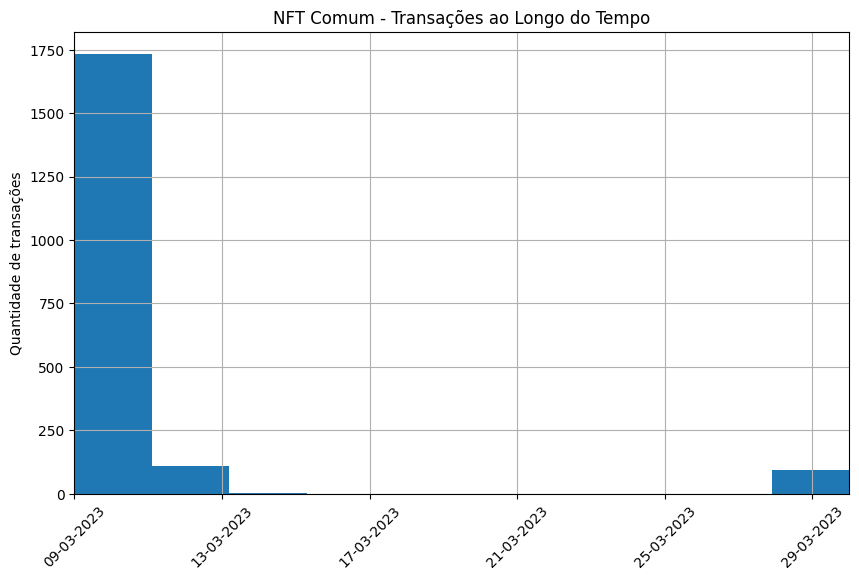

Grupo de Dados  22


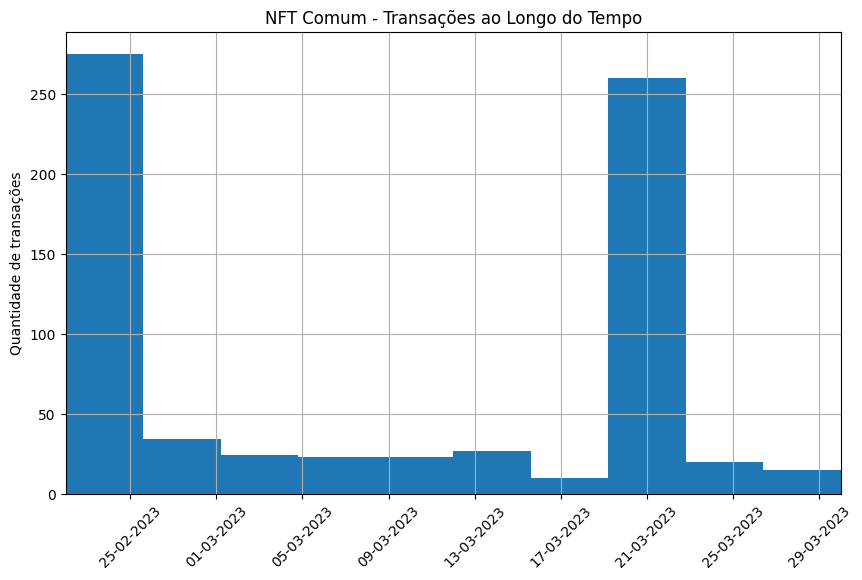

Grupo de Dados  23


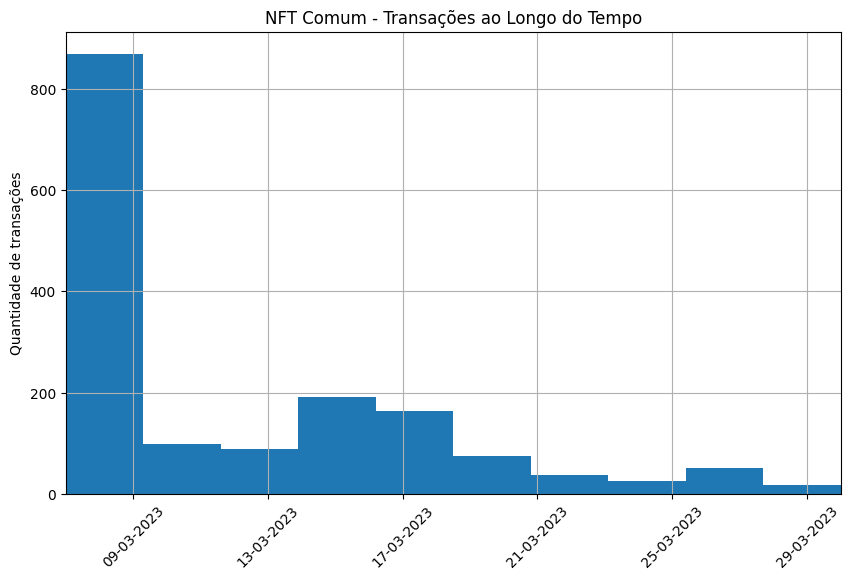

Grupo de Dados  24


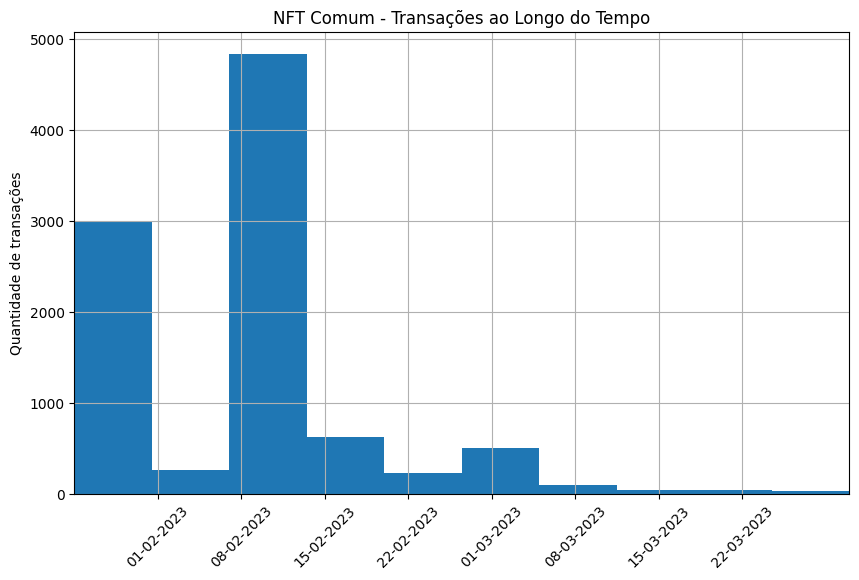

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):

  print('Grupo de Dados ', i+1)

  # Definindo o tamanho da figura
  plt.figure(figsize=(10, 6))

  # Criando o histograma
  list_df_comum[i]['BLOCK_DATE'].hist(bins=10)

  # Definindo os rótulos do eixo x e y
  # plt.xlabel('Data')
  plt.ylabel('Quantidade de transações')

  # Girando os rótulos do eixo X em 45 graus
  plt.xticks(rotation=45)

  # Ajustando a formatação das datas no eixo X
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

  # Definindo os limites do eixo X
  plt.xlim(list_df_comum[i]['BLOCK_DATE'].min(), list_df_comum[i]['BLOCK_DATE'].max())

  plt.title('NFT Comum - Transações ao Longo do Tempo')

  # Exibindo o gráfico
  plt.show()


In [ ]:
list_df_comum[0]['BLOCK_DATE'].nunique()

4

In [ ]:
list_df_comum[0]['BLOCK_DATE'].value_counts()

2023-03-30    1074
2023-03-31      82
2023-03-29      69
2023-03-28      58
Name: BLOCK_DATE, dtype: int64

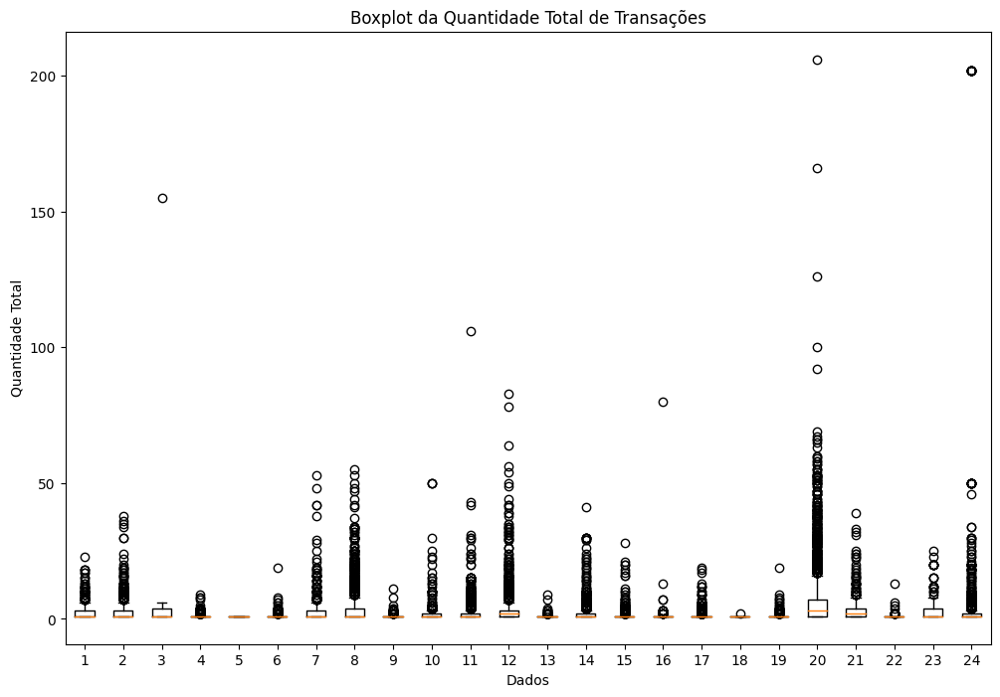

In [ ]:
# Criar um dicionário de rótulos
# labels_dict = {i: 'Transações Dataframe ' + str(i) for i in range(len(list_df_comum))}

# Criar uma lista vazia para armazenar os dados do boxplot
data = []

# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):
    # Criar uma lista com os valores da quantidade total de transações
    total_transactions = list_df_comum[i].groupby('BLOCK_TIMESTAMP').size().values.tolist()

    # Adicionar os valores ao conjunto de dados
    data.append(total_transactions)


# Definir o tamanho da figura
plt.figure(figsize=(12, 8))

# Criar o gráfico boxplot com rótulos personalizados no eixo x
# plt.boxplot(data, labels=[labels_dict[i] for i in range(len(list_df_comum))])
plt.boxplot(data)

# Adicionar título e rótulo dos eixos
plt.title('Boxplot da Quantidade Total de Transações')
plt.xlabel('Dados')
plt.ylabel('Quantidade Total')

# Exibir o gráfico
plt.show()


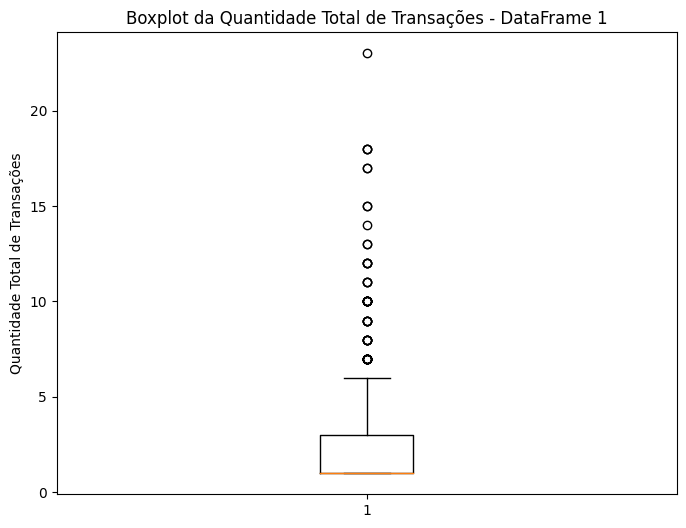

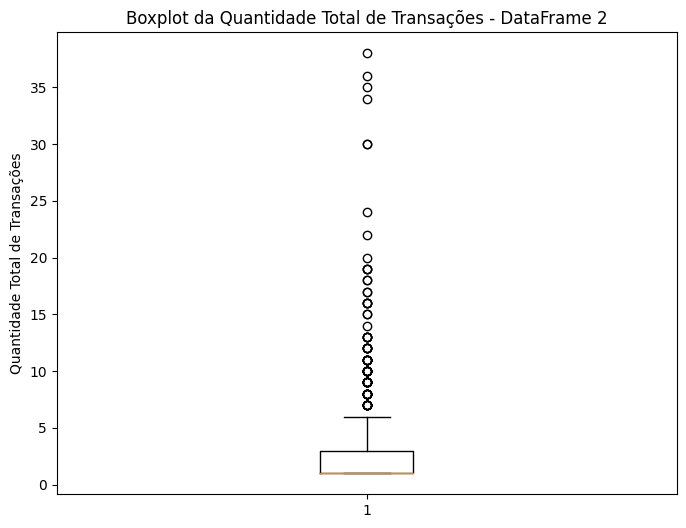

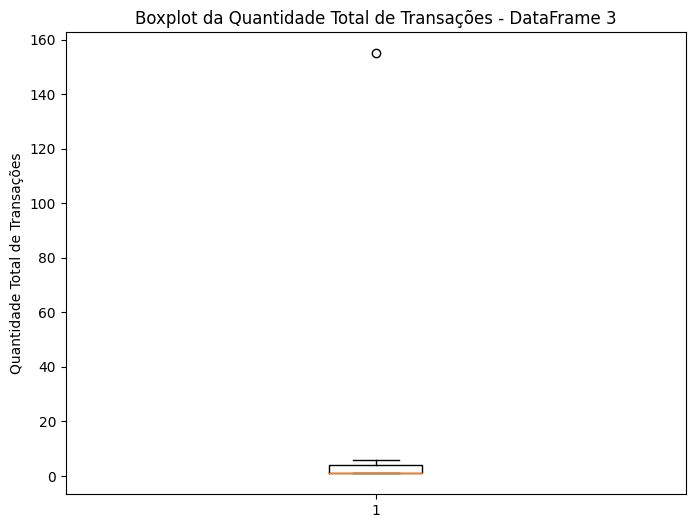

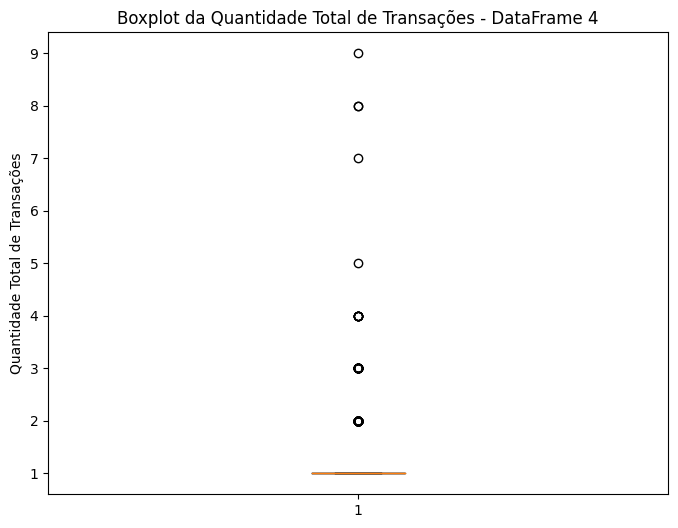

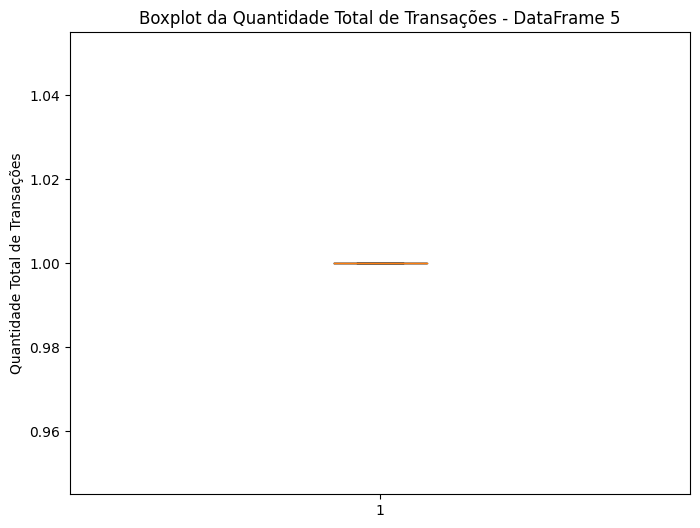

...

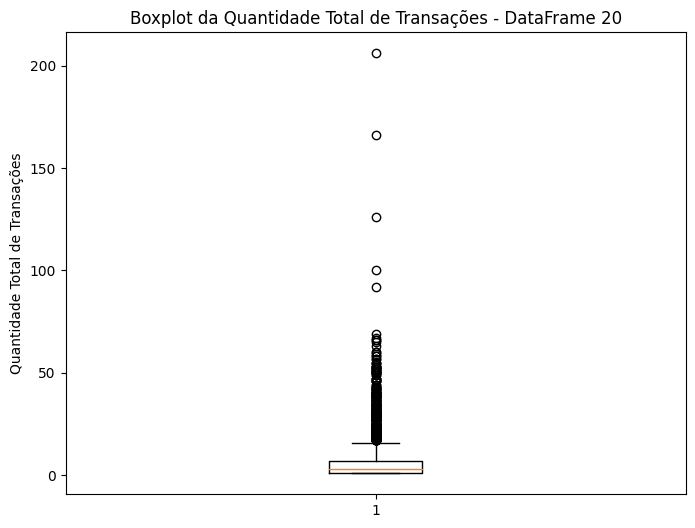

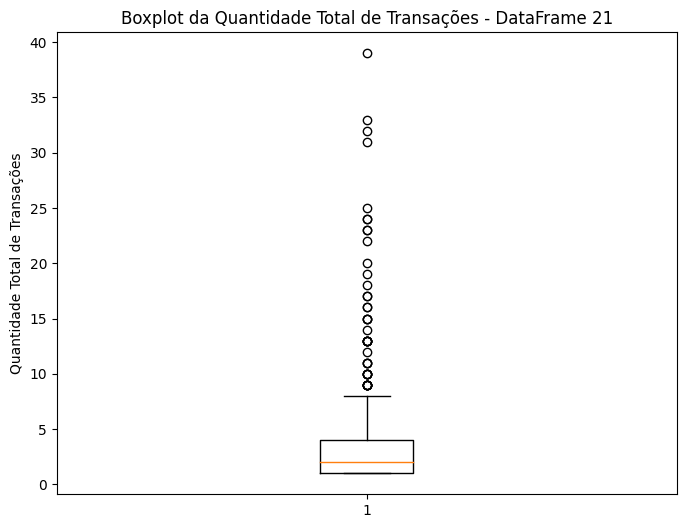

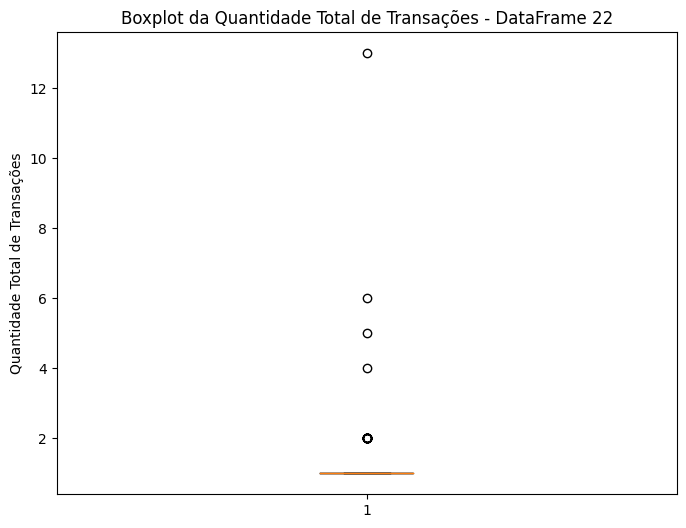

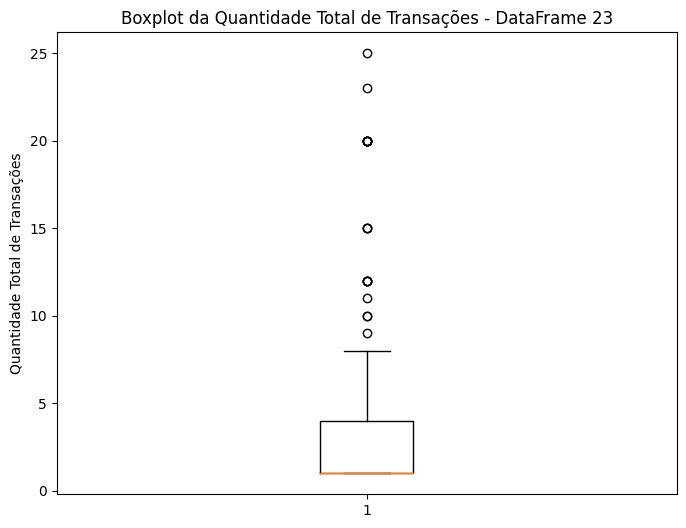

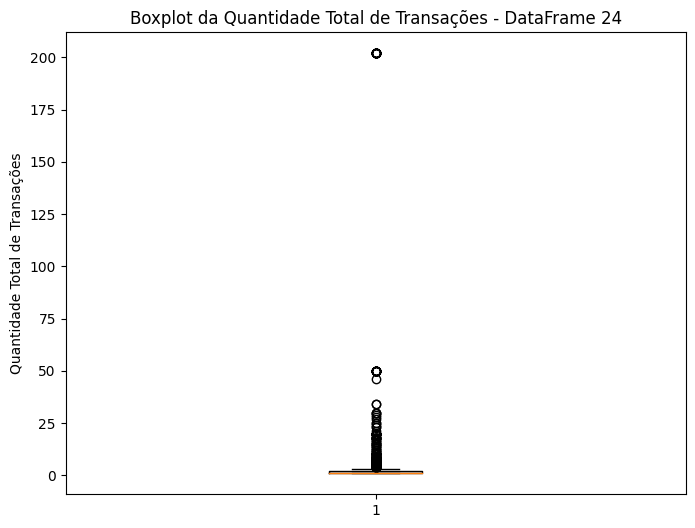

In [ ]:
for i in range(len(list_df_comum)):
    # Criar uma lista com os valores da quantidade total de transações
    total_transactions = list_df_comum[i].groupby('BLOCK_TIMESTAMP').size().values.tolist()

    # Criar o gráfico boxplot com o Matplotlib
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.boxplot(total_transactions)

    # Adicionar título e rótulo dos eixos
    ax.set_title('Boxplot da Quantidade Total de Transações - DataFrame ' + str(i+1))
#   ax.set_xlabel('DataFrame ' + str(i))
    ax.set_ylabel('Quantidade Total de Transações')

    # Exibir o gráfico
    plt.show()


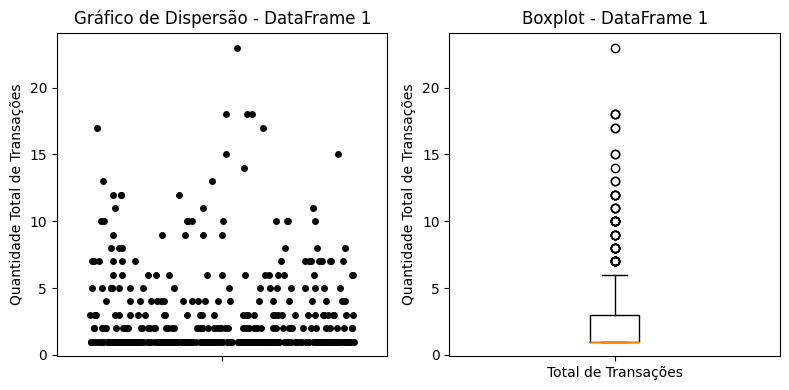

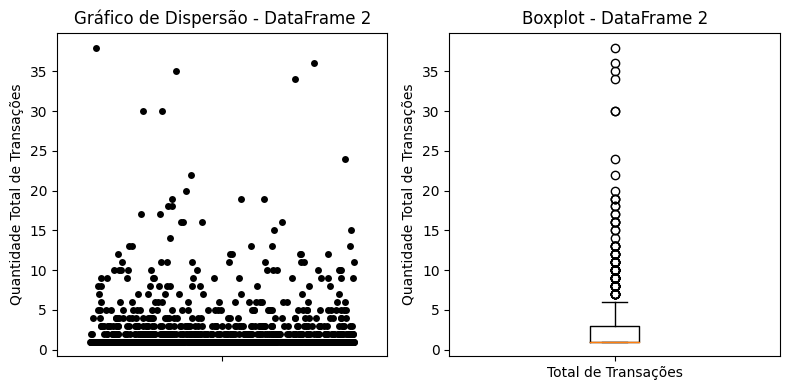

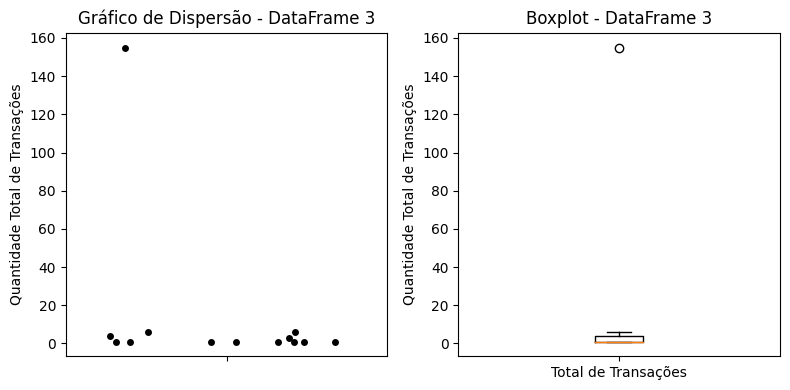

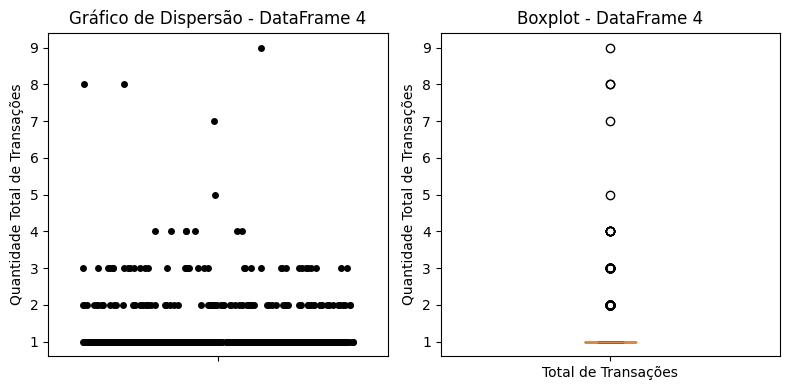

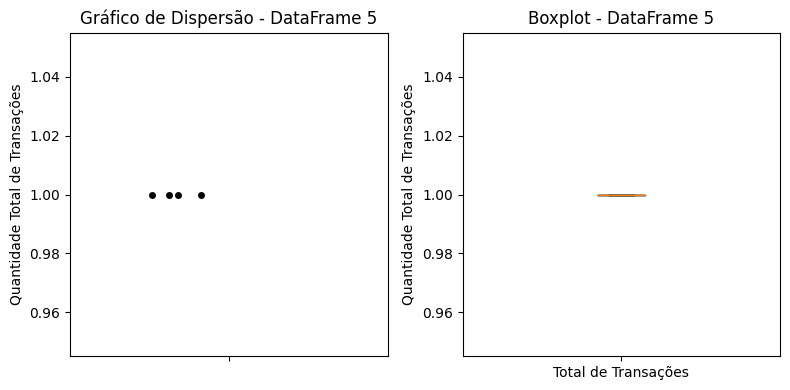

...

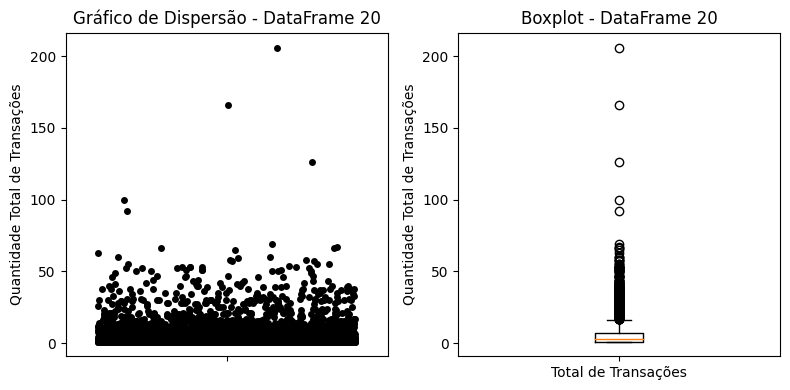

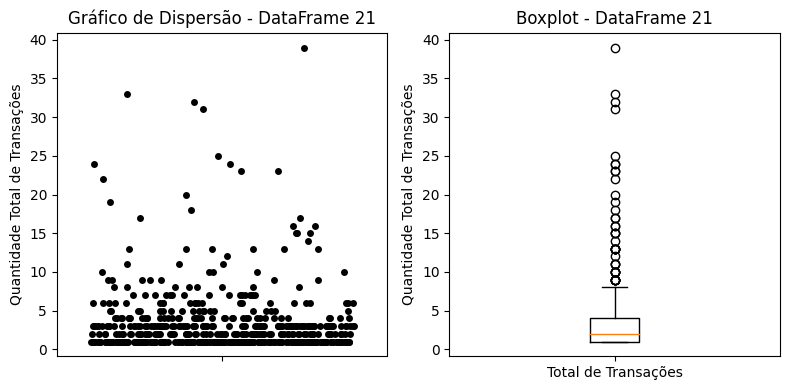

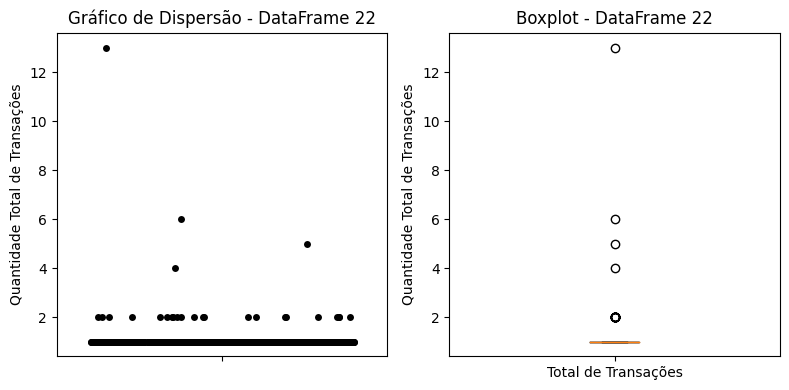

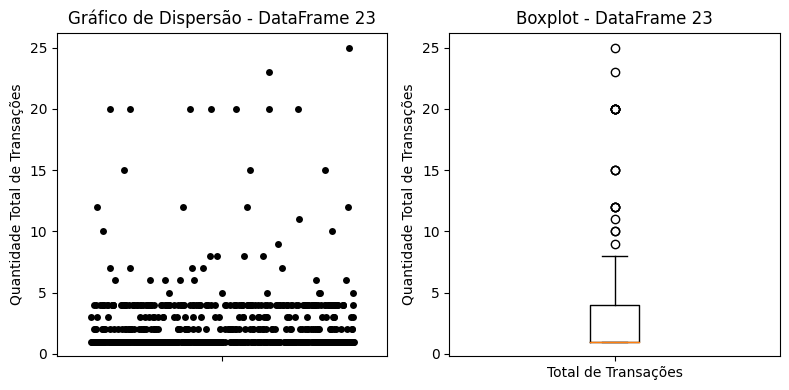

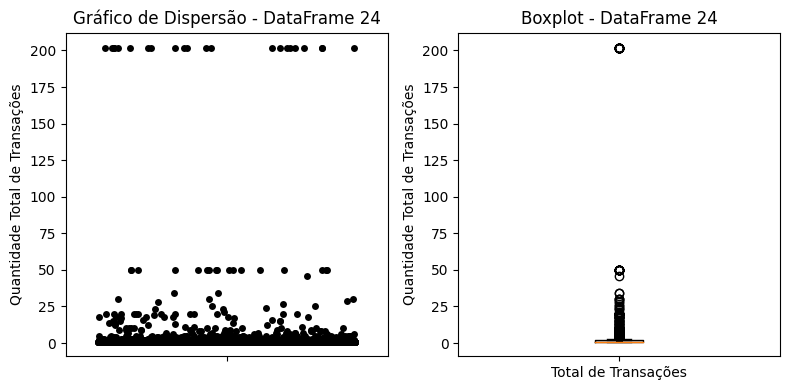

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):
    # Criar uma lista com os valores da quantidade total de transações
    total_transactions = list_df_comum[i].groupby('BLOCK_TIMESTAMP').size().values.tolist()

    # Criar os subplots
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4))

    # Plotar o gráfico de dispersão no primeiro subplot
    sns.stripplot(y=total_transactions, jitter=0.4, color='black', ax=axs[0])
    axs[0].set_ylabel('Quantidade Total de Transações')

    # Plotar o boxplot no segundo subplot
    axs[1].boxplot(total_transactions)
    axs[1].set_ylabel('Quantidade Total de Transações')
    axs[1].set_xticklabels(['Total de Transações'])

    # Definir o título para cada um dos subplots
    axs[0].set_title('Gráfico de Dispersão - DataFrame ' + str(i+1))
    axs[1].set_title('Boxplot - DataFrame ' + str(i+1))

    # Ajustar espaçamento entre subplots
    plt.tight_layout()

    # Exibir a figura completa
    plt.show()


<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


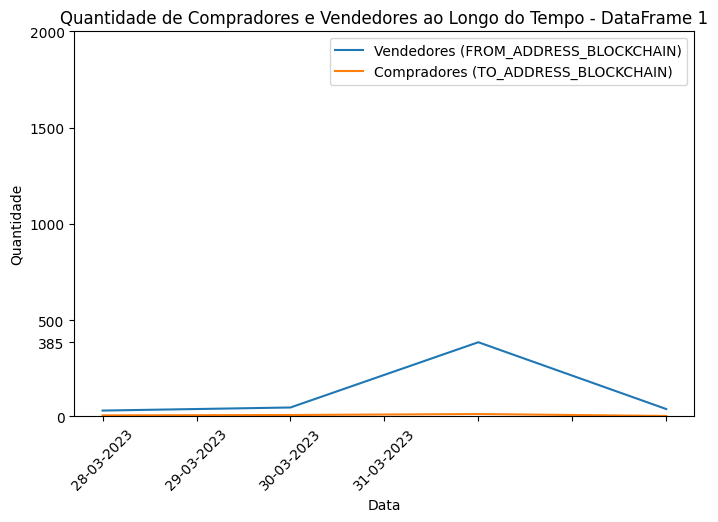

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


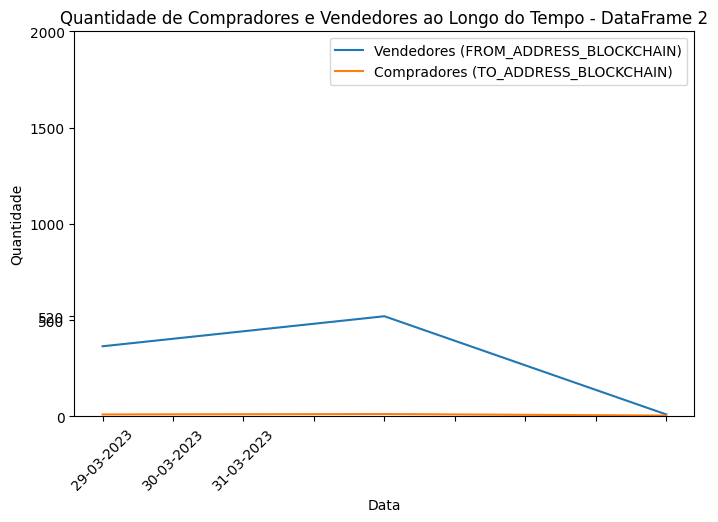

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


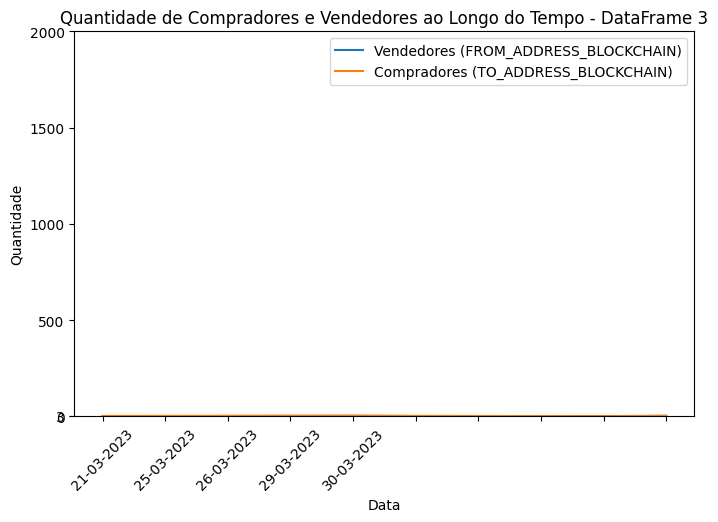

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


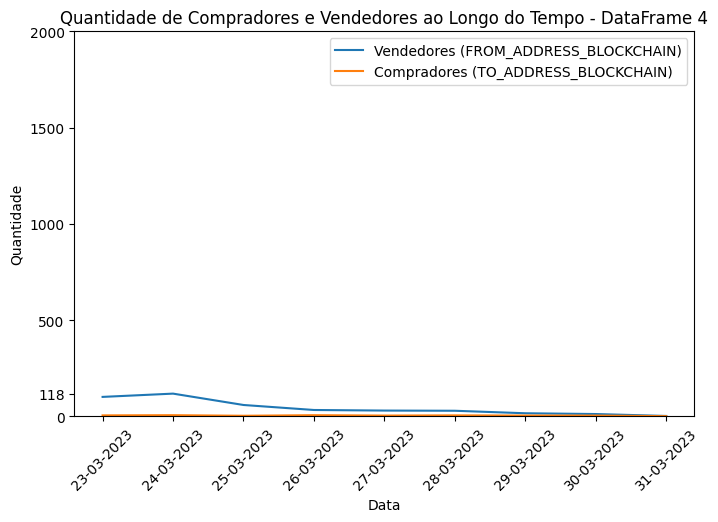

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


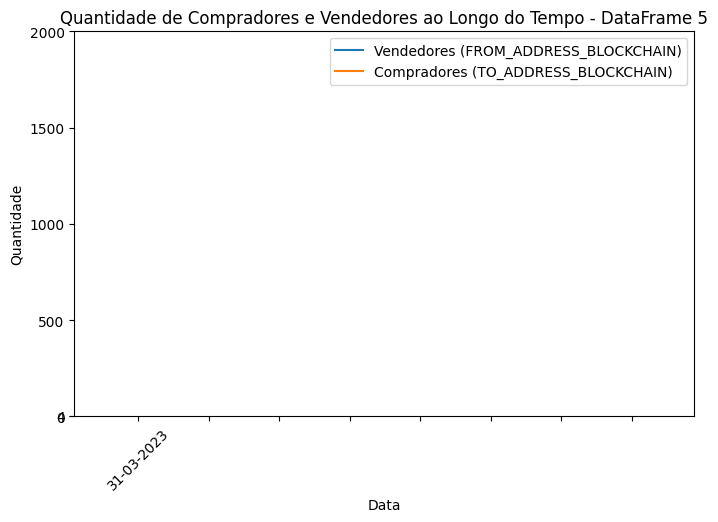

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


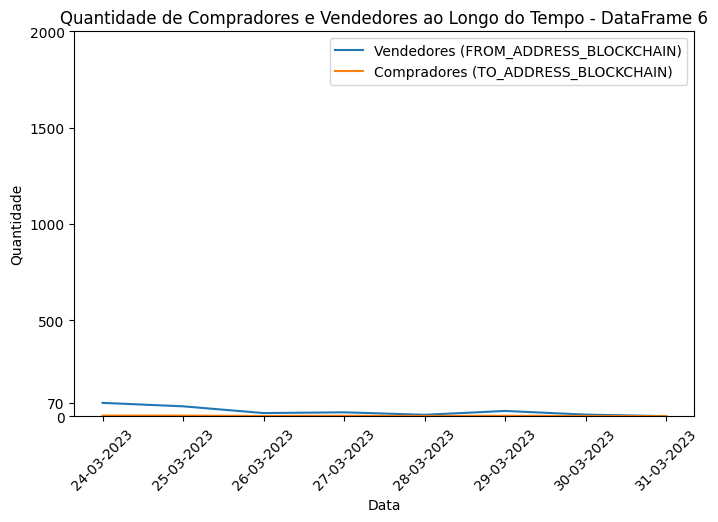

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


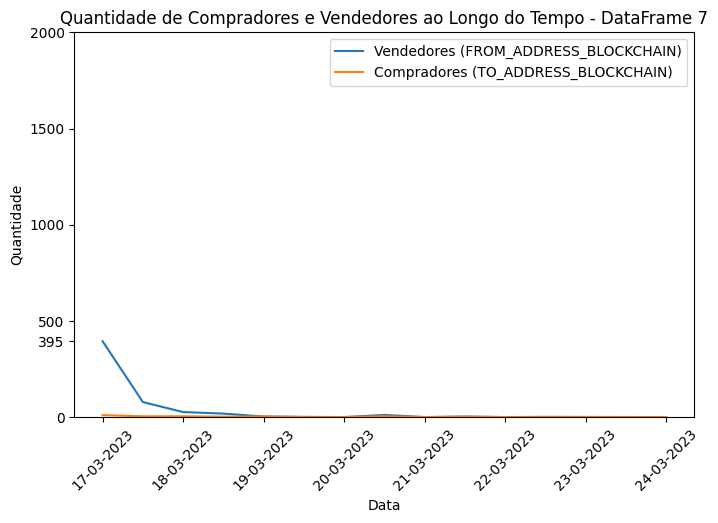

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


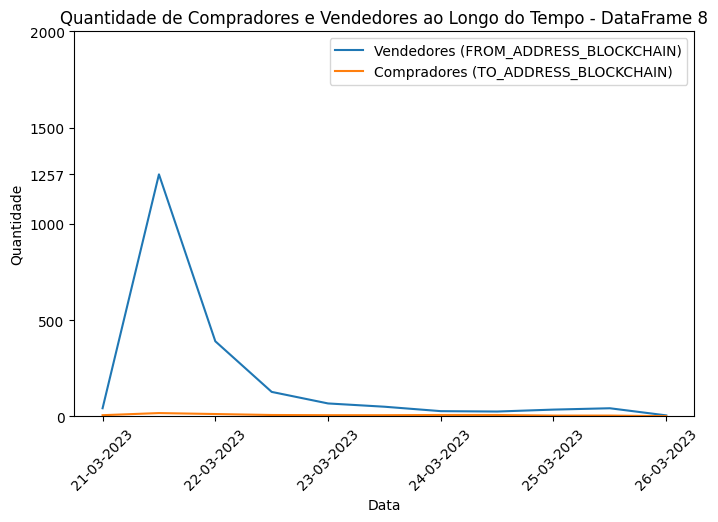

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


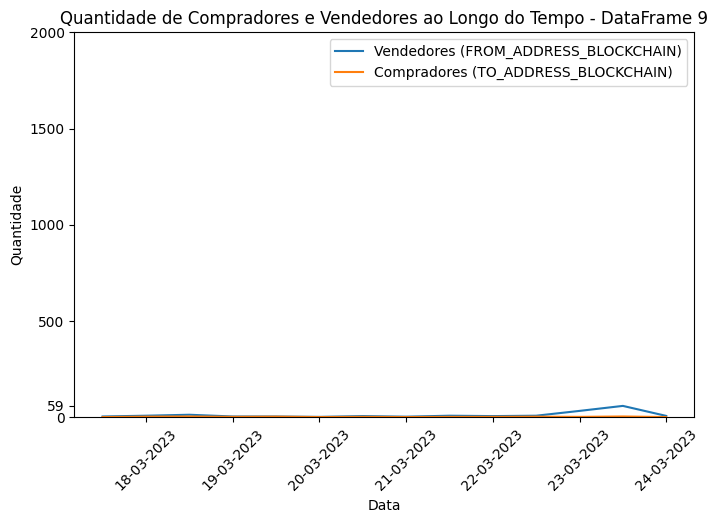

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


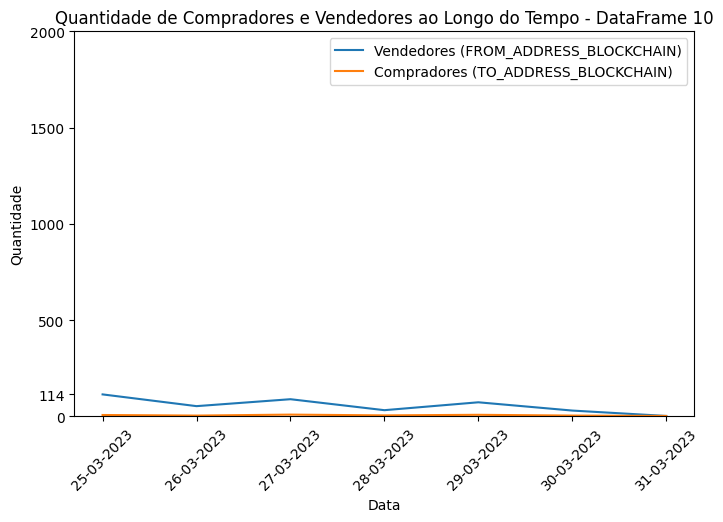

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


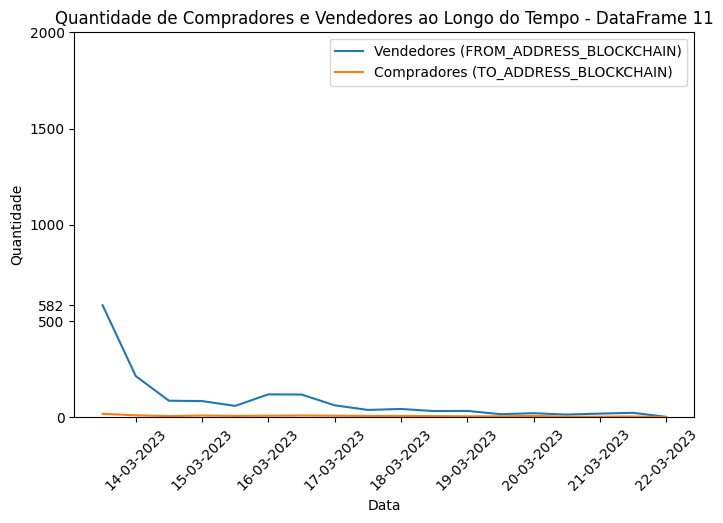

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


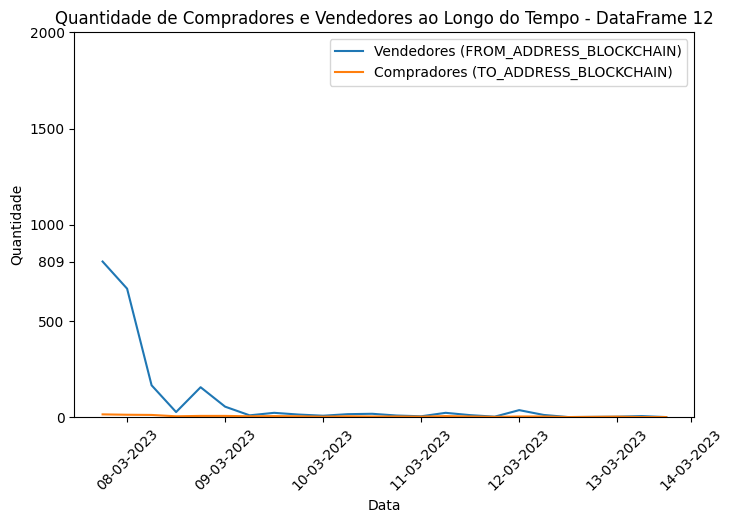

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


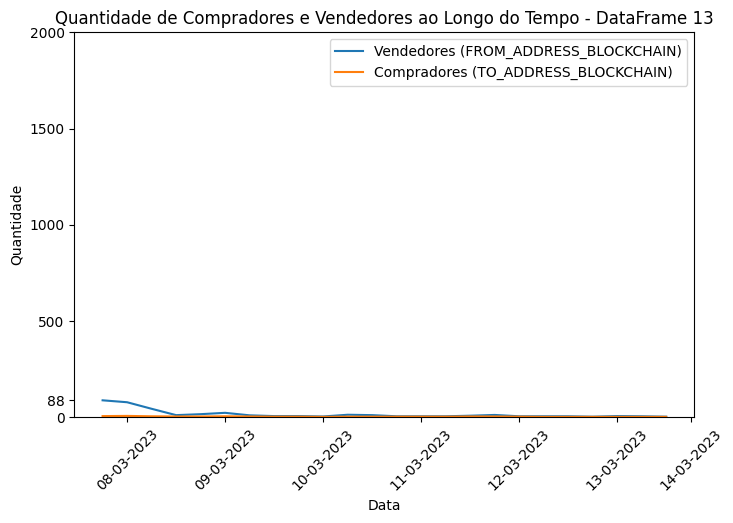

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


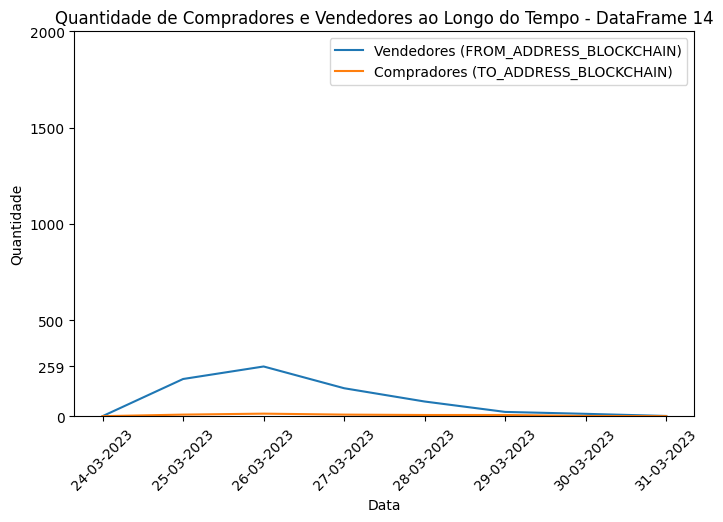

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


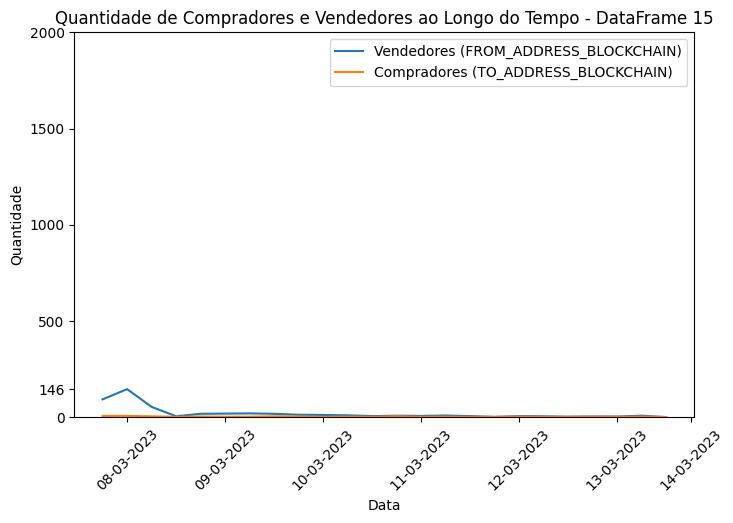

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


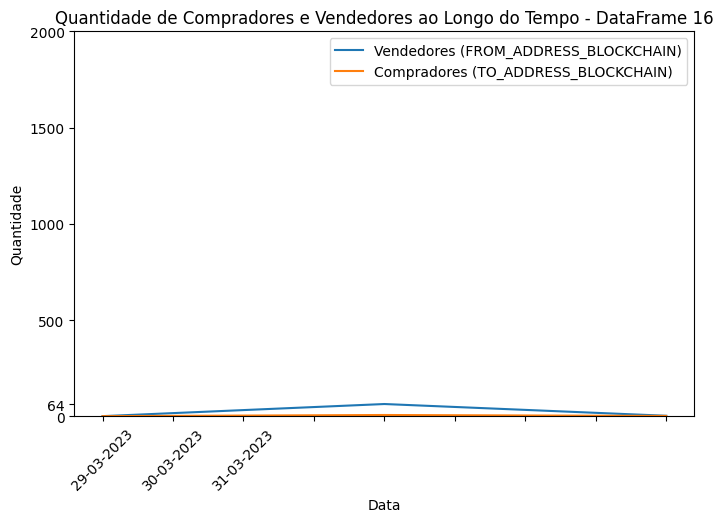

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


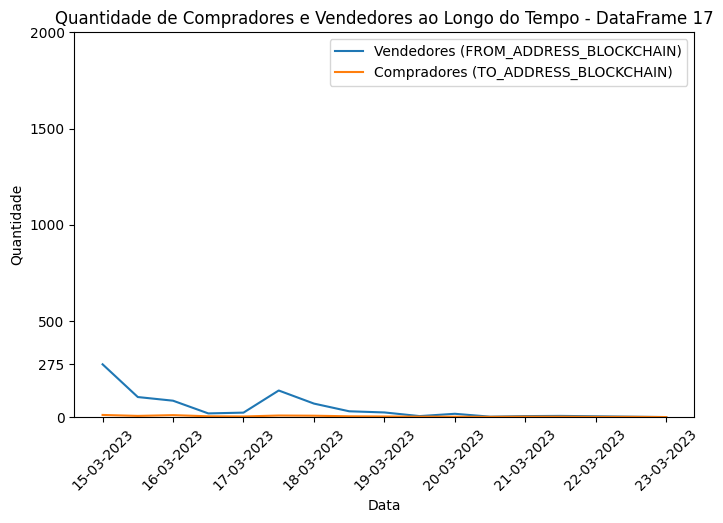

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


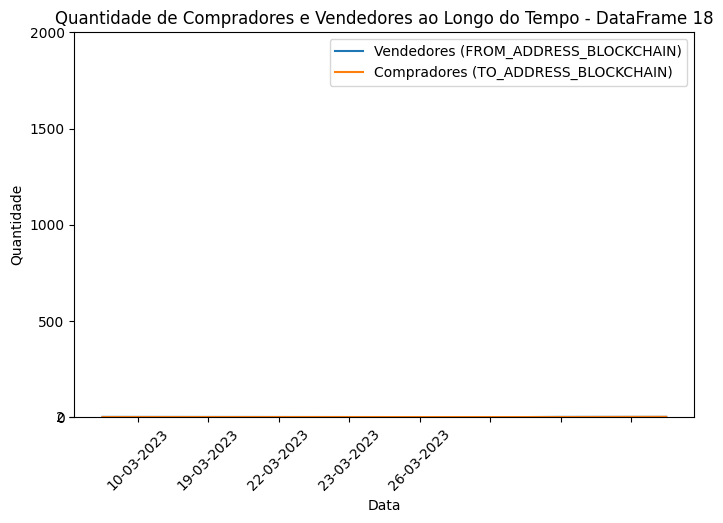

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


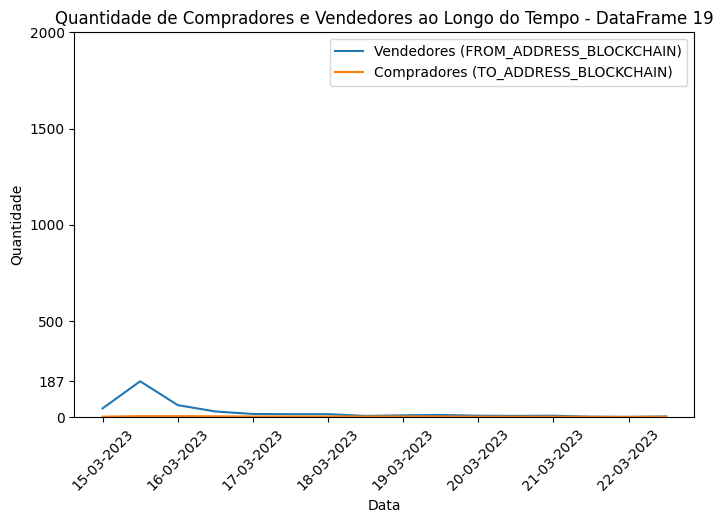

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


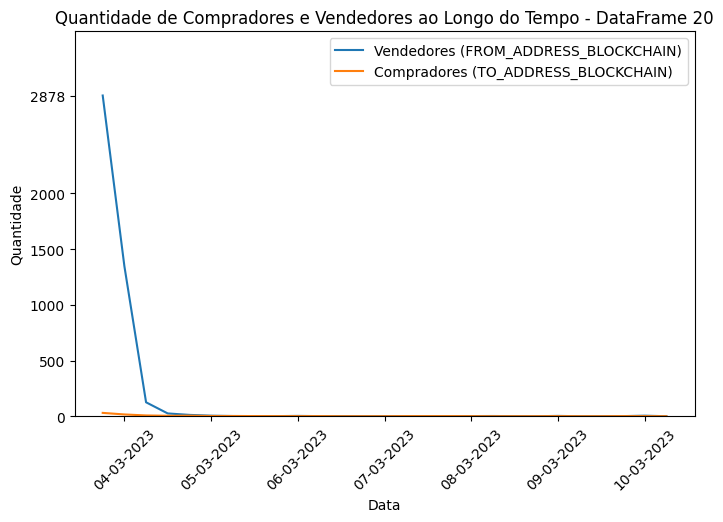

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


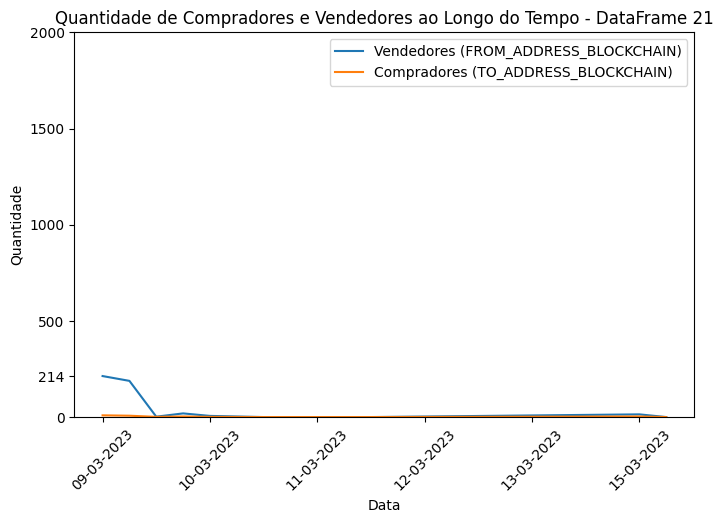

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


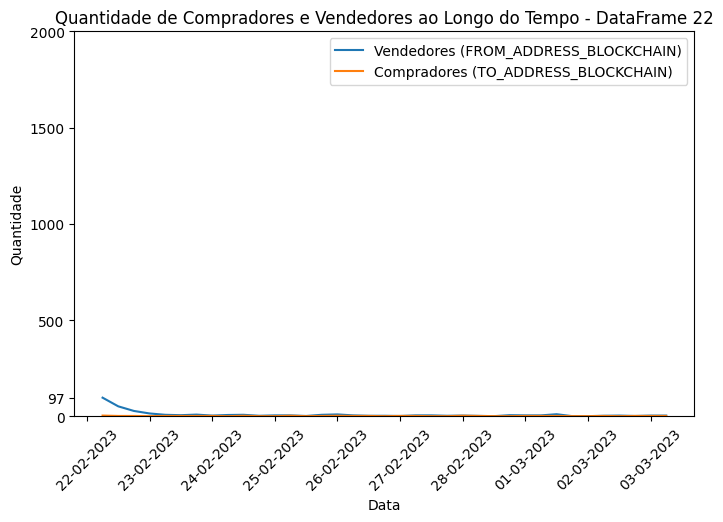

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


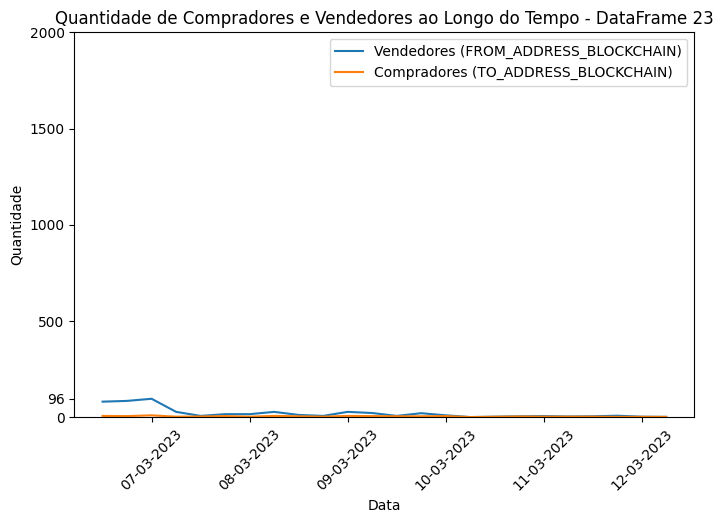

<ipython-input-32-d7eee3cca4c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


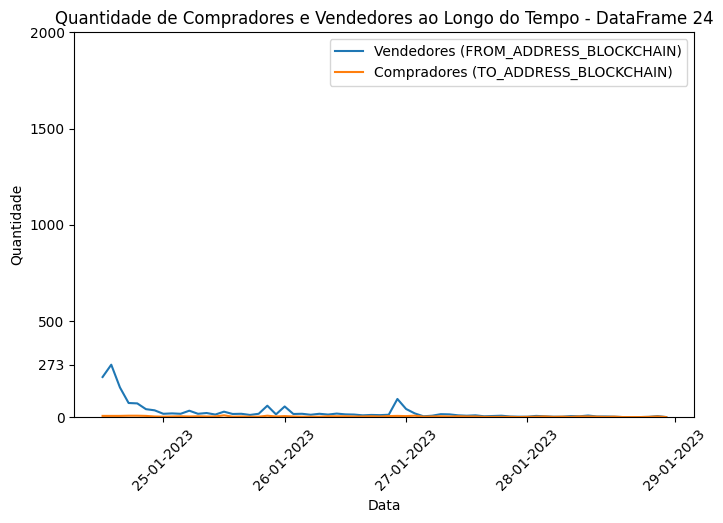

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):
    # Criar uma lista com os valores da quantidade total de transações
    # Calculando a contagem diária de compradores únicos
    df_daily_count_from = list_df_comum[i].groupby('BLOCK_DATE')['FROM_ADDRESS_BLOCKCHAIN'].nunique()
    df_daily_count_to = list_df_comum[i].groupby('BLOCK_DATE')['TO_ADDRESS_BLOCKCHAIN'].nunique()

    # Converter o índice em um objeto DatetimeIndex
    df_daily_count_from.index = pd.to_datetime(df_daily_count_from.index)
    df_daily_count_to.index = pd.to_datetime(df_daily_count_to.index)

    # Definindo o tamanho da figura
    plt.figure(figsize=(8, 5))

    # Plotando os pontos
    # plt.scatter(df_daily_count_from.index, df_daily_count_from, s=10, label='Vendedores (FROM_ADDRESS_BLOCKCHAIN)')
    # plt.scatter(df_daily_count_to.index, df_daily_count_to, s=10, label='Compradores (TO_ADDRESS_BLOCKCHAIN)')

    # Plotando as séries temporais de vendedores únicos
    plt.plot(df_daily_count_from.index, df_daily_count_from, label='Vendedores (FROM_ADDRESS_BLOCKCHAIN)')
    plt.plot(df_daily_count_to.index, df_daily_count_to, label='Compradores (TO_ADDRESS_BLOCKCHAIN)')

    plt.title('Quantidade de Compradores e Vendedores ao Longo do Tempo - DataFrame ' + str(i+1))

    # Girando os rótulos do eixo X em 45 graus
    plt.xticks(rotation=45)

    # Definindo os rótulos do eixo x e y
    plt.xlabel('Data')
    plt.ylabel('Quantidade')

    # Formatar as datas no eixo x
    plt.gca().xaxis.set_major_formatter(plt.FixedFormatter(df_daily_count_from.index.strftime('%d-%m-%Y')))

    # Definindo os rótulos do eixo y
    plt.ylim(0, max(max(df_daily_count_from), max(df_daily_count_to))*1.2)
    plt.yticks([0, 500, 1000, 1500, 2000, max(max(df_daily_count_from), max(df_daily_count_to))])

    # Adicionando uma legenda
    plt.legend()

    # Exibindo o gráfico
    plt.show()


Gráfico de boxplot. Ele define o tamanho da figura do gráfico, gera o boxplot utilizando a função sns.boxplot(), define os rótulos dos eixos x e y e a escala do eixo y, e exibe o gráfico final. Em resumo, esse código produz um gráfico que mostra a distribuição dos valores da série temporal em quartis (25%, 50% e 75%), permitindo a identificação de outliers, bem como a comparação da dispersão dos dados em diferentes períodos de tempo. Neste caso, o boxplot é utilizado para visualizar a distribuição do número de vendedores únicos em cada dia, com a escala do eixo y limitada a 30

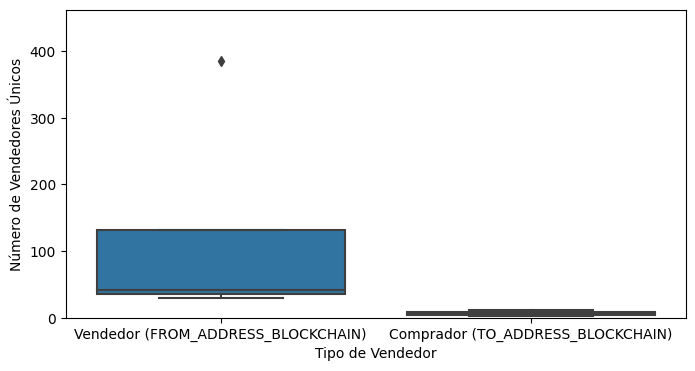

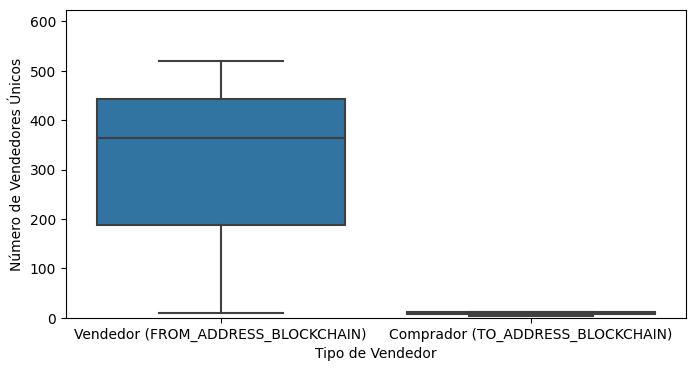

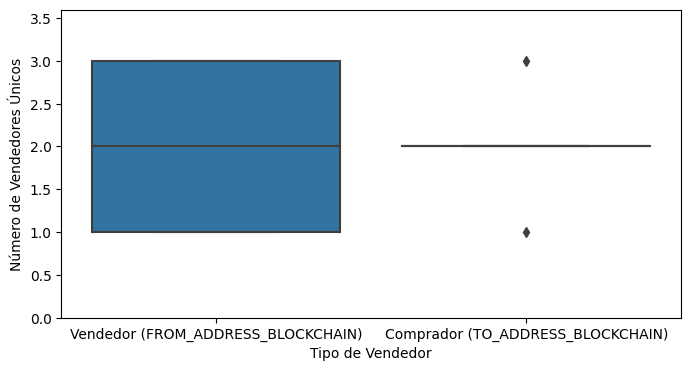

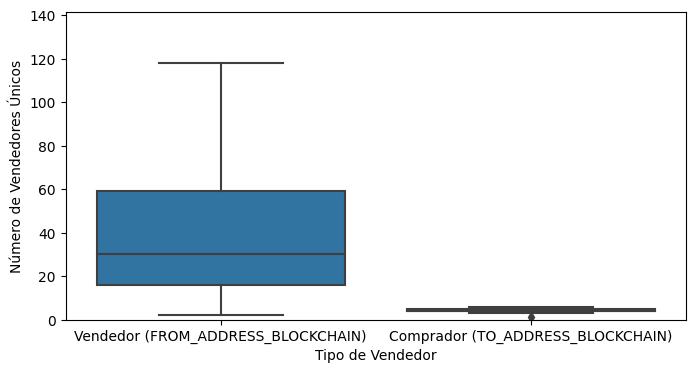

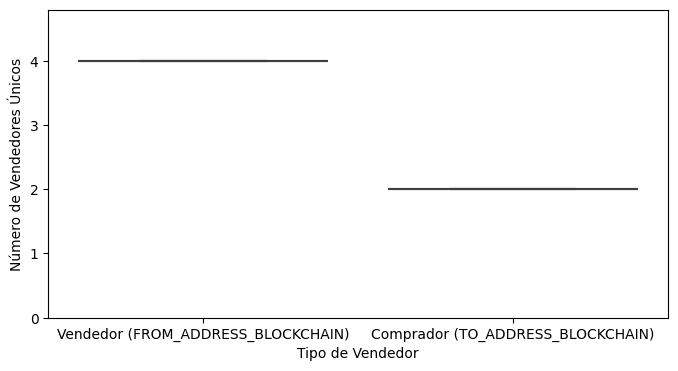

...

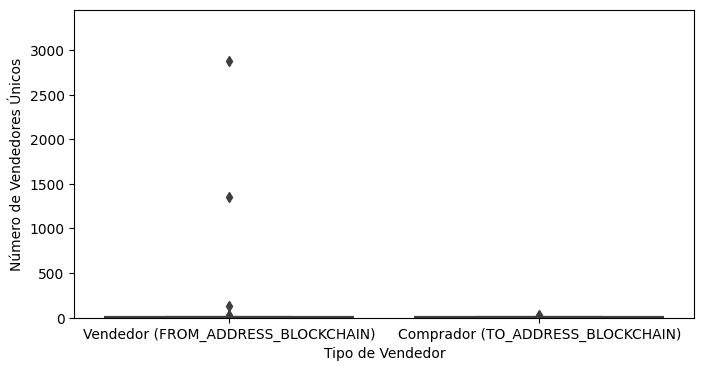

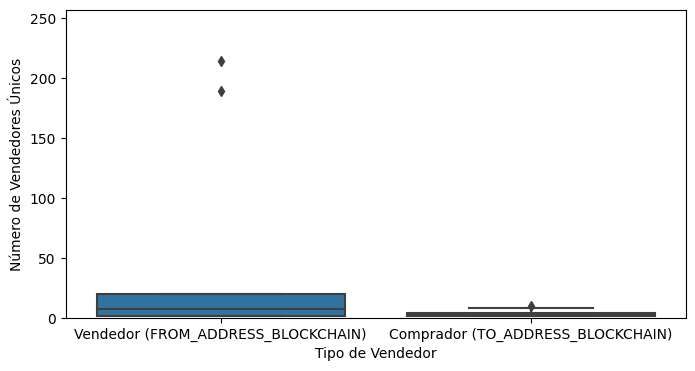

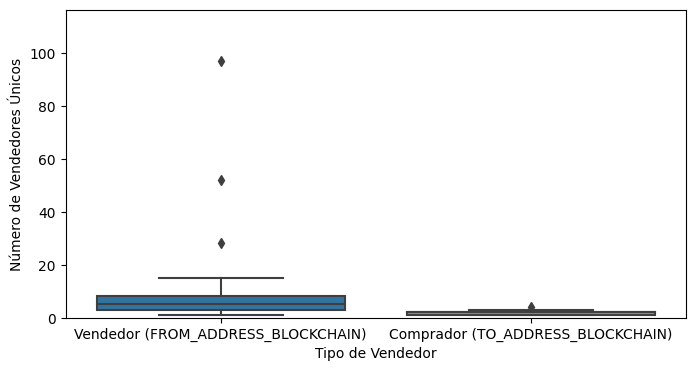

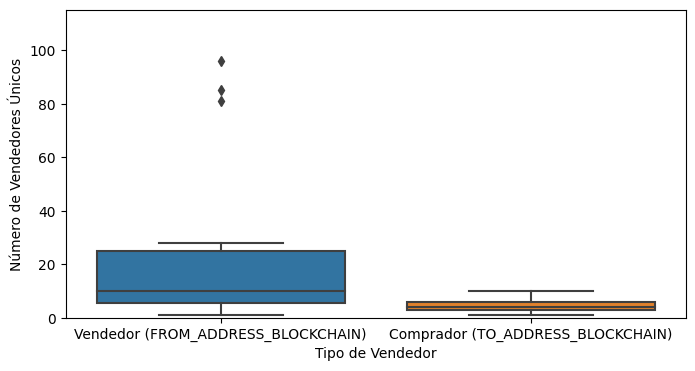

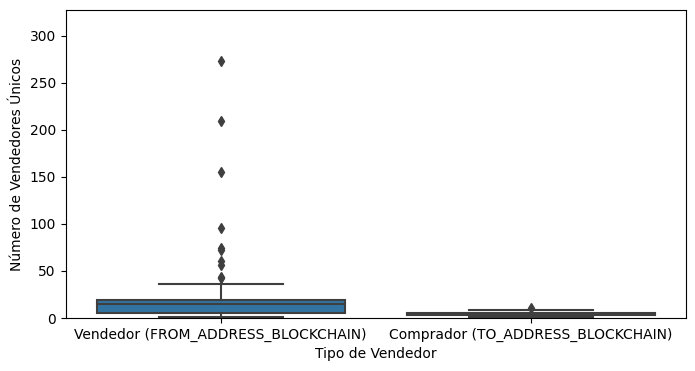

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):
    # Criar uma lista com os valores da quantidade total de transações
    # Calculando a contagem diária de compradores únicos
    df_daily_count_from = list_df_comum[i].groupby('BLOCK_DATE')['FROM_ADDRESS_BLOCKCHAIN'].nunique()
    df_daily_count_to = list_df_comum[i].groupby('BLOCK_DATE')['TO_ADDRESS_BLOCKCHAIN'].nunique()

    # Definindo o tamanho da figura
    plt.figure(figsize=(8, 4))

    # Gerando o boxplot para as colunas FROM_ADDRESS_BLOCKCHAIN e TO_ADDRESS_BLOCKCHAIN
    sns.boxplot(data=[df_daily_count_from, df_daily_count_to], orient='v')

    # Definindo os rótulos do eixo x e y
    plt.xlabel('Tipo de Vendedor')
    plt.ylabel('Número de Vendedores Únicos')

    # Definindo a escala do eixo y
    plt.ylim(0, max(max(df_daily_count_from), max(df_daily_count_to))*1.2)

    # Definindo as etiquetas do eixo x
    plt.xticks([0, 1], ['Vendedor (FROM_ADDRESS_BLOCKCHAIN)', 'Comprador (TO_ADDRESS_BLOCKCHAIN)'])

    # Exibindo o gráfico
    plt.show()


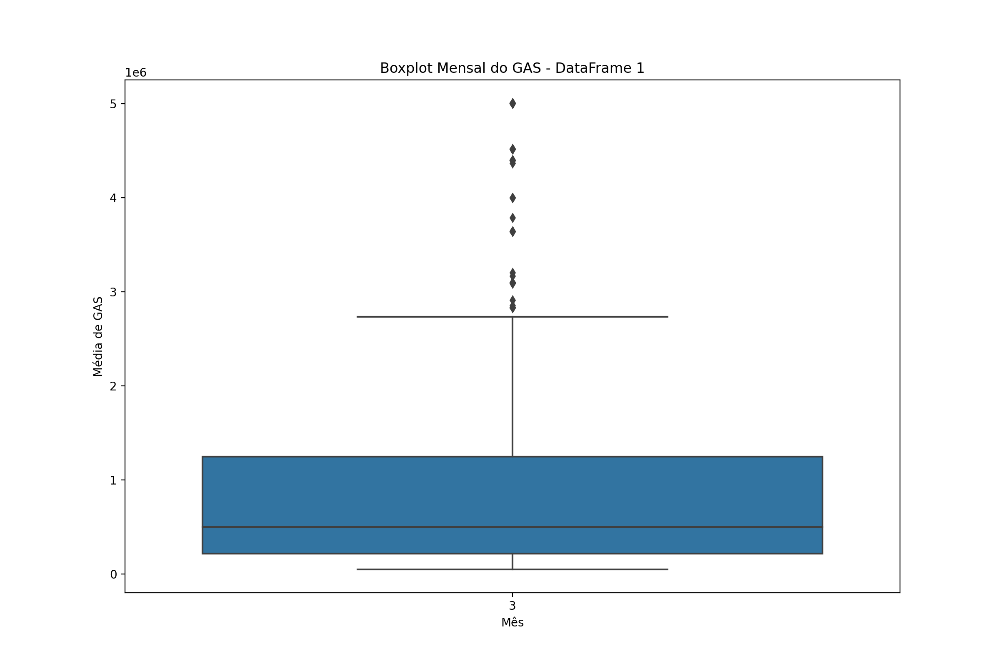

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Certifique-se de que 'BLOCK_DATE' seja do tipo datetime
df = list_df_comum[1]  # Escolha o DataFrame desejado
df['BLOCK_DATE'] = pd.to_datetime(df['BLOCK_DATE'])

# Crie um DataFrame com a média do GAS para cada mês e endereço de origem
monthly_data = df.groupby(['FROM_ADDRESS', df['BLOCK_DATE'].dt.month])['GAS'].mean().reset_index()

# Crie um boxplot mensal
plt.figure(figsize=(12, 8))
sns.boxplot(x='BLOCK_DATE', y='GAS', data=monthly_data, palette='tab10')
plt.title("Boxplot Mensal do GAS - DataFrame 1")
plt.xlabel("Mês")
plt.ylabel("Média de GAS")
plt.show()


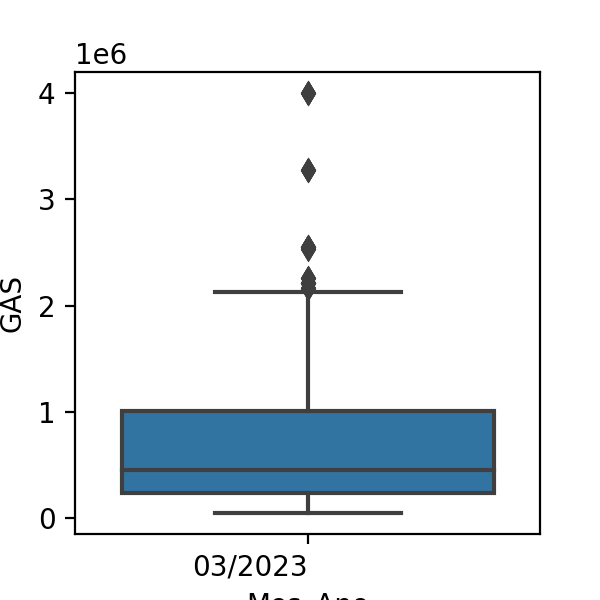

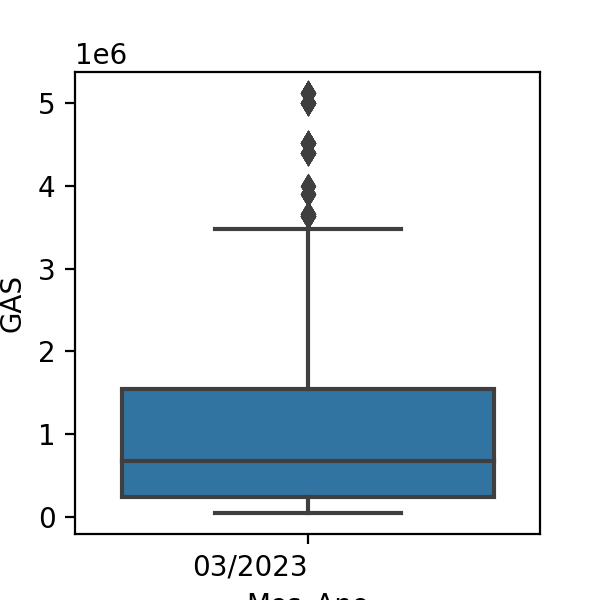

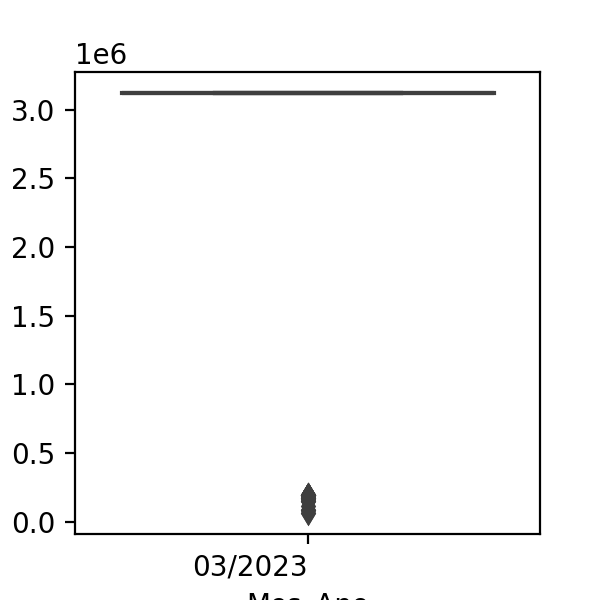

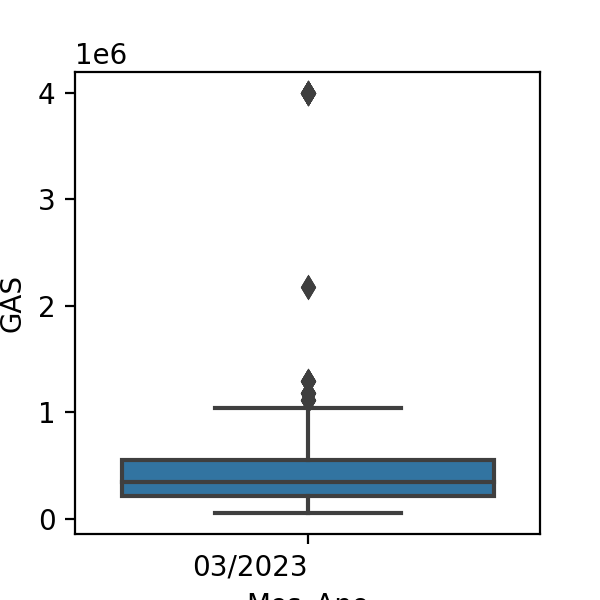

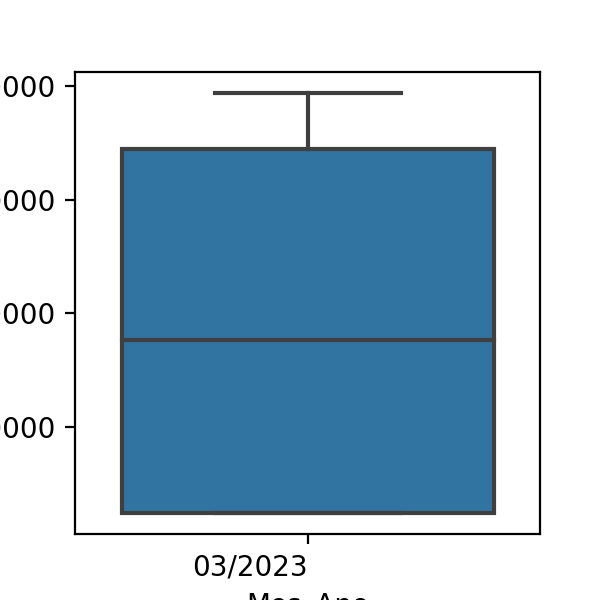

...

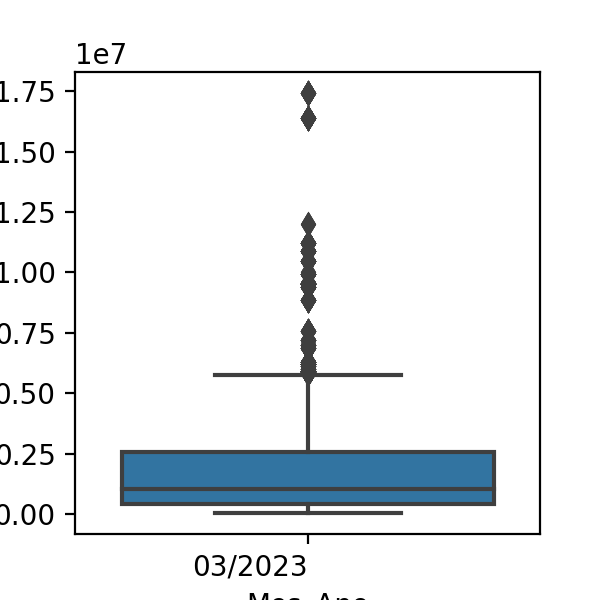

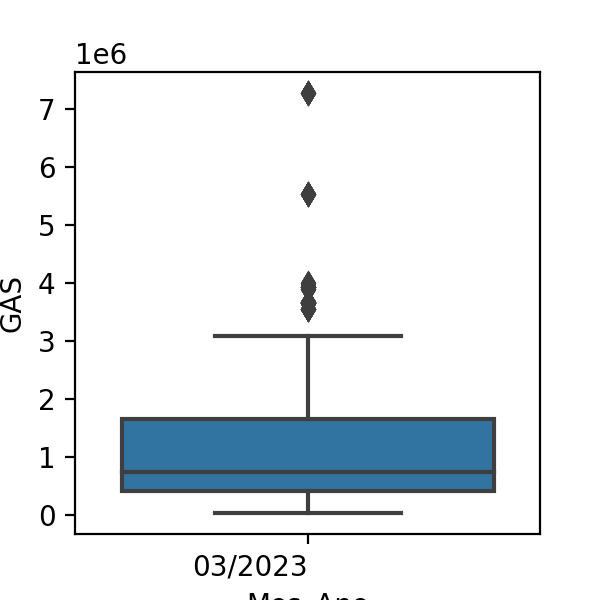

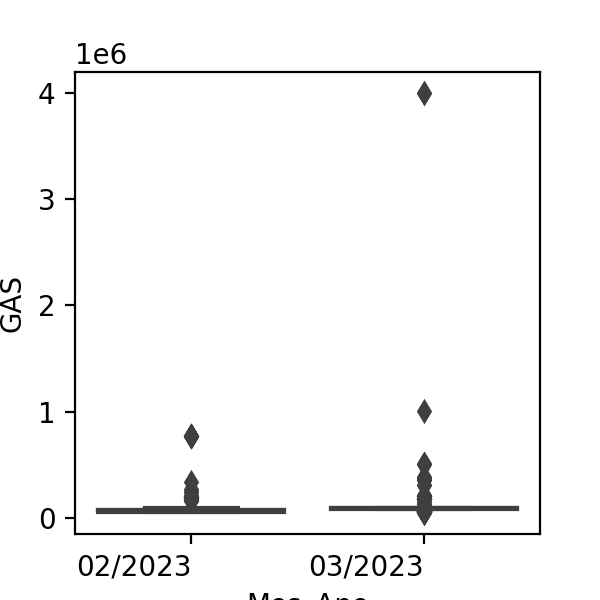

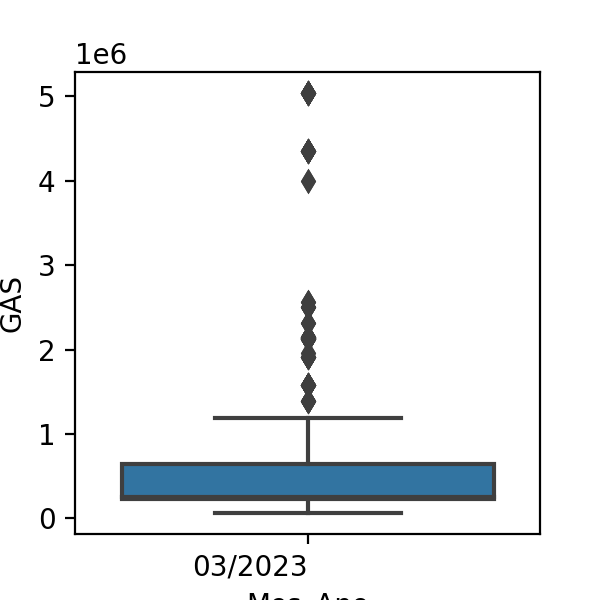

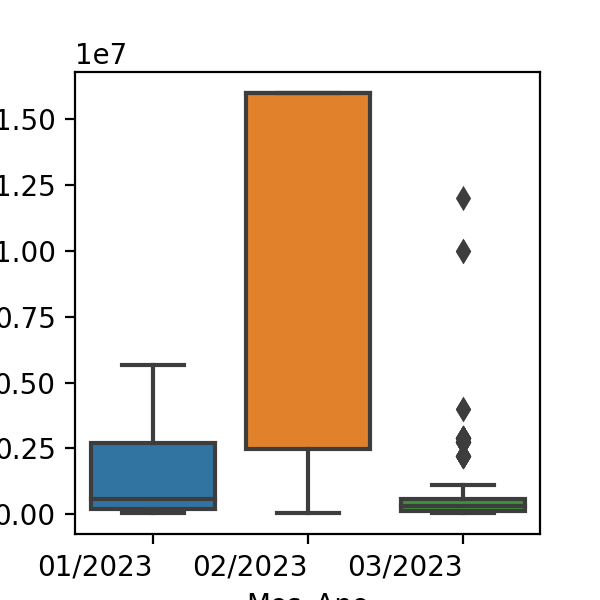

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Certifique-se de que 'BLOCK_DATE' seja do tipo datetime
for i, df in enumerate(list_df_comum):
    df['BLOCK_DATE'] = pd.to_datetime(df['BLOCK_DATE'])

    # Crie uma coluna com o mês e ano formatados
    df['Mes_Ano'] = df['BLOCK_DATE'].dt.strftime('%m/%Y')

    # Crie um boxplot mensal
    plt.figure(figsize=(3, 3))
    sns.boxplot(x='Mes_Ano', y='GAS', data=df, palette='tab10')
#   plt.title(f"Boxplot Mensal do GAS - DataFrame {i}")
#   plt.xlabel("Mês/Ano")
    plt.ylabel("GAS")
    plt.yscale('linear')  # Garante que a escala do eixo y seja linear
    plt.xticks(ha='right')  # Rotaciona os rótulos do eixo x
    plt.show()


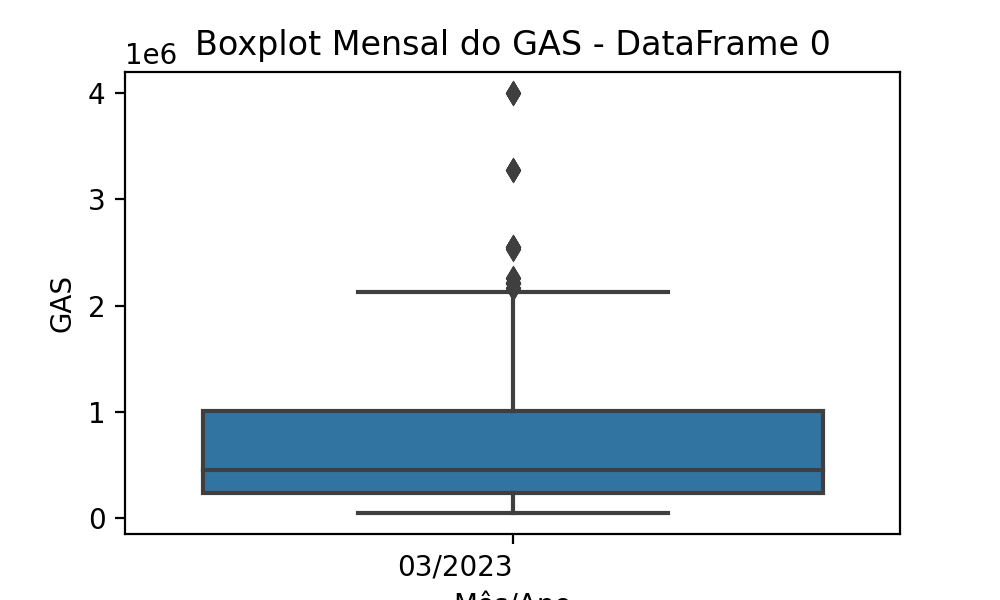

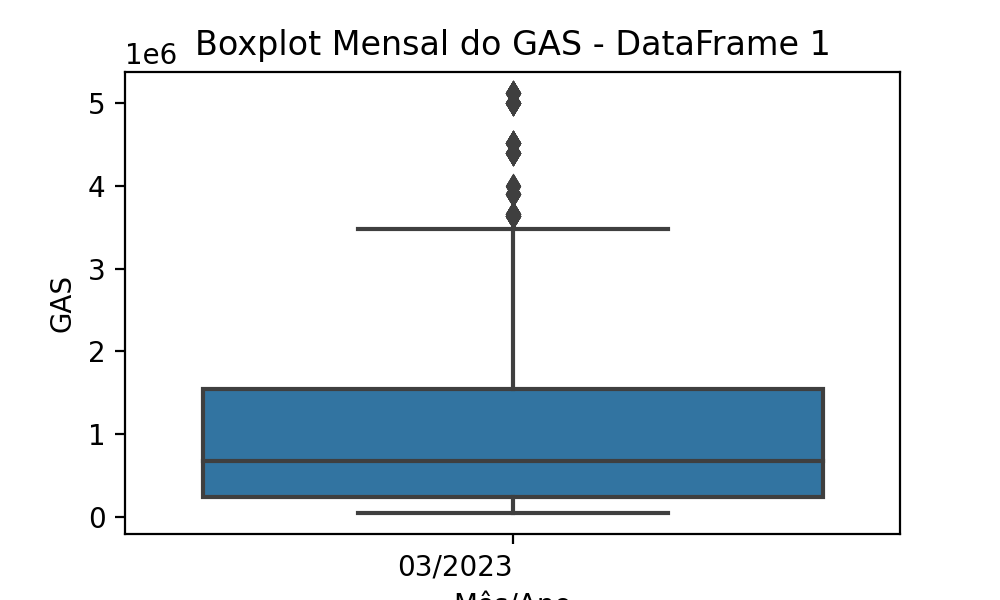

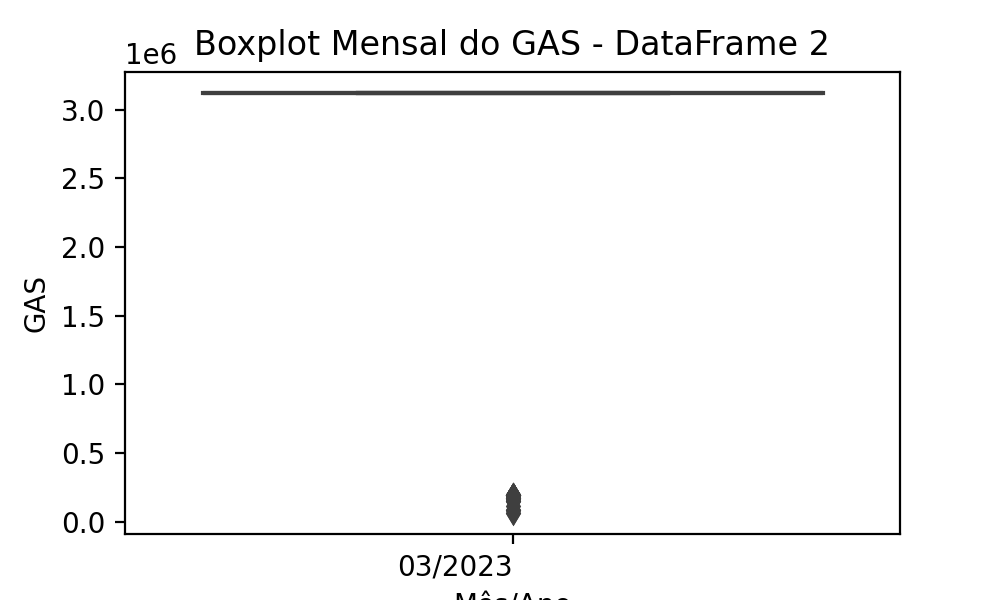

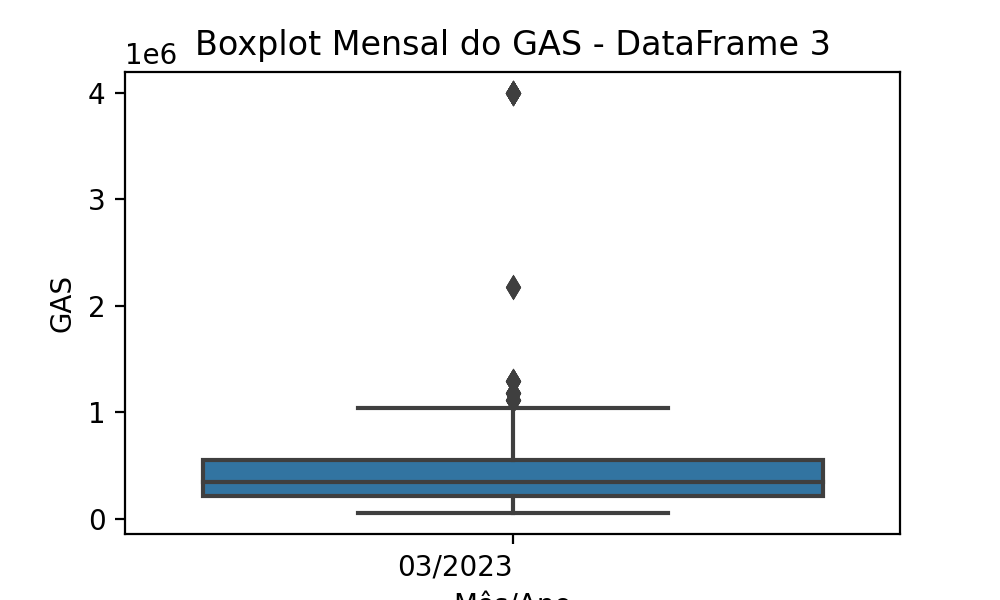

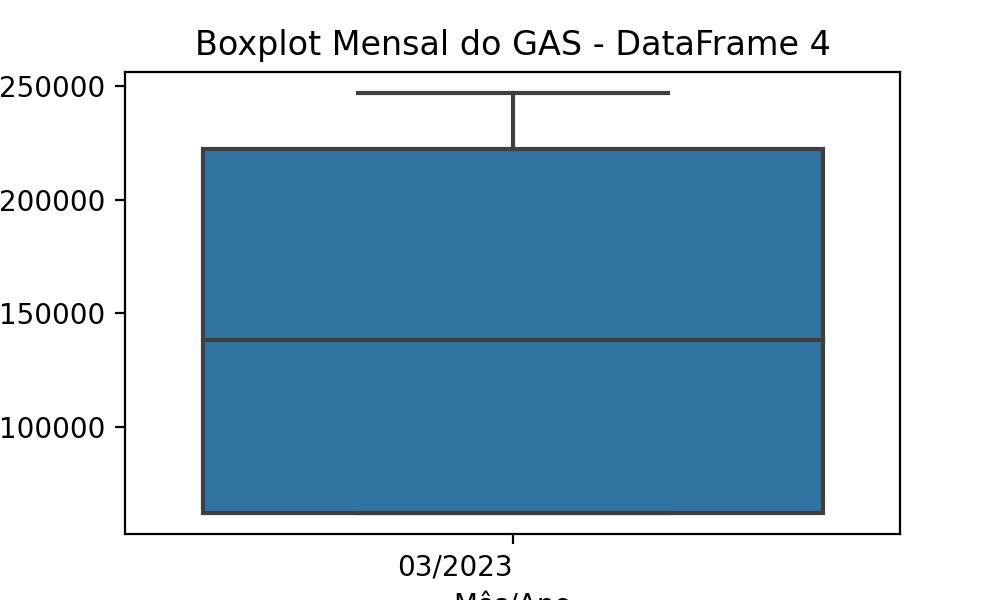

...

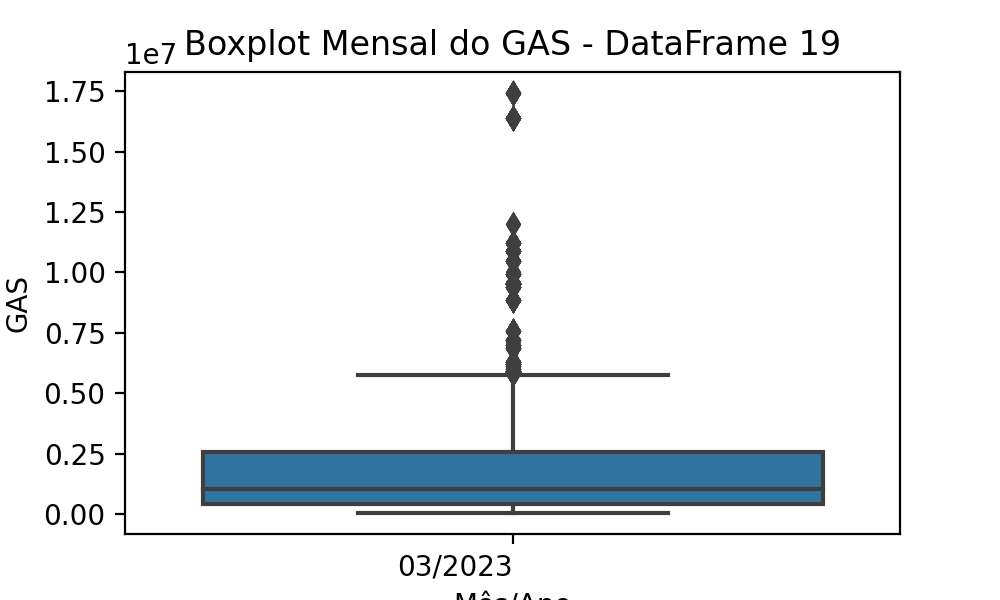

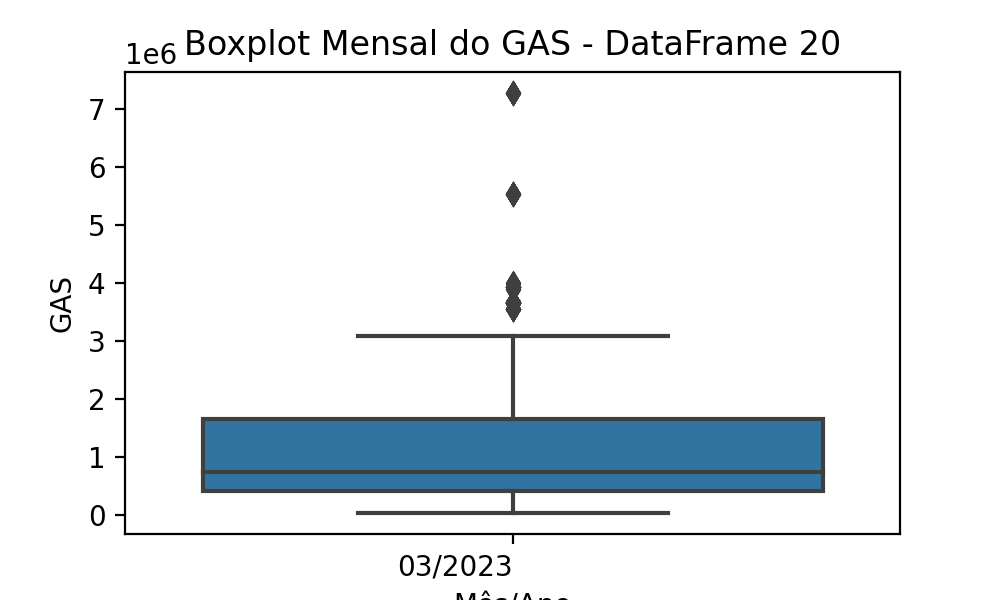

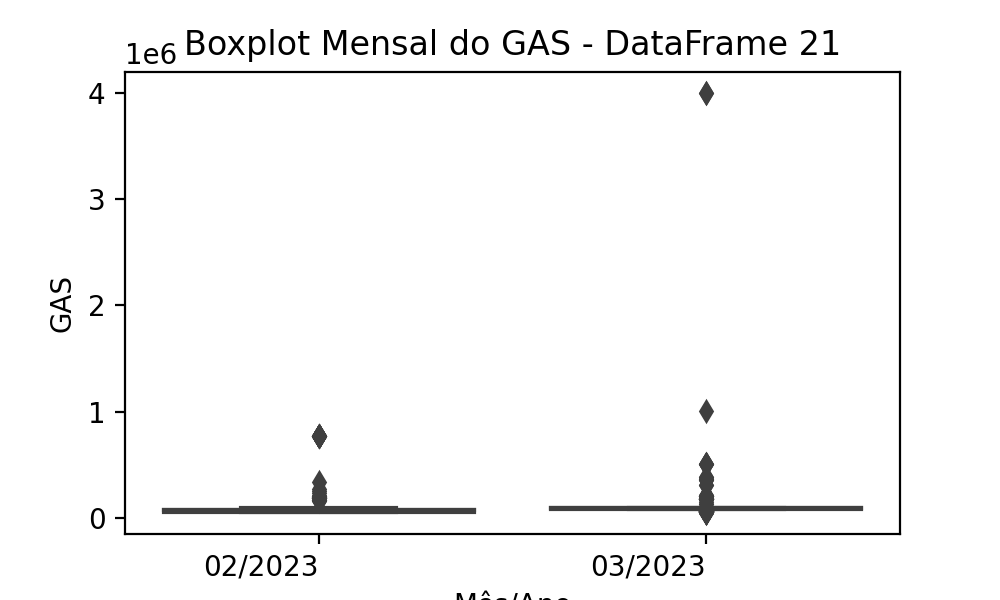

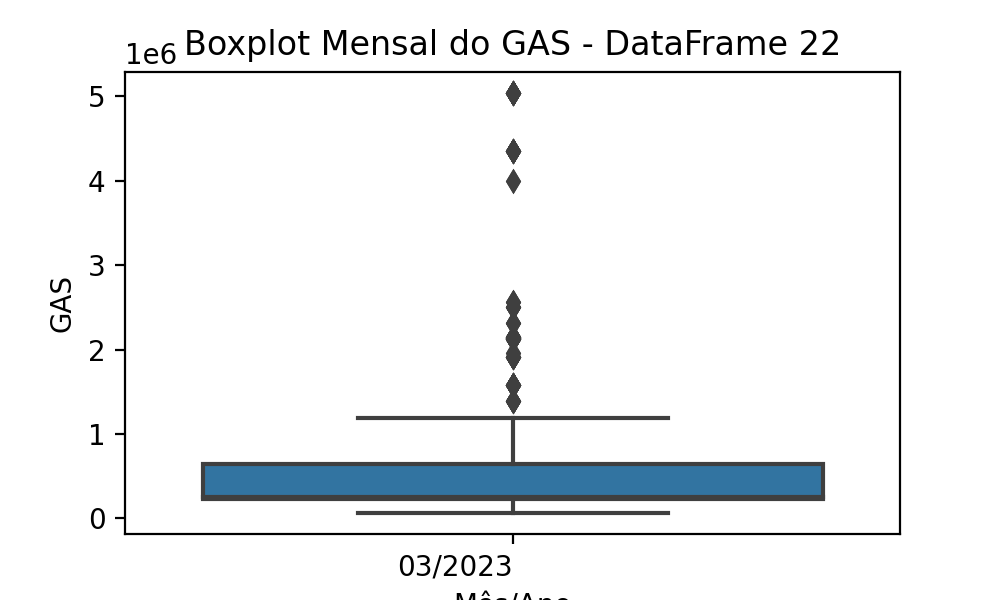

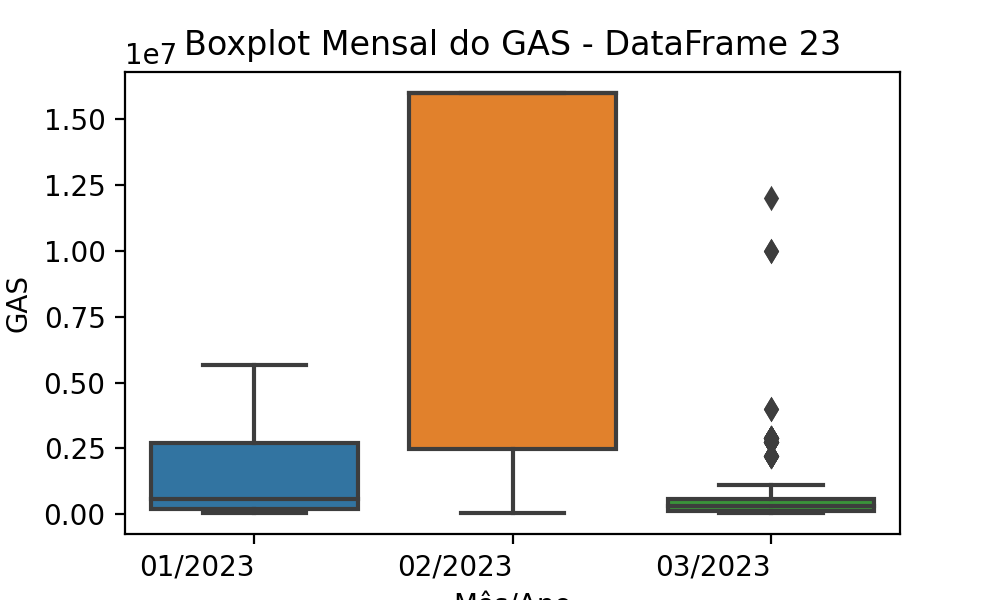

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Certifique-se de que 'BLOCK_DATE' seja do tipo datetime
for i, df in enumerate(list_df_comum):
    df['BLOCK_DATE'] = pd.to_datetime(df['BLOCK_DATE'])

    # Crie uma coluna com o mês e ano formatados
    df['Mes_Ano'] = df['BLOCK_DATE'].dt.strftime('%m/%Y')

    # Crie um boxplot mensal
    plt.figure(figsize=(5, 3))
    sns.boxplot(x='Mes_Ano', y='GAS', data=df, palette='tab10')
    plt.title(f"Boxplot Mensal do GAS - DataFrame {i}")
    plt.xlabel("Mês/Ano")
    plt.ylabel("GAS")
    plt.xticks(ha='right')  # Rotaciona os rótulos do eixo x
    plt.show()


In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):

  # Define a coluna BLOCK_TIMESTAMP como o índice do DataFrame
  list_df_comum[i].set_index('BLOCK_TIMESTAMP', inplace=True)

  # Cria uma série temporal com base na coluna VALUE
  serie_temporal_gas = list_df_comum[i]['GAS']

In [ ]:
# Exibe a série temporal
print('Lines: {}'.format(serie_temporal_gas.shape[0]))
# print('Columns: {}'.format(serie_temporal_gas.shape[1]))
print(serie_temporal_gas)

Lines: 9678
BLOCK_TIMESTAMP
2023-01-25 14:01:59+00:00      217429
2023-01-25 14:02:23+00:00      151076
2023-01-25 14:02:23+00:00      151076
2023-01-25 14:02:23+00:00      193193
2023-01-25 14:02:47+00:00      217487
                               ...   
2023-03-30 16:43:47+00:00      589348
2023-03-30 16:43:47+00:00      589348
2023-03-30 22:09:47+00:00    10000000
2023-03-30 22:09:47+00:00    10000000
2023-03-31 00:29:47+00:00      162740
Name: GAS, Length: 9678, dtype: int64


In [ ]:
# create an auxiliar dataframe to analyse missing data
cons = pd.DataFrame({
                    'type': df.dtypes,
                    'missing' : df.isna().sum(),
                    'size' : df.shape[0],
                    'unique': df.nunique()})
cons['percentual'] = round(cons['missing'] / cons['size'],2)

In [ ]:
cons

,type,missing,size,unique,percentual
FROM_ADDRESS,object,0,9678,1971,0.0
TO_ADDRESS,object,0,9678,1618,0.0
VALUE,int64,0,9678,7843,0.0
TRANSACTION_HASH,object,0,9678,2333,0.0
NONCE,int64,0,9678,918,0.0
FROM_ADDRESS_BLOCKCHAIN,object,0,9678,1255,0.0
TO_ADDRESS_BLOCKCHAIN,object,0,9678,26,0.0
GAS,int64,0,9678,1299,0.0
RECEIPT_GAS_USED,int64,0,9678,1394,0.0
BLOCK_DATE,object,0,9678,65,0.0


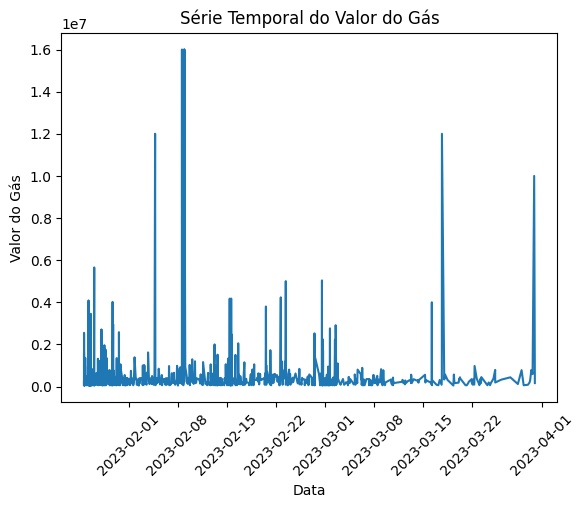

In [ ]:
import matplotlib.pyplot as plt

# Plotar o gráfico da série temporal
plt.plot(serie_temporal_gas)

# Girando os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)
plt.xlabel('Data')
plt.ylabel('Valor do Gás')
plt.title('Série Temporal do Valor do Gás')
plt.show()


In [ ]:
# Calcular medidas estatísticas descritivas
media = serie_temporal_gas.mean()
mediana = serie_temporal_gas.median()
desvio_padrao = serie_temporal_gas.std()
minimo = serie_temporal_gas.min()
maximo = serie_temporal_gas.max()

print('Média:', media)
print('Mediana:', mediana)
print('Desvio Padrão:', desvio_padrao)
print('Mínimo:', minimo)
print('Máximo:', maximo)


Média: 7991026.652924158
Mediana: 3327570.0
Desvio Padrão: 7445441.654275278
Mínimo: 47177
Máximo: 16000000


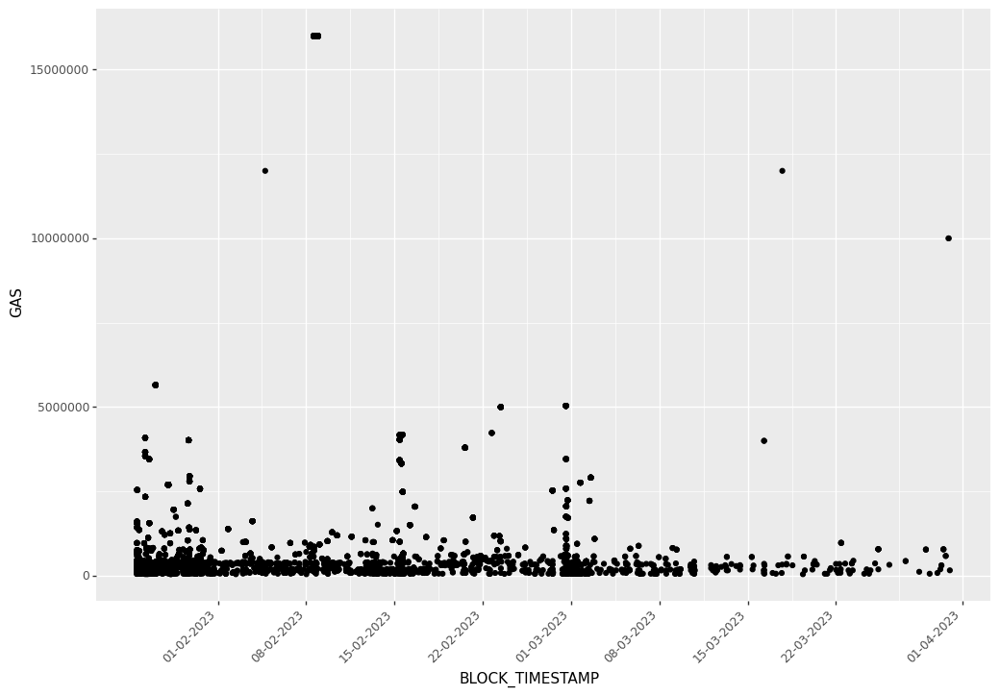

<ggplot: (8750340601860)>

In [ ]:
from plotnine import ggplot, aes, geom_point, scale_x_datetime, theme, element_text

# Transforma a série temporal em um DataFrame
df2 = pd.DataFrame({'BLOCK_TIMESTAMP': serie_temporal_gas.index, 'GAS': serie_temporal_gas.values})

# Cria o gráfico de dispersão com o eixo x formatado como data e tamanho aumentado
(ggplot(df2, aes(x='BLOCK_TIMESTAMP', y='GAS'))
 + geom_point()
 + scale_x_datetime(date_labels='%d-%m-%Y')
 + theme(axis_text_x=element_text(rotation=45, hjust=1), figure_size=(12, 8))  # Define o tamanho do gráfico e gira os rótulos do eixo x em 45 graus
)


In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):
  # Cria uma série temporal com base na coluna VALUE
  serie_temporal_gas2 = list_df_comum[i][['GAS','RECEIPT_GAS_USED']]

  # Exibe a série temporal
  print('Lines: {}'.format(serie_temporal_gas2.shape[0]))
  print('Columns: {}'.format(serie_temporal_gas2.shape[1]))
  print(serie_temporal_gas2)

Lines: 1283
Columns: 2
                              GAS  RECEIPT_GAS_USED
BLOCK_TIMESTAMP                                    
2023-03-28 22:04:35+00:00   63429             48792
2023-03-28 22:06:23+00:00   93792             62528
2023-03-28 22:07:35+00:00   85659             65892
2023-03-28 22:08:59+00:00   85659             65892
2023-03-28 22:13:35+00:00  195029            145052
...                           ...               ...
2023-03-31 01:42:23+00:00  437917            321725
2023-03-31 01:42:23+00:00  437917            321725
2023-03-31 01:43:35+00:00  373057            284167
2023-03-31 01:43:35+00:00  373057            284167
2023-03-31 01:46:23+00:00  202073            150470

[1283 rows x 2 columns]
Lines: 2765
Columns: 2
                               GAS  RECEIPT_GAS_USED
BLOCK_TIMESTAMP                                     
2023-03-29 19:02:59+00:00   195811            160080
2023-03-29 19:03:23+00:00   214012            159654
2023-03-29 19:04:35+00:00   191798       

* O método resample() é usado para calcular a média dos valores diários do DataFrame original (df). Em seguida, os pontos de referência para o eixo x são definidos como o índice do novo DataFrame (df_resampled.index), que contém uma frequência menor de valores do que o DataFrame original.

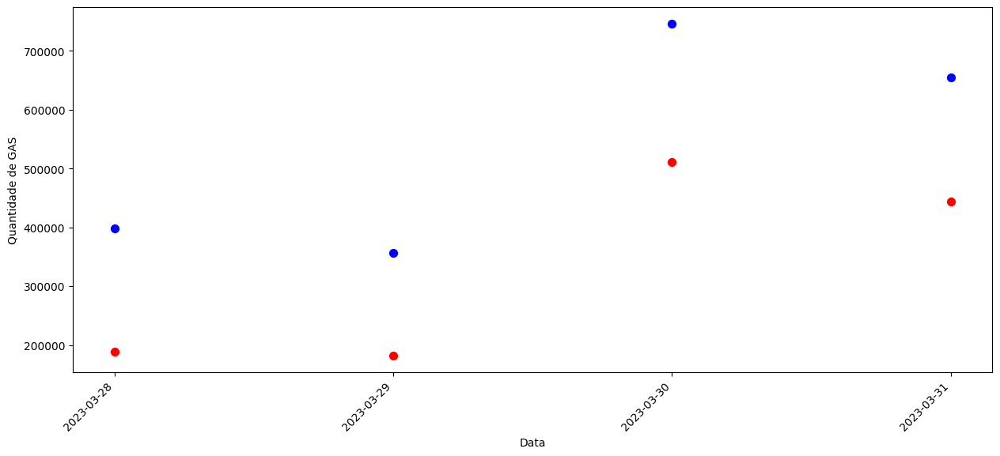

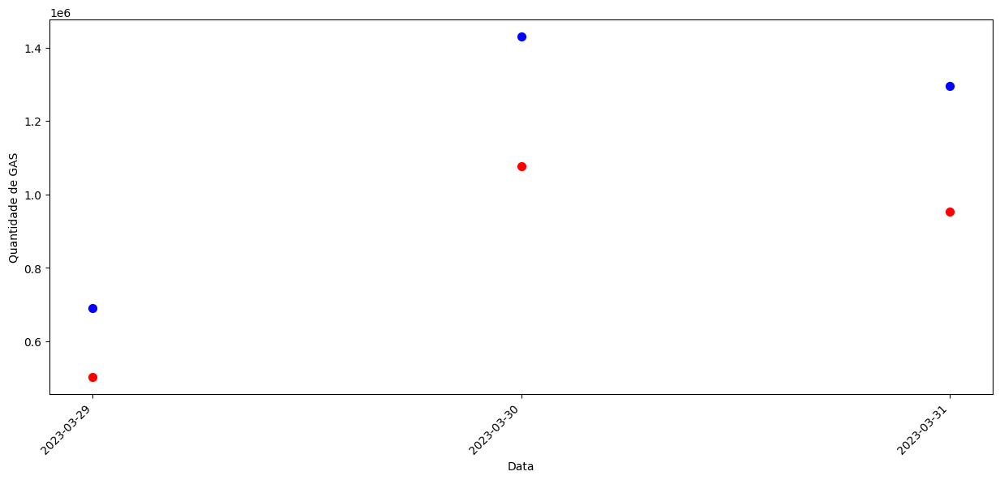

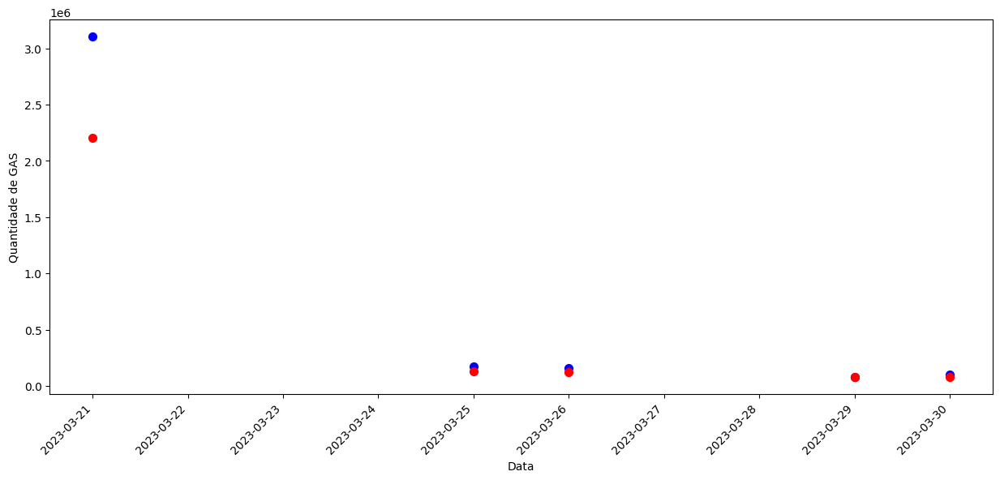

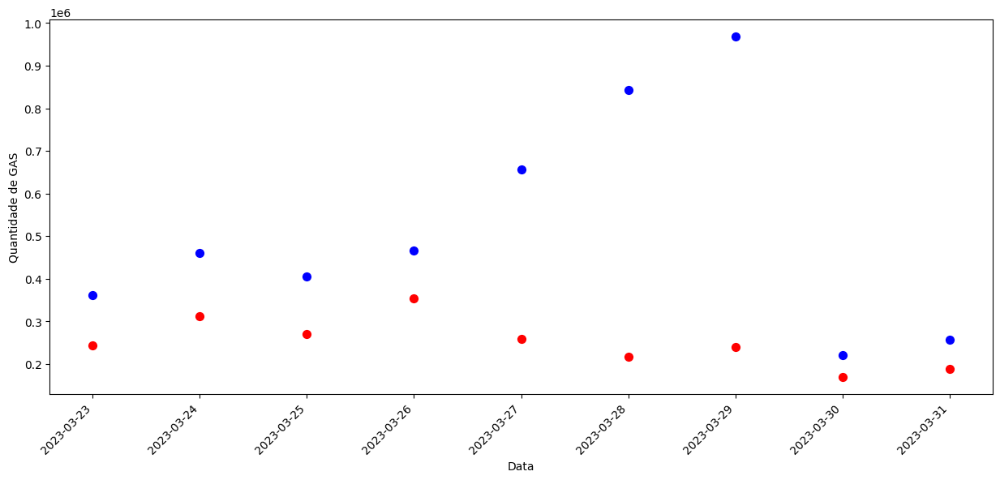

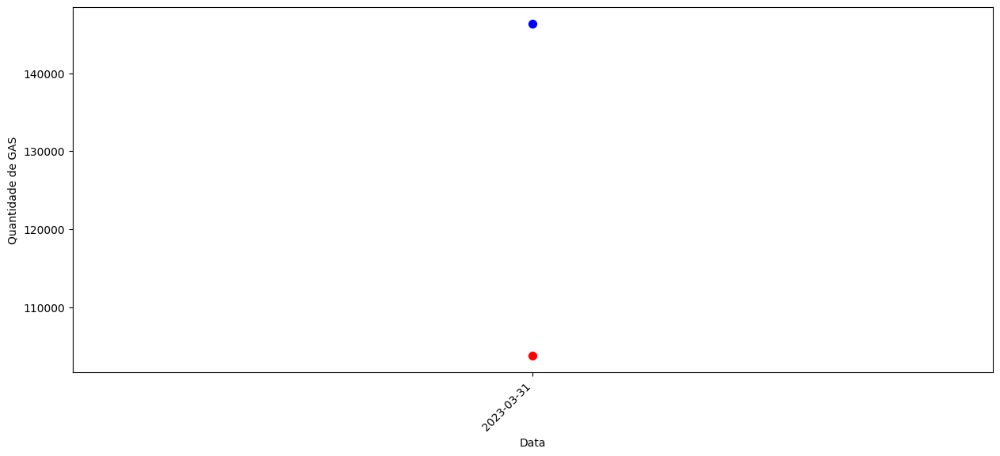

...

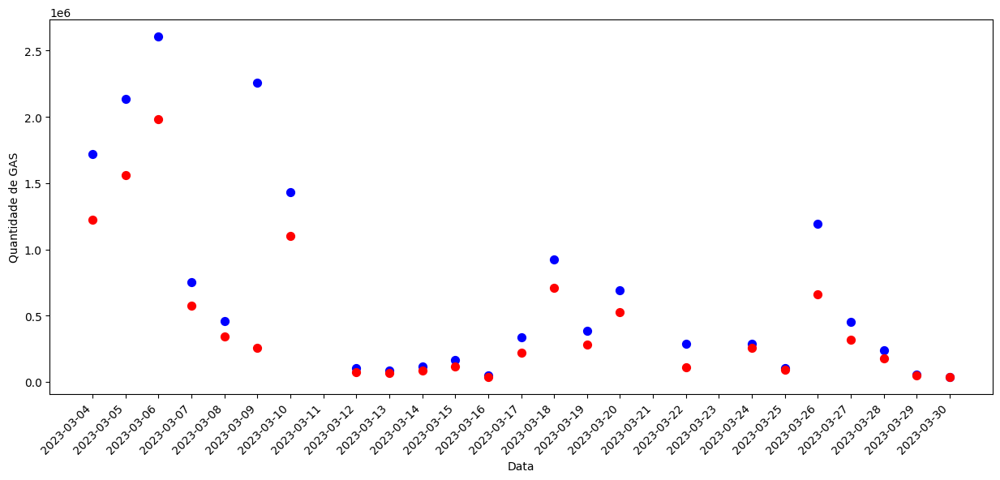

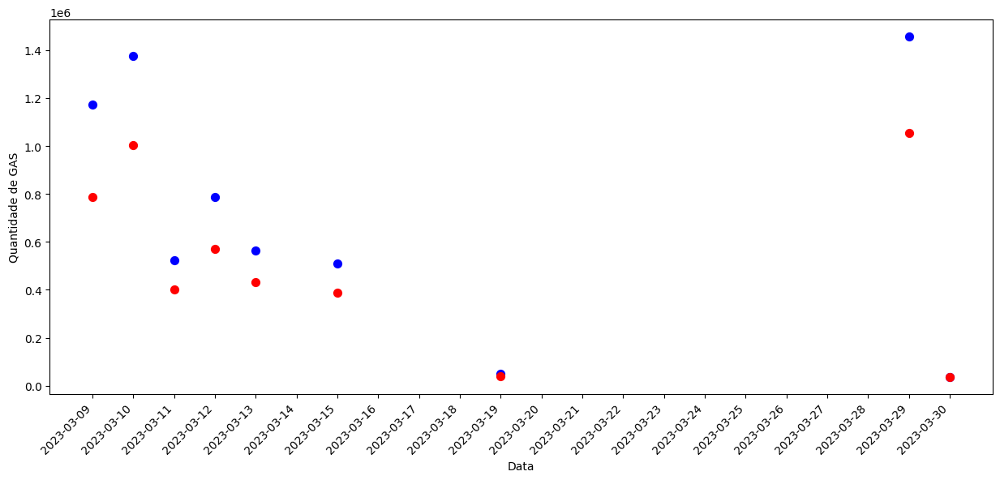

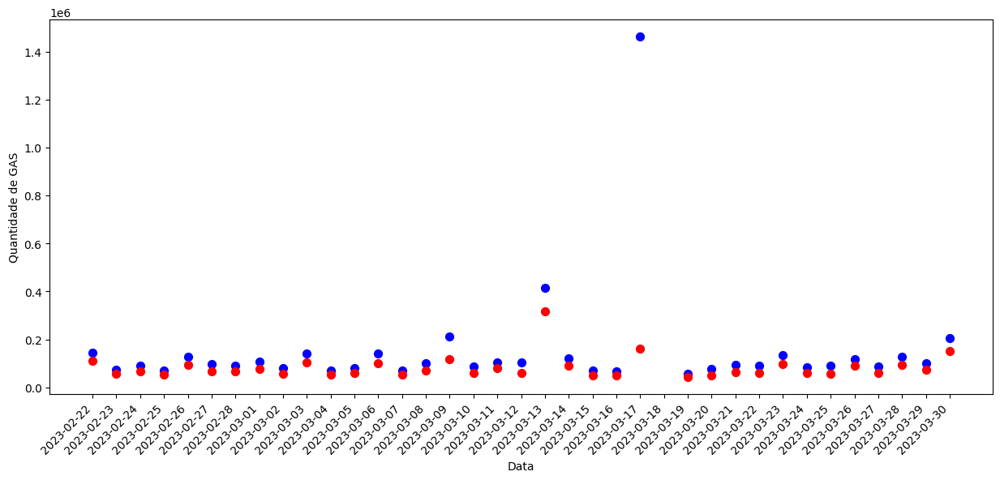

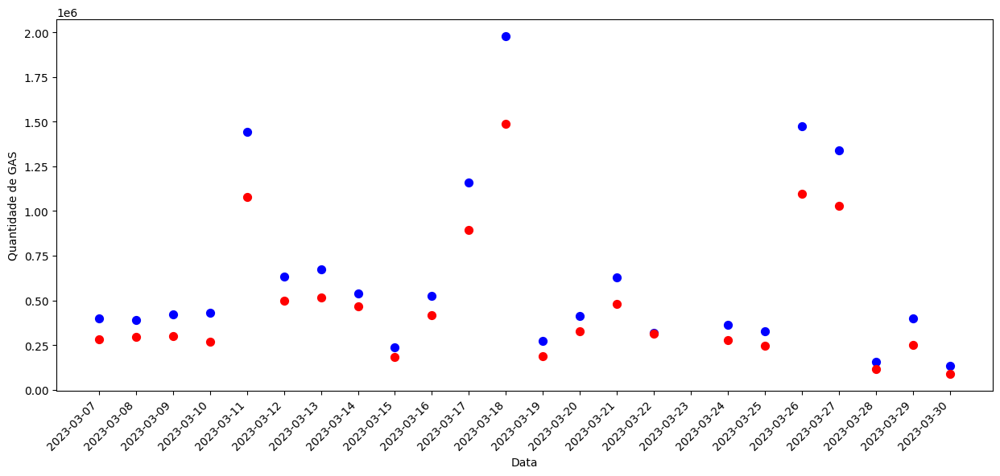

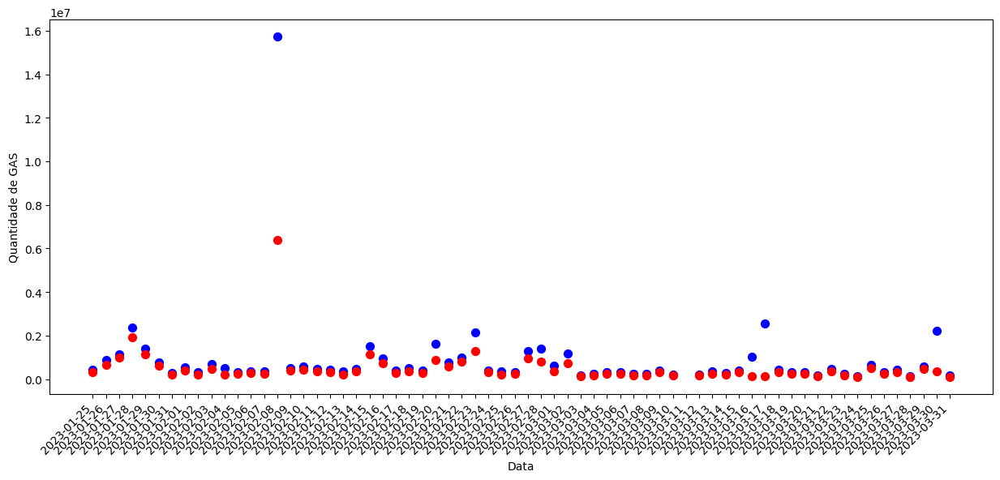

In [ ]:
# Definindo a frequência de amostragem (no caso, diária)
freq = 'D'

# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):

  # Resample dos dados para a frequência definida
  df_resampled = list_df_comum[i].resample(freq).mean()

  # Definindo o tamanho da figura
  plt.figure(figsize=(15, 6))

  # Plotando os pontos de GAS
  plt.scatter(df_resampled.index, df_resampled['GAS'], s=50, c='blue')

  # Plotando os pontos de RECEIPT_GAS_USED
  plt.scatter(df_resampled.index, df_resampled['RECEIPT_GAS_USED'], s=50, c='red')

  # Definindo os rótulos do eixo x e y
  plt.xlabel('Data')
  plt.ylabel('Quantidade de GAS')

  # Definindo os ticks e rótulos do eixo x
  xticks = df_resampled.index
  plt.xticks(xticks, rotation=45, ha='right')

  # Exibindo o gráfico
  plt.show()

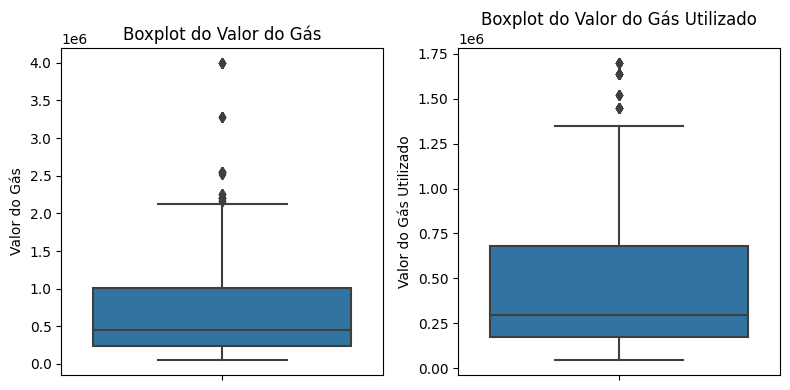

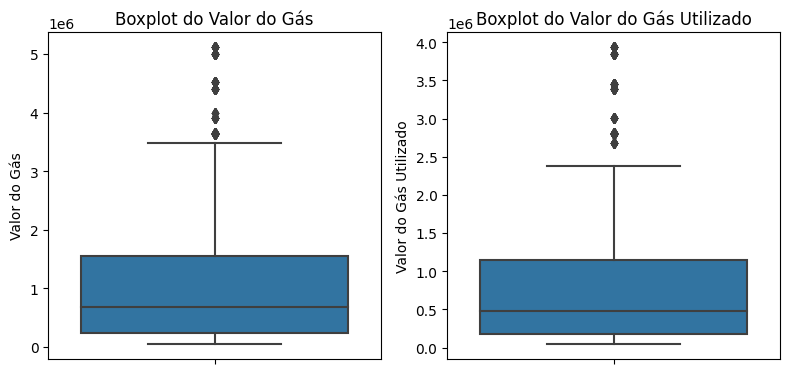

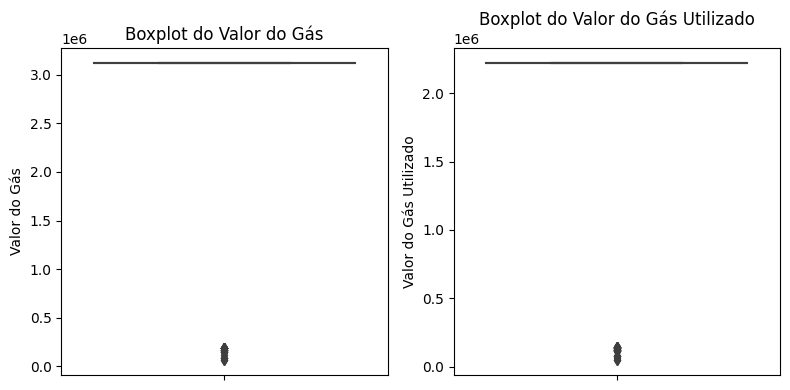

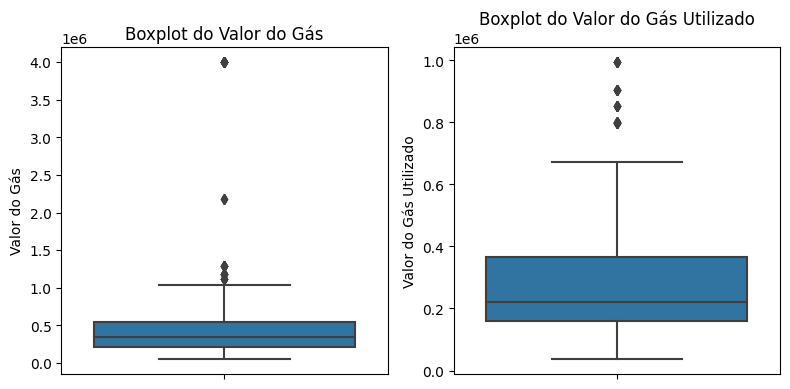

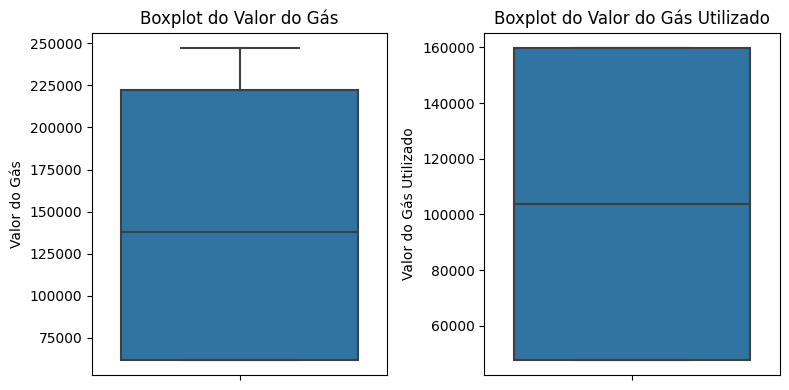

...

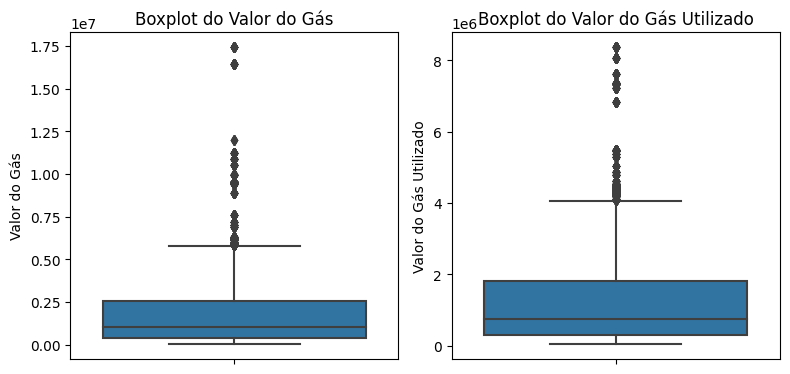

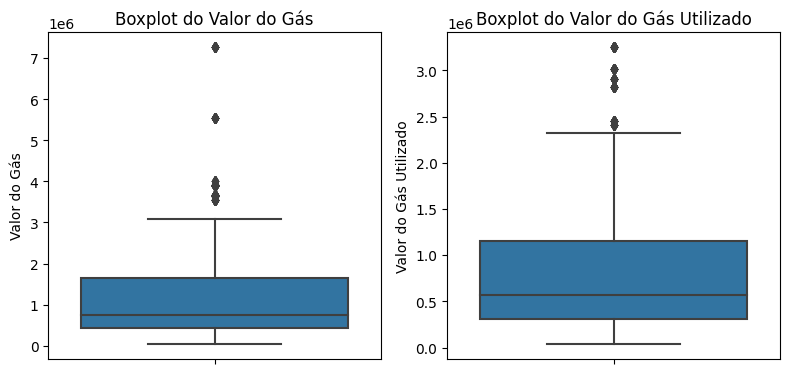

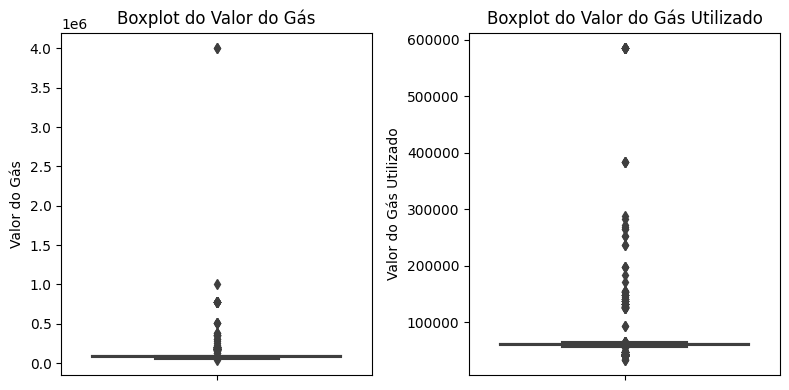

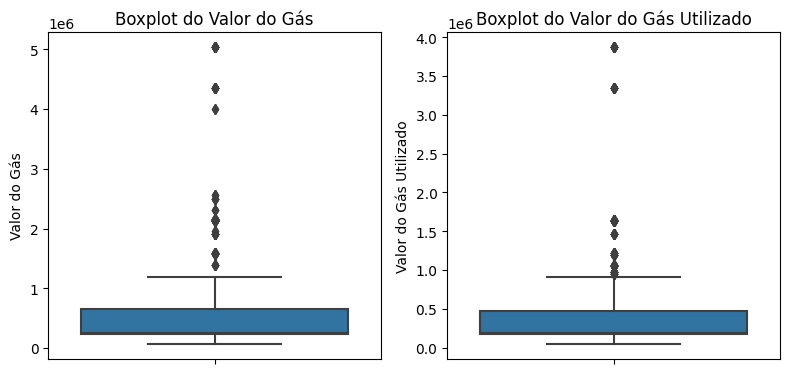

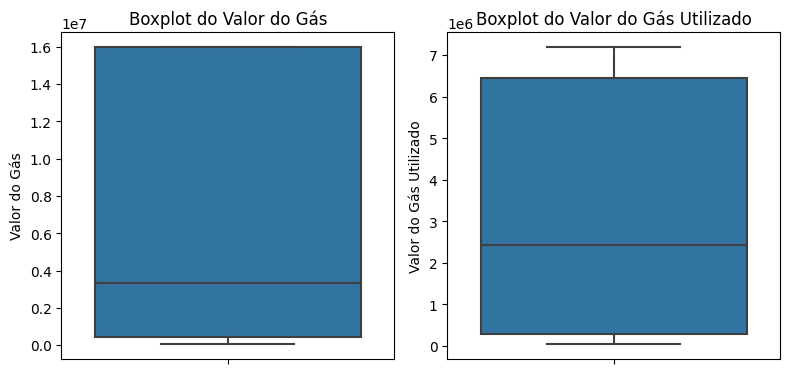

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_comum)):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    sns.boxplot(data=list_df_comum[i], y='GAS', ax=ax[0])
    sns.boxplot(data=list_df_comum[i], y='RECEIPT_GAS_USED', ax=ax[1])

    ax[0].set_title('Boxplot do Valor do Gás')
    ax[0].set_ylabel('Valor do Gás')
    ax[1].set_title('Boxplot do Valor do Gás Utilizado')
    ax[1].set_ylabel('Valor do Gás Utilizado')

    plt.tight_layout()
    plt.show()


In [ ]:
from sklearn.ensemble import IsolationForest

# Transformar a série temporal em um array 2D (necessário para o Isolation Forest)
X = serie_temporal_gas.values.reshape(-1, 1)

# Inicializar e ajustar o modelo Isolation Forest
model = IsolationForest(contamination=0.05)  # Define a taxa esperada de anomalias
model.fit(X)

# Prever as anomalias
anomaly_scores = model.decision_function(X)
anomaly_labels = model.predict(X)



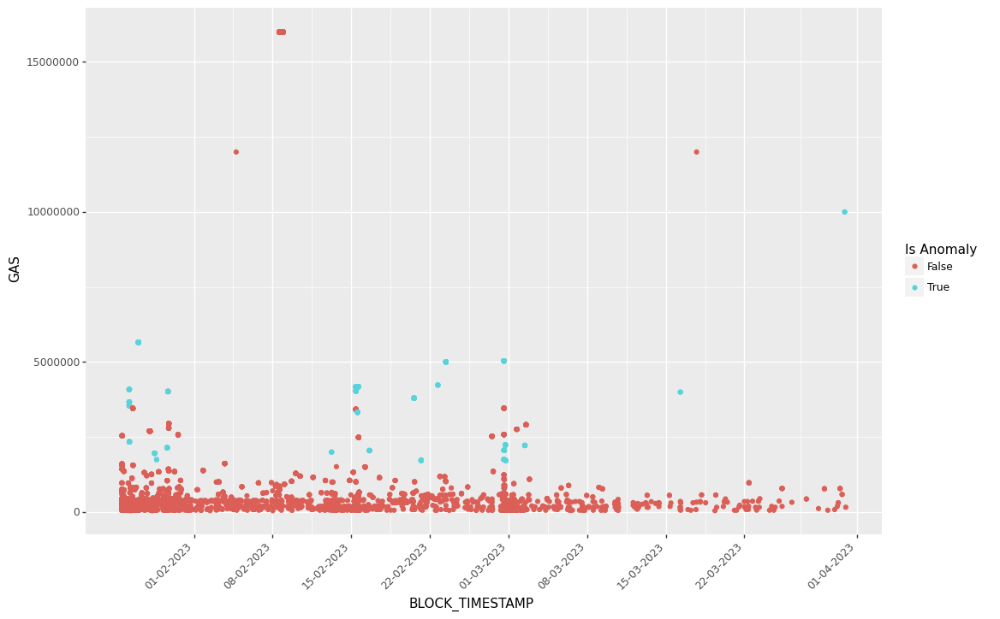

<ggplot: (8750340057644)>

In [ ]:
from plotnine import ggplot, aes, geom_point, scale_x_datetime, theme, element_text

# Transformar a série temporal em um DataFrame
df2 = pd.DataFrame({'BLOCK_TIMESTAMP': serie_temporal_gas.index, 'GAS': serie_temporal_gas.values})

# Adicionar as pontuações de anomalia como uma coluna no DataFrame original
df2['Anomaly Score'] = anomaly_scores

# Converter a coluna 'Anomaly Score' para valores booleanos indicando se é uma anomalia ou não
df2['Is Anomaly'] = df2['Anomaly Score'] < 0

# Visualizar os pontos de dados e as anomalias detectadas
(ggplot(df2, aes(x='BLOCK_TIMESTAMP', y='GAS', color='Is Anomaly'))
 + geom_point()
 + scale_x_datetime(date_labels='%d-%m-%Y')
 + theme(axis_text_x=element_text(rotation=45, hjust=1), figure_size=(12, 8))
)


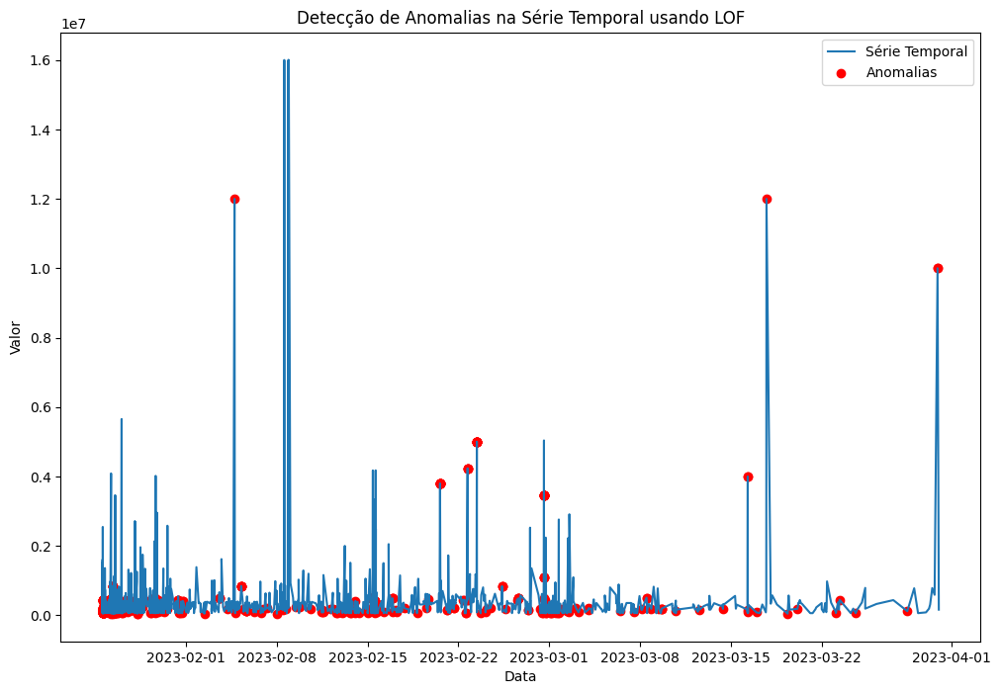

In [ ]:
from sklearn.neighbors import LocalOutlierFactor

# Transformar a série temporal em um array 2D (necessário para o LOF)
X = serie_temporal_gas.values.reshape(-1, 1)

# Inicializar e ajustar o modelo LOF
model = LocalOutlierFactor(contamination=0.05)  # Define a taxa esperada de anomalias
anomaly_labels = model.fit_predict(X)

# Filtrar as anomalias
anomaly_indices = anomaly_labels == -1
anomaly_scores = model.negative_outlier_factor_[anomaly_indices]

# Plotar a série temporal com as anomalias destacadas
plt.figure(figsize=(12, 8))
plt.plot(serie_temporal_gas.index, serie_temporal_gas.values, label='Série Temporal')
plt.scatter(serie_temporal_gas.index[anomaly_indices], serie_temporal_gas.values[anomaly_indices], color='red', label='Anomalias')
plt.xlabel('Data')
plt.ylabel('Valor')
plt.title('Detecção de Anomalias na Série Temporal usando LOF')
plt.legend()
plt.show()
